# CFD Solver for Lid-Driven Cavity Flow 

<br> This is a course simulation project to write a CFD solver in Python. 
<br>
<br> **Objective:** CFD Solver for Lid-Driven Cavity Flow 
<br>
<br> **Notes:** The *Predictor-Corrector Scheme* will be used to solve the *Incompressible Navier-Stokes Equation*. 
<br>
</br> **Resources / References**: 
<br> - Owkes, M. (2020). _A guide to writing your first CFD solver_. Retrieved from https://www.montana.edu/mowkes/research/source-codes/GuideToCFD_2020_02_28_v2.pdf  
<br> - Barba, Lorena A., and Forsyth, Gilbert F. (2018). _CFD Python: the 12 steps to Navier-Stokes equations [Step 11: Cavity Flow with Navier–Stokes]_. Journal of Open Source Education. Retrieved from https://github.com/barbagroup/CFDPython/blob/master/lessons/14_Step_11.ipynb

## Navier-Stokes Equation 

<br> We assume, that we are dealing with incompressible flow, and thus, it allows us to use the *incompressible Navier-Stokes Equation*. 
#### Continuity Equation (Conservation of Mass)
$$ \nabla \mathbf{u} = 0$$
which breaks down to: 
$$ \frac{\partial u}{\partial x} + \frac{\partial u}{\partial y} = 0$$
#### Conservation of Momentum
$$ \frac{\partial u}{\partial t} + \mathbf{u} \cdot \nabla \mathbf{u} = -\frac{1}{\rho} \nabla p + \nu \nabla^2 \mathbf{u}$$
which breaks down to: 

$$\frac{\partial u}{\partial t} +  \left( u \frac{\partial u}{\partial x}+ v\frac{\partial u}{\partial y} \right) = - \frac{1}{\rho} \frac{\partial p}{\partial x} + \nu \left(\frac{\partial^2 u}{\partial^2 x} + \frac{\partial^2 u}{\partial^2 y}\right)$$


$$\frac{\partial v}{\partial t} + \left( u \frac{\partial v}{\partial x}+ v\frac{\partial v}{\partial y} \right) = - \frac{1}{\rho} \frac{\partial p}{\partial y} + \nu \left(\frac{\partial^2 v}{\partial^2 x} + \frac{\partial^2 v}{\partial^2 y}\right)$$


## Initializing Global Variables and Parameters 

In [1]:
# Importing Libraries and Tools
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
import sys

In [2]:
#Initialize Global Variables 

#Continuous domain
x_min = 0 
x_max = 2
n_x = 41 # 41 mesh points
dx = (x_max - x_min)/ (n_x -1) # 40 divisions

y_min= 0
y_max = 2
n_y = 41
dy = (y_max - y_min)/(n_y -1) 

# Velocities
u = np.zeros((n_y, n_x))
v = np.zeros((n_y, n_x))

#Pressure
p = np.zeros((n_y, n_x))

# Global Variables / Parameters
nu = 0.1
rho = 1 # assume incompressible flow
dt = 0.001

## Computational Mesh 
<br> The mesh used is uniform with the mesh cells of width $\Delta x$ and height of $\Delta y$. The grid divides the domain in to $n_x$ *x* $n_y$ , where $n_x$ and $n_y$ are the numbers of cells in $x$ and $y$ directions respectively. 

In [3]:
# Computational Mesh 

x = np.linspace(x_min, x_max, n_x)
y = np.linspace(y_min, y_max, n_y)
X, Y= np.meshgrid(x,y)

### Boundary Conditions for the Velocities
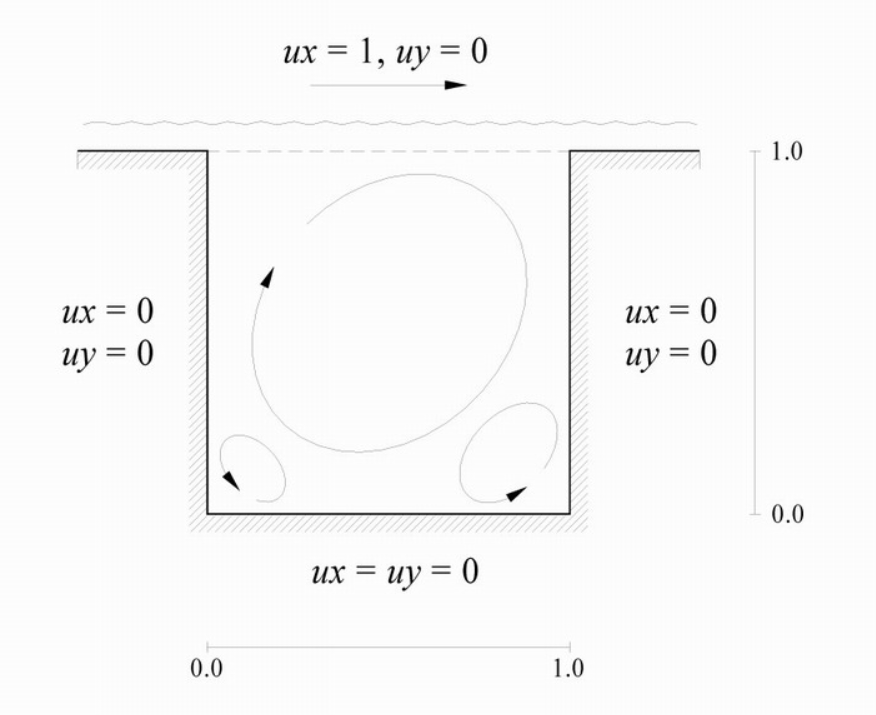

<br> Picture from: http://www.nacad.ufrj.br/~rnelias/gallery/cavity.html
<br> We are using **Dirichlet ("Fixed") boundary condition** (Barba et.al (2012)) for the velocities.

In [4]:
def set_velocity_boundary(u,v):
    # Velocidty boundary conditions (Dirichlet or "fixed")
    u[0, :]  = 0
    u[:, 0]  = 0
    u[:, -1] = 0
    u[-1, :] = 1    # set velocity on cavity lid equal to 1
    v[0, :]  = 0
    v[-1, :] = 0
    v[:, 0]  = 0
    v[:, -1] = 0

    return u, v

### Boundary Conditions for Pressure

<br> **Neumann boundary condition** (Reference: Barba et.al (2012)) is used.
<br>
<br> For *Neumann Boundary Condition* , the boundary value of pressure depends on the pressure of the nearest comlumn or row. 

In [5]:
# Pressure Boundary Condition 

def set_pressure_boundary(p):
    # Pressure boundary conditions (Neumann or "second-type")
    p[:, -1] = p[:, -2] # dp/dx = 0 at x = 2
    p[0, :] = p[1, :]   # dp/dy = 0 at y = 0
    p[:, 0] = p[:, 1]   # dp/dx = 0 at x = 0
    # Pressure boundary conditions (Dirichlet or "fixed")
    p[-1, :] = 0        # p = 0 at y = 2

    return p


## Temporal Discretization 

<br> **Finite Difference Method** will be used for the Discretization. 
<br>
<br> *Discretized Navier Stokes:*
$$\frac{\mathbf{u}^{n+1} - \mathbf{u}^{n}}{\Delta t} = -\frac{1}{\rho} \nabla p -  \mathbf{u}^{n} \cdot \nabla \mathbf{u}^{n} + \nu \nabla^2 \mathbf{u}^{n}$$

<br> *Small notes:* The time step $\Delta t$ should be chosen, that $u \Delta t / \Delta x < 1$ **(Courant - Friedrichs - Lewy (CFL) condition)**. 

In [6]:
#Discretization through Finite Difference Method 

def diff_1st_x(f): # We are using Central differencing Scheme
  return (f[1:-1, 2:] - f[1:-1,0:-2])/(2*dx)

def diff_1st_y(f):
  return (f[2:, 1:-1] - f[0:-2,1:-1])/(2*dy)

def diff_2nd_x(f):
  return (
      # f(i-1,j) + 2*f(i,j) + f(i+1,j) 
      (f[1:-1,0:-2] - 2*f[1:-1,1:-1] + f[1:-1,2:])
      /dx**2
      ) 
  
def diff_2nd_y(f):
  return (
      # f(i,j-1) + 2*f(i,j) + f(i,j+1) 
      (f[0:-2,1:-1] - 2*f[1:-1,1:-1] + f[2:,1:-1])
      /dy**2
      )

def laplacian(f):
  return (diff_2nd_x(f) + 
          diff_2nd_y(f))

## Predictor and Corrector Scheme

<br> The previous equation on discretized *Navier-Stokes* does not include the role of continuity and $u^{n+1}$ is not guaranteed to be divergence free. To introduce continuity we solve the equation using **Predictor and Corrector or fractional step method**. 
<br>
<br> The *Navier-Stokes Equation* is solved in two steps: 
<br>
<br> - The *predictor* step: 
$$\frac{\mathbf u^{*} - \mathbf u^{n}}{\Delta t} = -  \mathbf{u}^{n} \cdot \nabla \mathbf{u}^{n} + \nu \nabla^2 \mathbf{u}^{n} $$
<br> - The *corrector* step: 
$$\frac{\mathbf u^{n+1} - \mathbf u^{*}}{\Delta t} = -\frac{1}{\rho} \nabla p^{n+1} $$
<br> From the previous equation (see corrector step) and the mass continuity equation, we can derive the **pressure Poisson equation**.
$$\frac{\nabla \mathbf{u}^{n+1} - \nabla \mathbf{u}^{*}}{\Delta t} = -\frac{1}{\rho} \nabla^2 p^{n+1}$$
from *continuity equation:* $\nabla u^{n+1} = 0$
$$ \nabla^2 p^{n+1} = \frac{\rho}{\Delta t} \nabla \mathbf{u}^{*}$$

### Predictor Step

<br> Calculate the intermediate velocity $u^{*}$ 
$$\mathbf{u}^{*} = (-  \mathbf{u}^{n} \cdot \nabla \mathbf{u}^{n} + \nu \nabla^2 \mathbf{u}^{n}) \Delta t + \mathbf{u}^{n}$$ 

In [7]:
# Predictor 
def vel_star(un, vn, dt):
    u_star = un.copy()
    v_star = vn.copy()
    
    # List starts from 1, because we don't want to change our defined boundary conditions
    u_star[1:-1, 1:-1]= (nu * laplacian(un) - (un[1:-1, 1:-1]*diff_1st_x(un) + vn[1:-1, 1:-1]*diff_1st_y(un)))*dt + un[1:-1, 1:-1]
    
    v_star[1:-1,1:-1]=  (nu * laplacian(vn) -(un[1:-1, 1:-1]*diff_1st_x(vn) + vn[1:-1, 1:-1]*diff_1st_y(vn)))*dt + vn[1:-1, 1:-1]
    
    return u_star,v_star  

### Pressure Poisson Equation 

<br> We can solve the equation using methods of linear algebra , in which: 
$$\mathbf{A} p^{n+1} = \mathbf{b}$$ 
<br> let $\mathbf{b} = \frac{\rho}{\Delta t} \nabla \mathbf{u}^{*}$

In [8]:
# Solving the right hand side of the Equation 

def get_b(u_star,v_star,dt):
    # Right hand side of the pressure Poisson Equation
    # (Divergence of vector-valued function)
    div_vel_star = diff_1st_x(u_star) + diff_1st_y(v_star)
    b = (rho/dt) * div_vel_star
    return b

then: 
$$\frac{\partial^2 p^{n+1}}{\partial x} + \frac{\partial^2 p^{n+1}}{\partial y} = \mathbf{b}$$  
Through Discretization we get:
$$\frac{p^{n+1}(i-1,j) - 2p^{n+1}(i,j) + p^{n+1}(i+1,j)}{\Delta x^2}+ \frac{p^{n+1}(i-1,j) - 2p^{n+1}(i,j) + p^{n+1}(i+1,j)}{\Delta y^2} = b$$
<br> finally 
$$ p^{n+1}(i,j)    = \frac{\Delta y^2 \left(p^{n+1}(i-1,j) + p^{n+1}(i+1,j) \right) + \Delta x^2 \left( p^{n+1}(i-1,j) + p^{n+1}(i+1,j) \right) - b^n(i,j) \Delta x^2 \Delta y^2}{2\left( \Delta y^2 + \Delta x^2 \right) }$$
<br> *Matrix illustration from Owes(2020):*
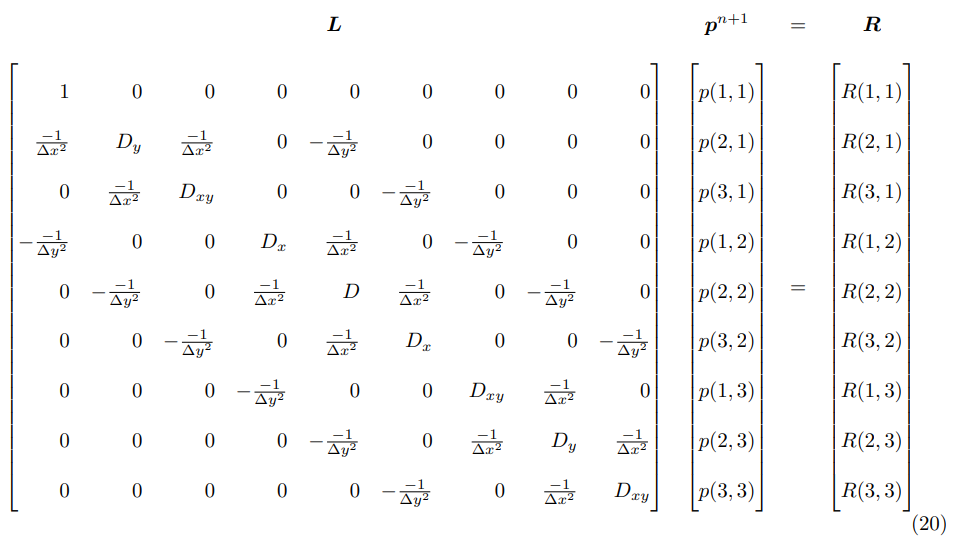

In [9]:
# Left hand side of Equation / pressure Poisson Equation

def pressure_Poisson(p,b):
    pn = p.copy()
    # (pn(i-1,j) + pn(i+1,j)) * dy**2 
    term1 = (pn[1:-1,0:-2] + pn[1:-1,2:]) * dy**2
    # (pn(i,j-1) + pn(i,j+1)) * dx**2
    term2 = (pn[0:-2,1:-1] + pn[2:,1:-1]) * dx**2
    # term 3 is -b * dx^2  * dy^2
    term3 = -(b * (dx**2 * dy**2))
    
    p[1:-1,1:-1] = (term1 + term2 + term3)/(2*(dx**2 + dy**2))
    # Reset Boundary Conditions
    p = set_pressure_boundary(p)
    
    return p

### Corrector Step

<br> Calculate the corrected velocity from the previous predictor step.
$$\mathbf{u}^{n+1}=\Delta t\left( - \frac{1}{\rho}  \nabla p^{n+1}\right) + \mathbf{u}^*$$

In [10]:
# Corrector Step

def corrector_step(u_star, v_star, p, dt, rho):
    u = np.empty_like(u_star)
    v = np.empty_like(v_star)
    
    u[1:-1,1:-1] = (-dt/rho)*(diff_1st_x(p)) + u_star[1:-1,1:-1]
    v[1:-1,1:-1] = (-dt/rho)*(diff_1st_y(p)) + v_star[1:-1,1:-1]
    
    # reset velocity boundary
    u, v = set_velocity_boundary(u, v)
    
    return u, v

## Run Simulation 

In [11]:
def cavity_flow_simulation(nt, u, v, dt, dx, dy, p, rho, nu):
    for n in range(nt):
        un = u.copy()
        vn = v.copy()
        
        # Predictor Step
        u_star, v_star = vel_star(un, vn, dt)
        
        #Poisson Equation
        b = get_b(u_star, v_star, dt)
        p = pressure_Poisson(p,b)
        
        #Corrector Step
        u, v = corrector_step(u_star, v_star, p, dt, rho)
        
        return u, v, p

In [12]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)

## Visualization 

In [13]:
def simulation_visuals(): #Plotting with Velocity Vectors
    fig = plt.figure(figsize=(11,7), dpi=100)
    # plotting the pressure field as a contour
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar()
    # plotting the pressure field outlines
    plt.contour(X, Y, p, cmap=cm.viridis)
    # plotting velocity field
    plt.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
    plt.xlabel('X')
    plt.ylabel('Y');

In [14]:
def streamplot_visuals(): #Plotting with Velocitiy Streams
    fig = plt.figure(figsize=(11, 7), dpi=100)
    plt.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
    plt.colorbar()
    plt.contour(X, Y, p, cmap=cm.viridis)
    plt.streamplot(X, Y, u, v)
    plt.xlabel('X')
    plt.ylabel('Y');
    

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: No contour levels were found within the data range.
  import sys


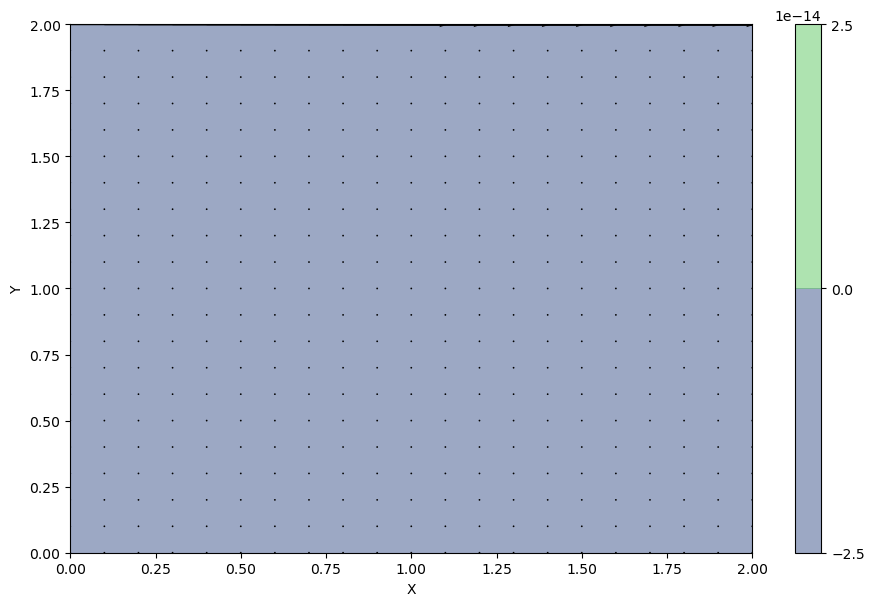

In [15]:
simulation_visuals()

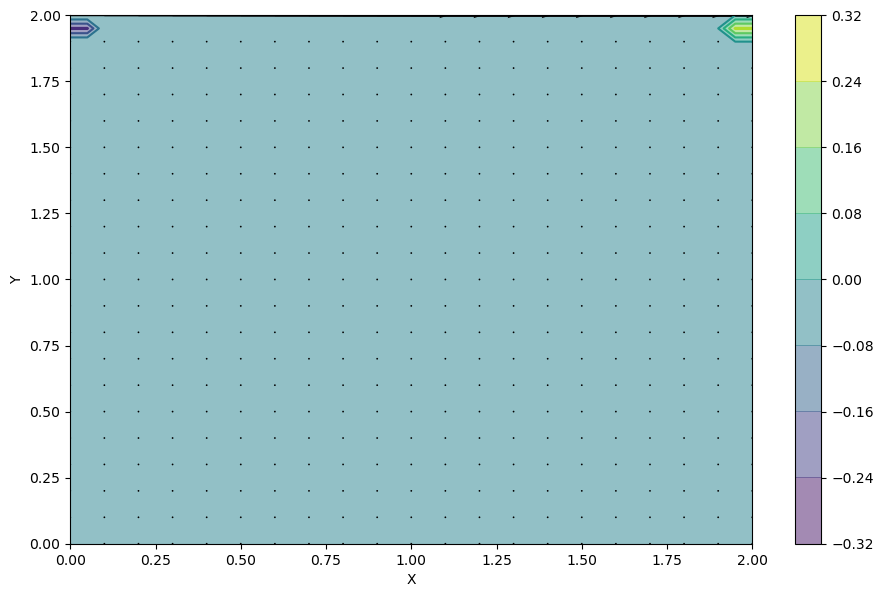

In [16]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

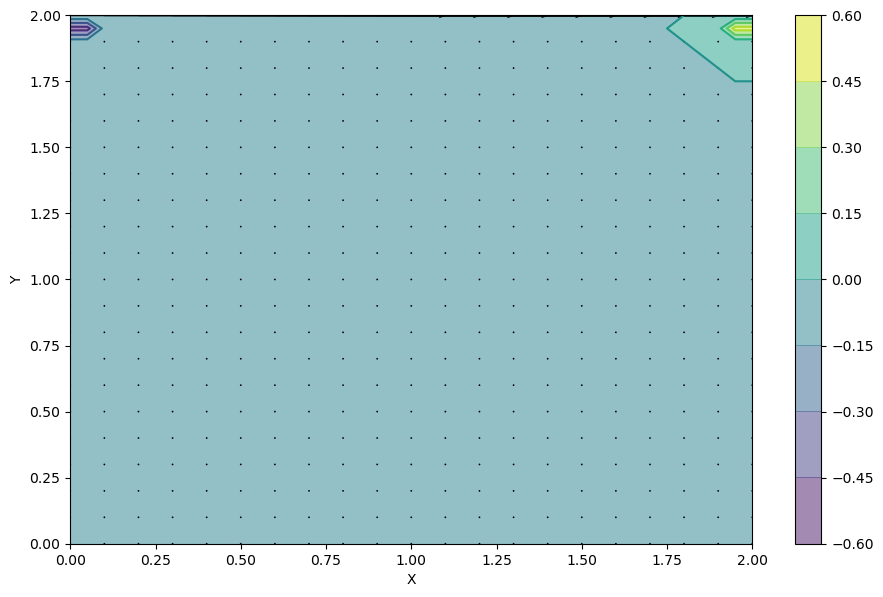

In [17]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

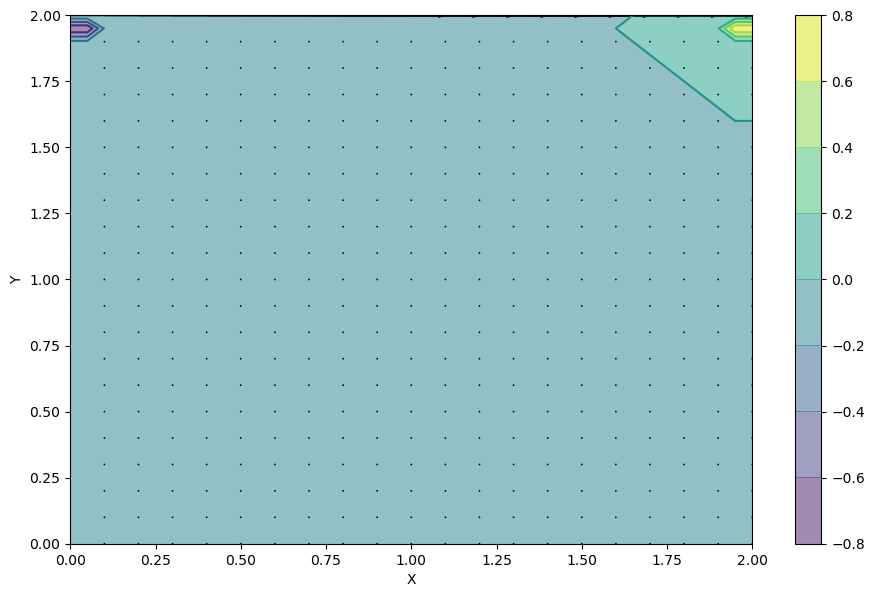

In [18]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

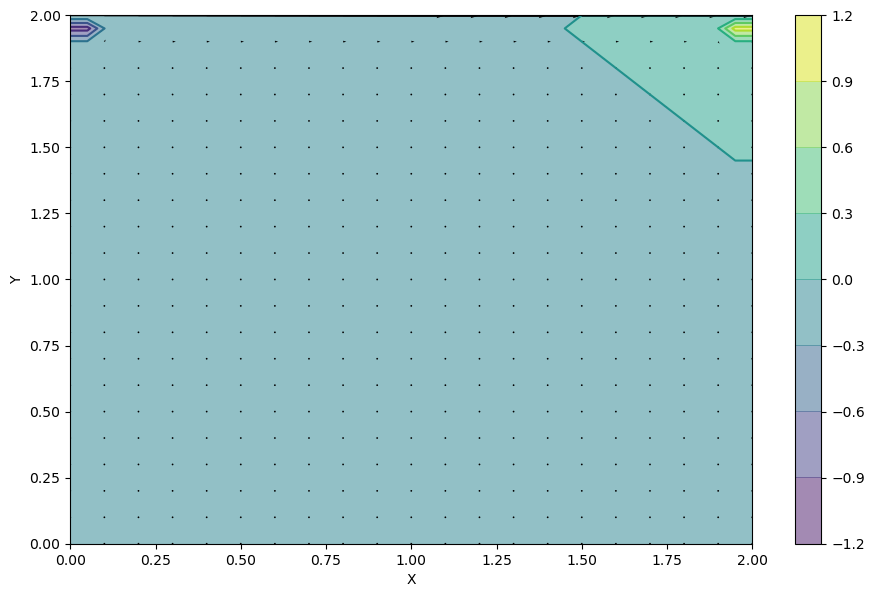

In [19]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

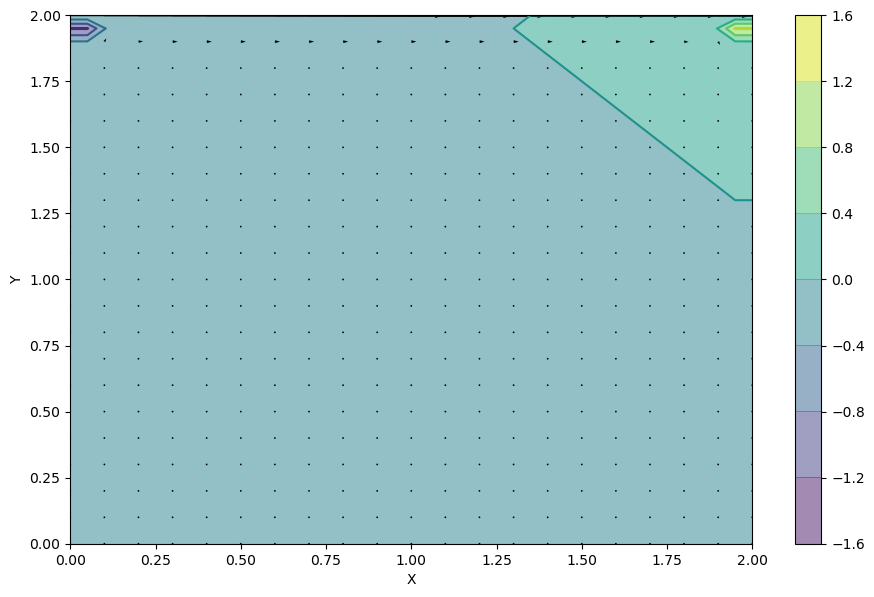

In [20]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

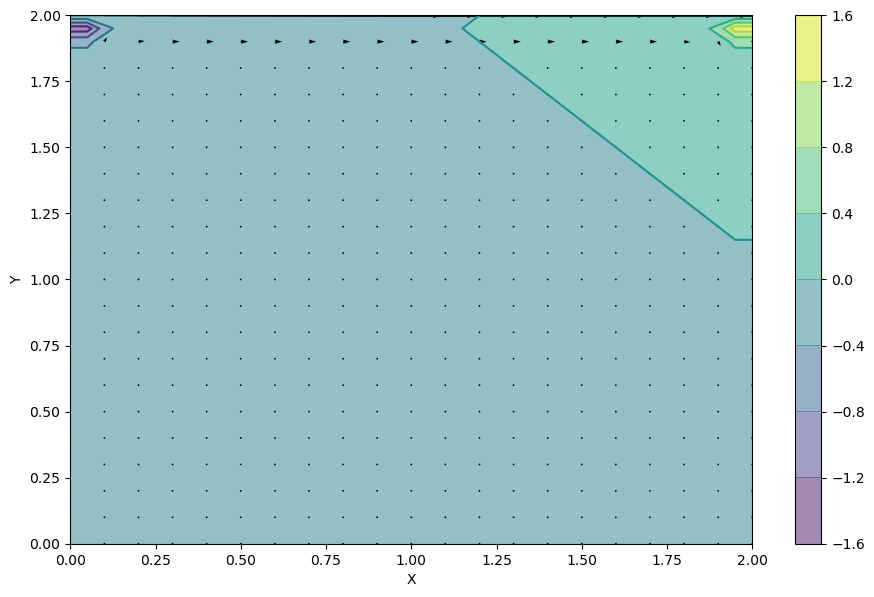

In [21]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

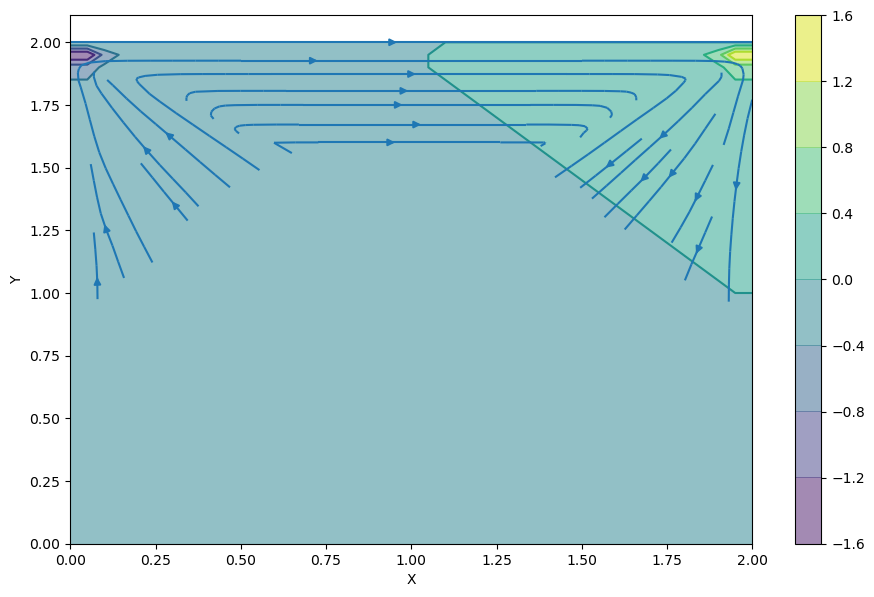

In [22]:
# Halfway Stream Plot Visualisation
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

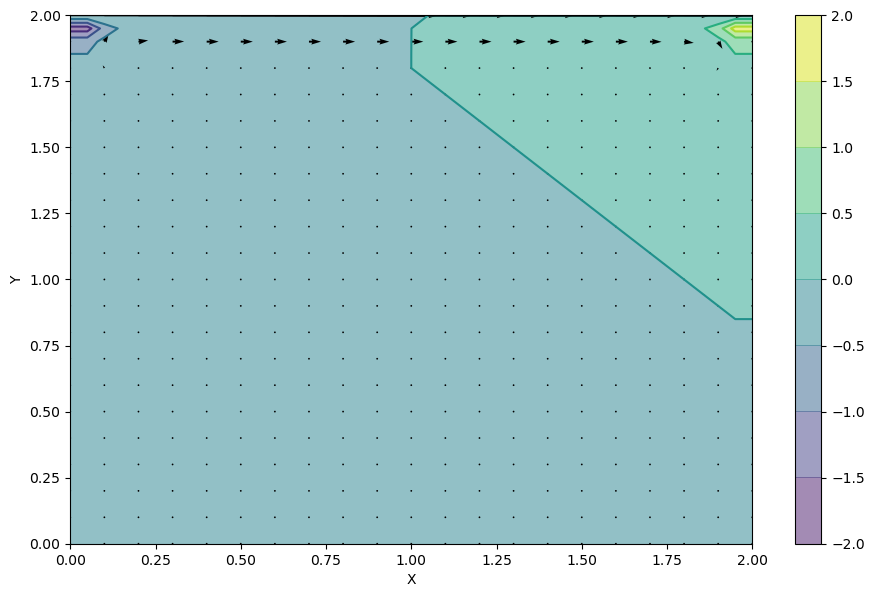

In [23]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

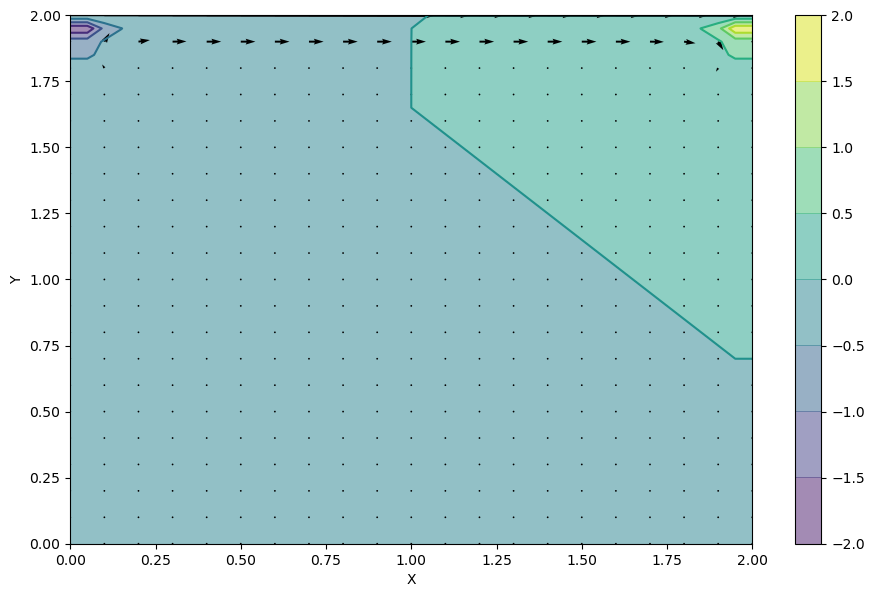

In [24]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

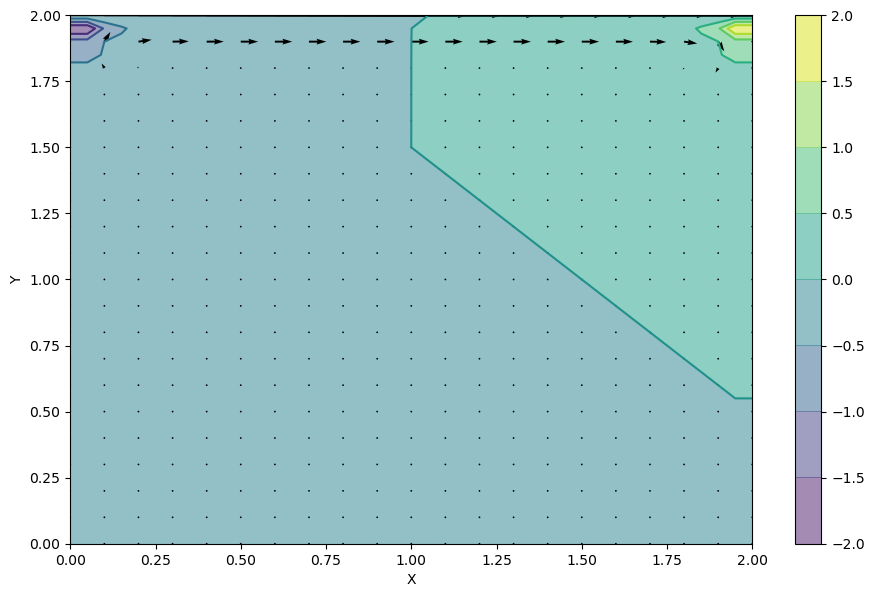

In [25]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

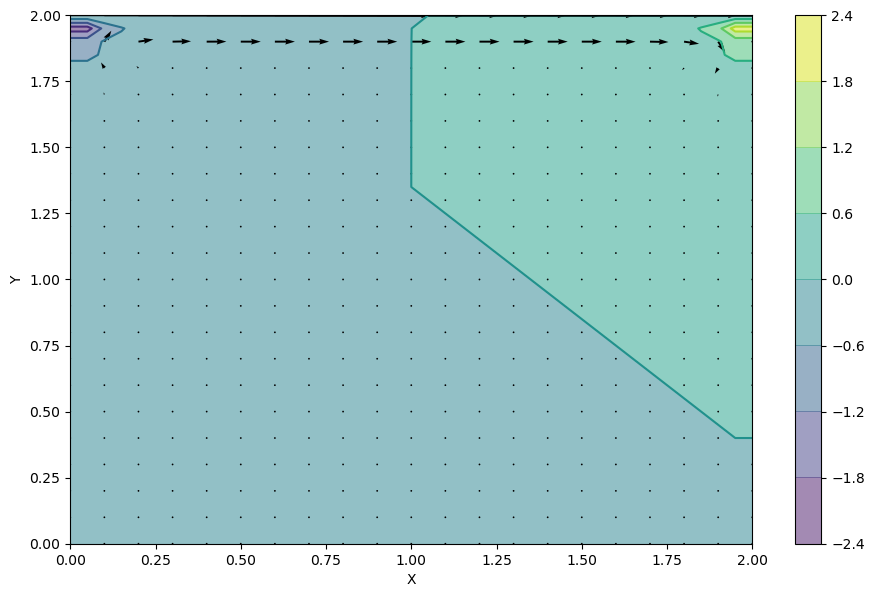

In [26]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

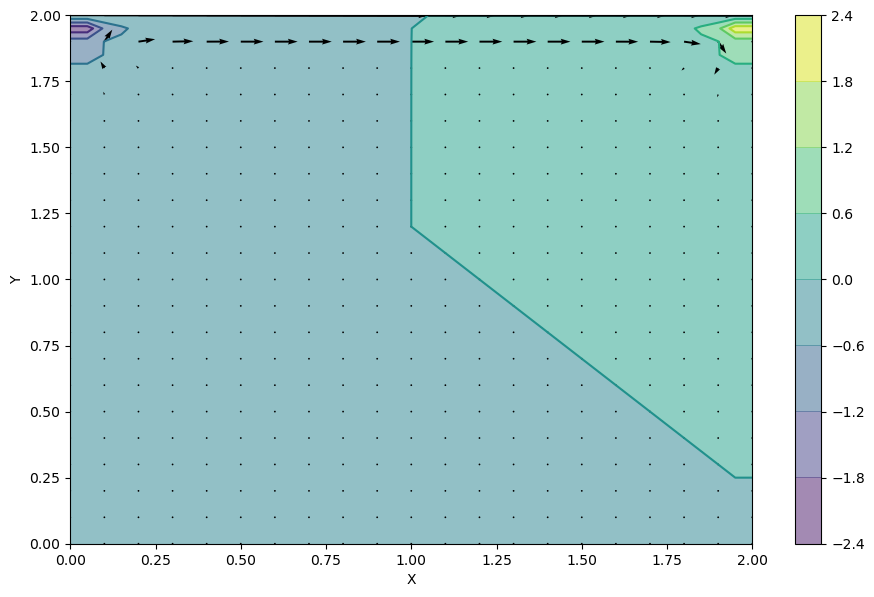

In [27]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

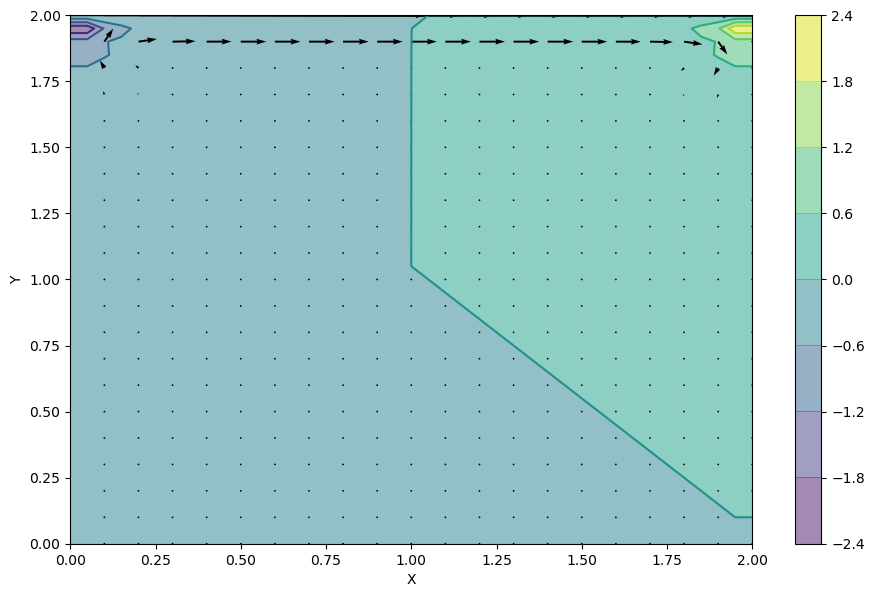

In [28]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

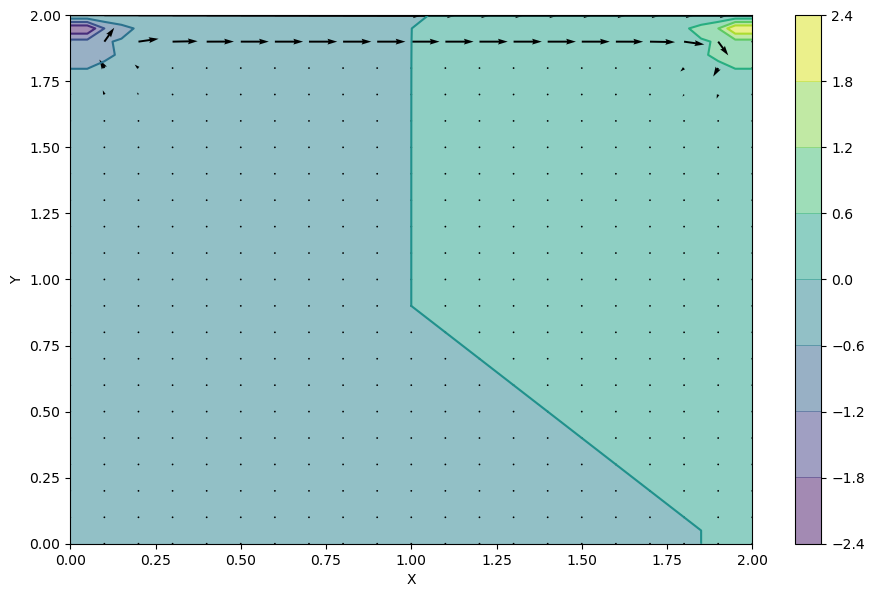

In [29]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

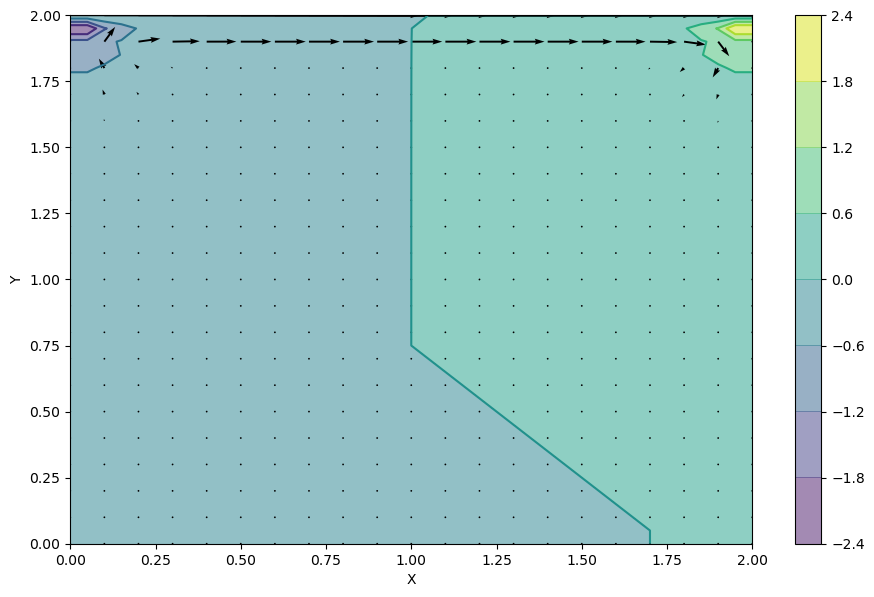

In [30]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

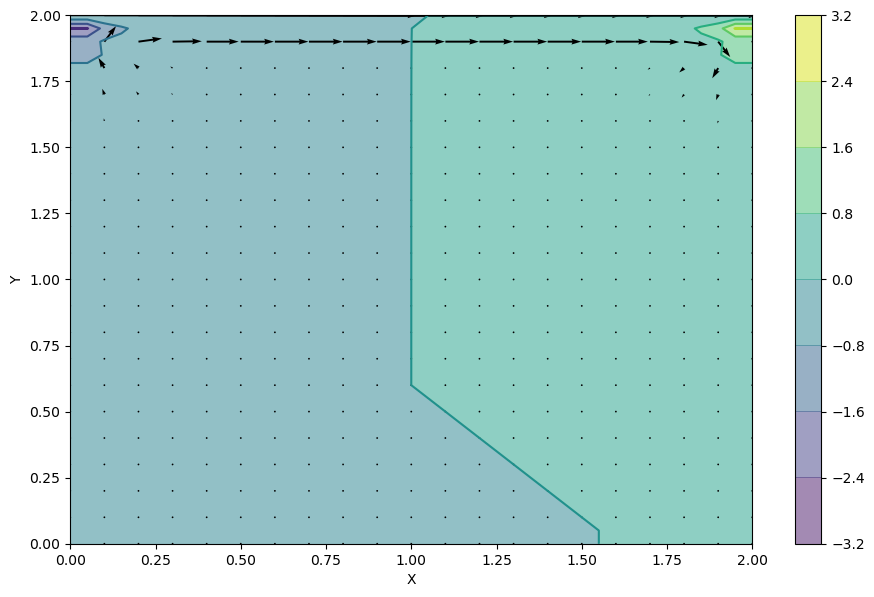

In [31]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

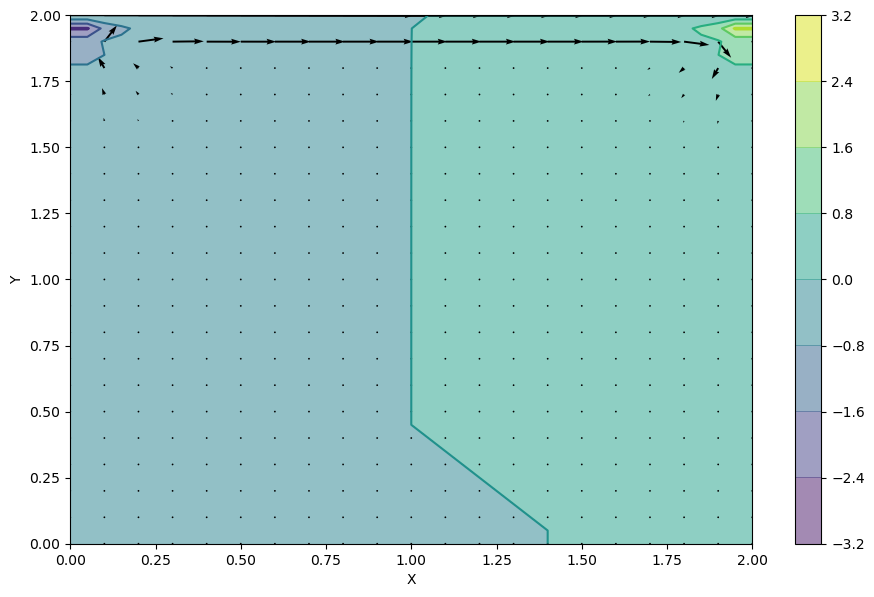

In [32]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

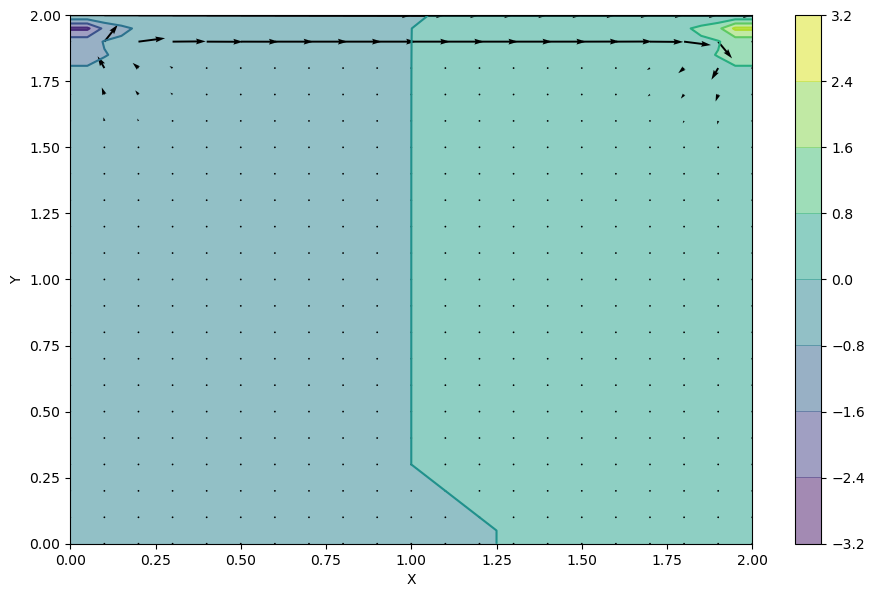

In [33]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

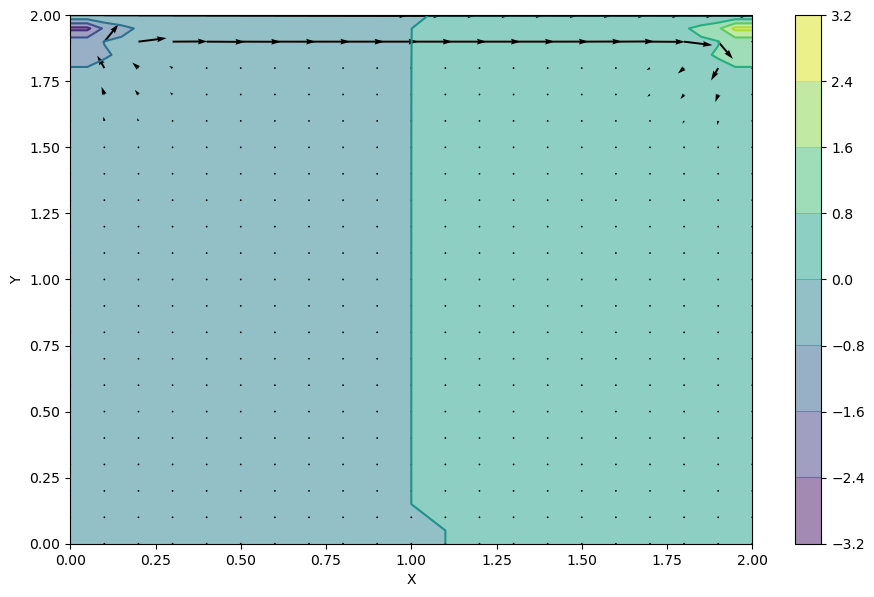

In [34]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

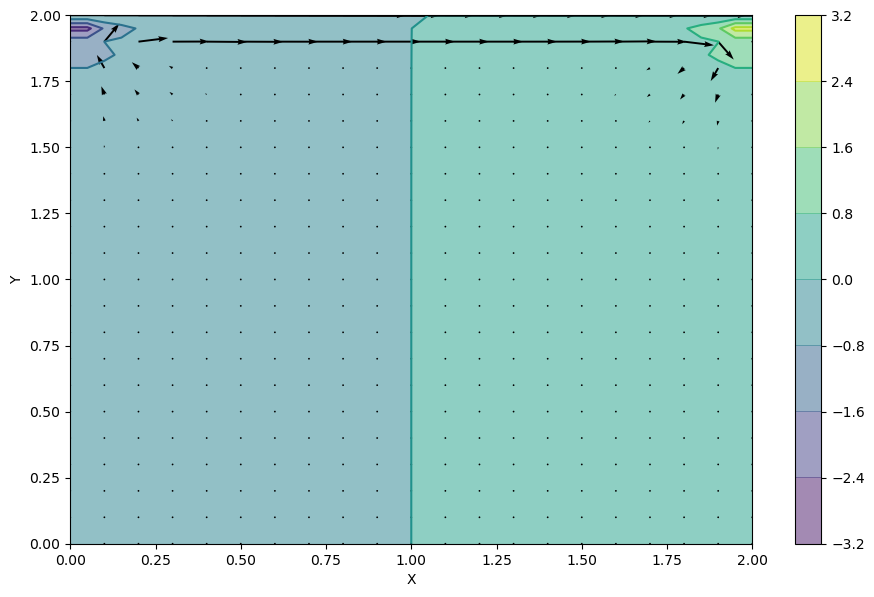

In [35]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

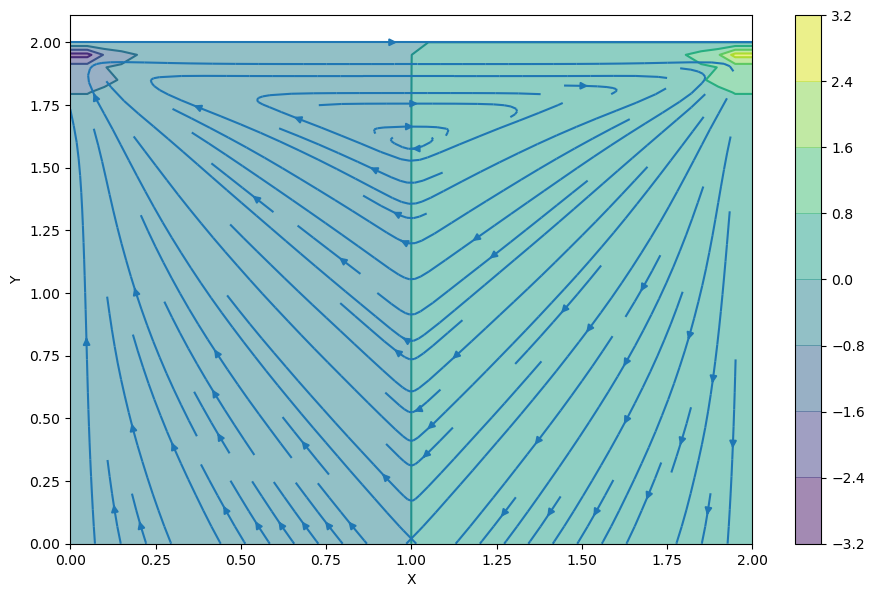

In [36]:
# Halfway Stream Plot
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

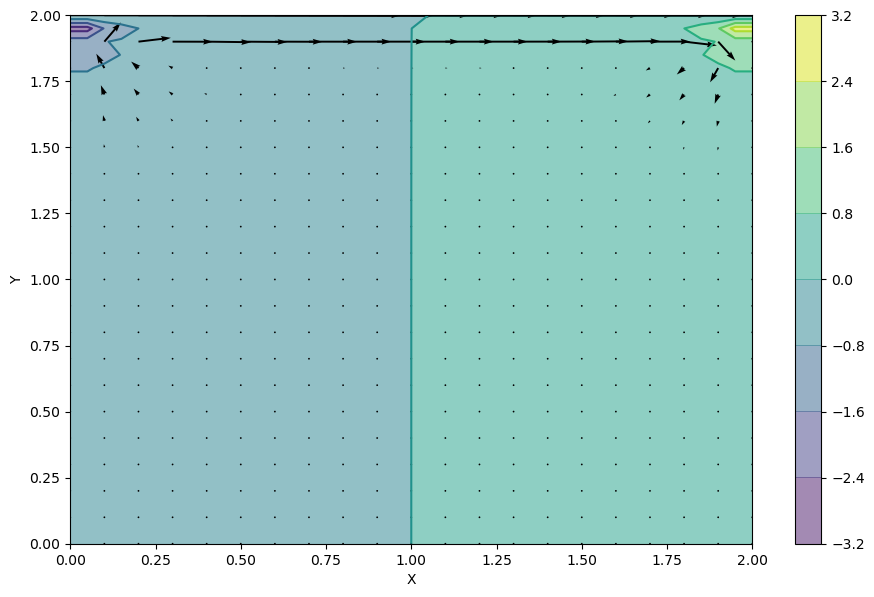

In [37]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

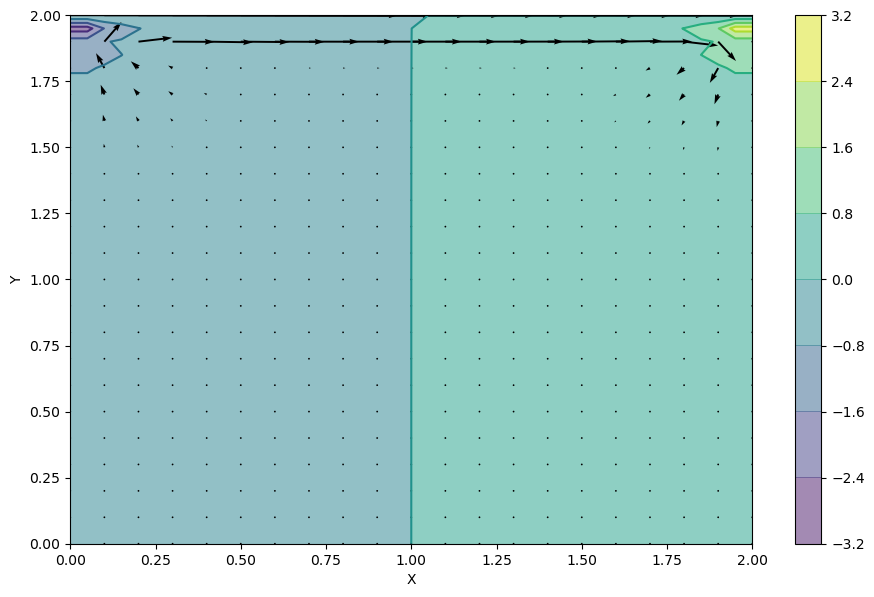

In [38]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

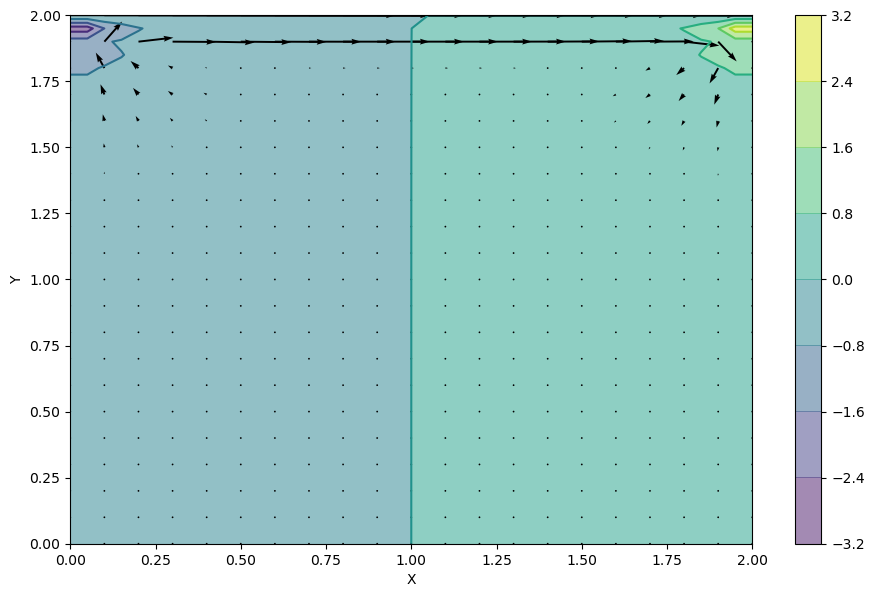

In [39]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

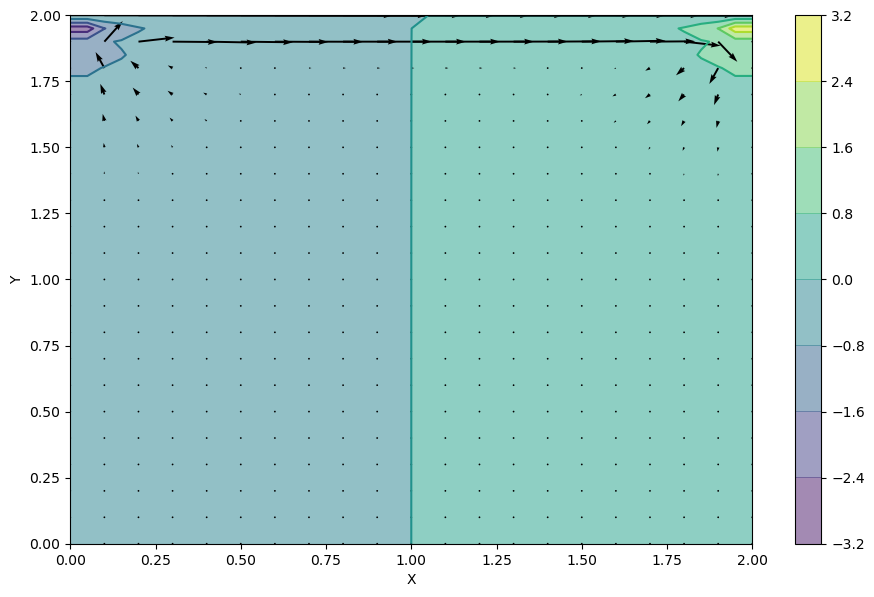

In [40]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

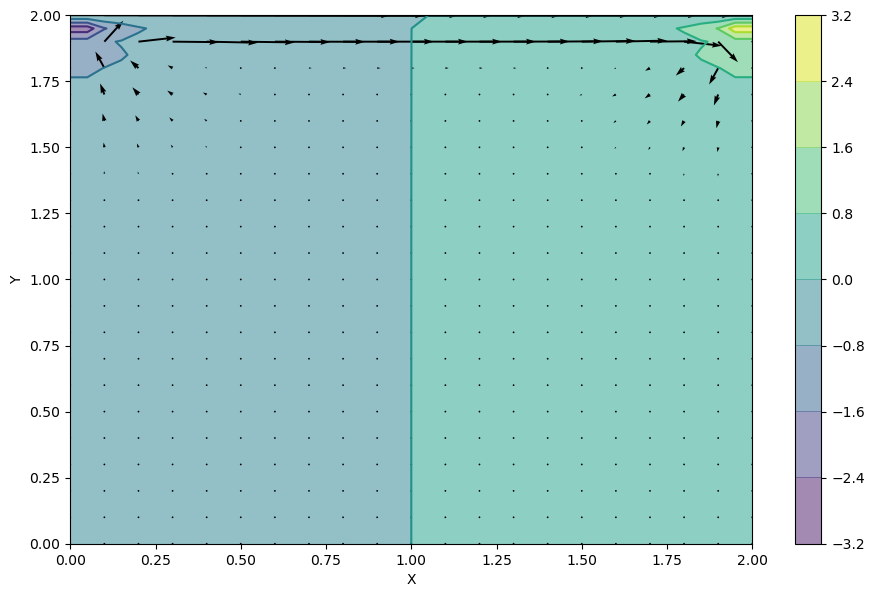

In [41]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

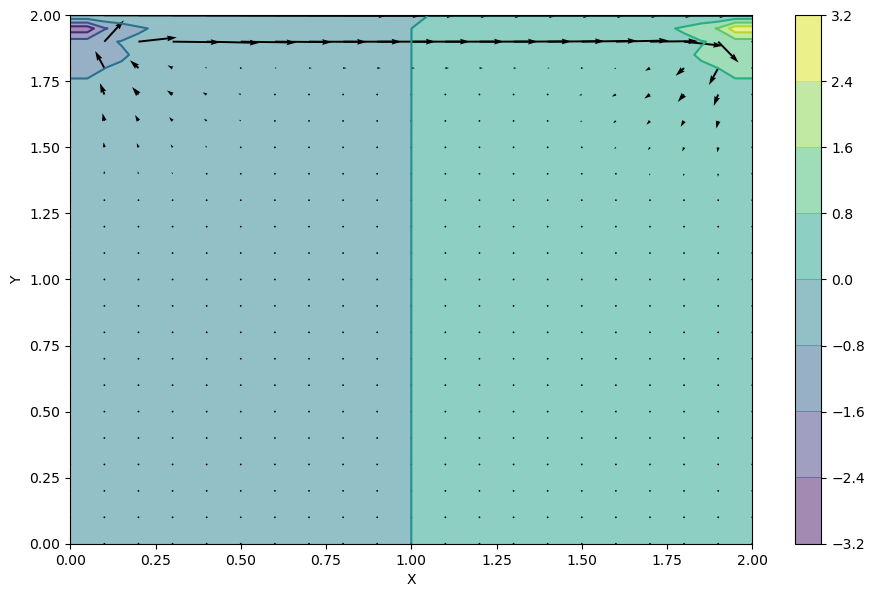

In [42]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

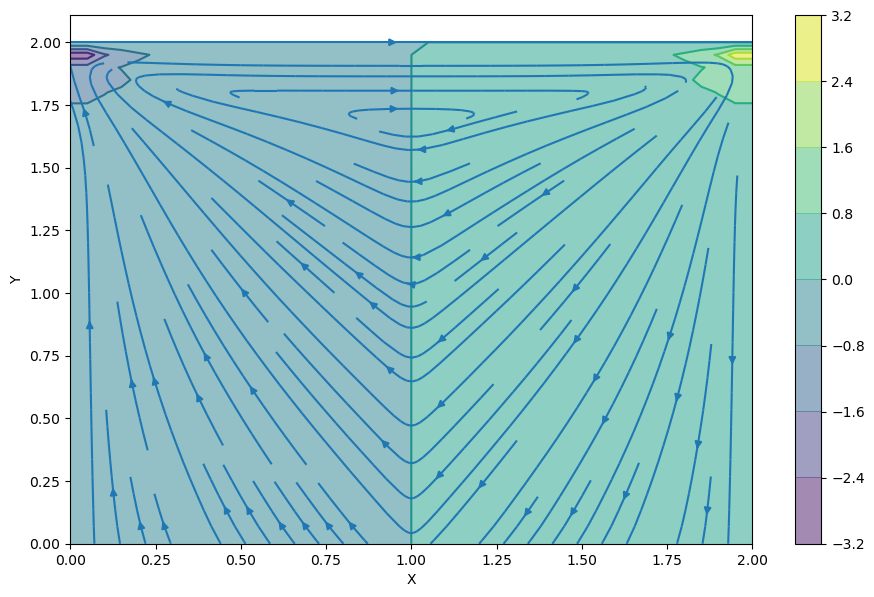

In [43]:
#Halfway Streamplot
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

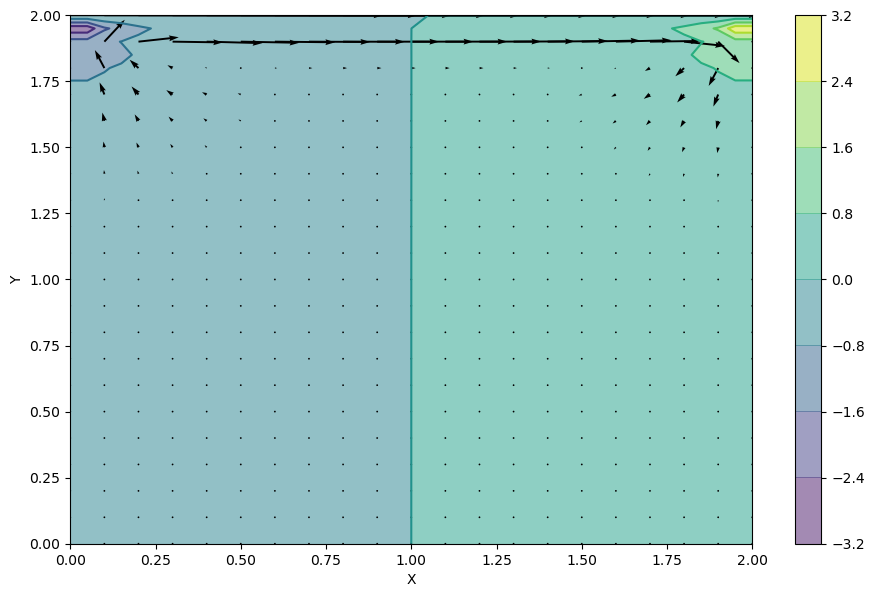

In [44]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

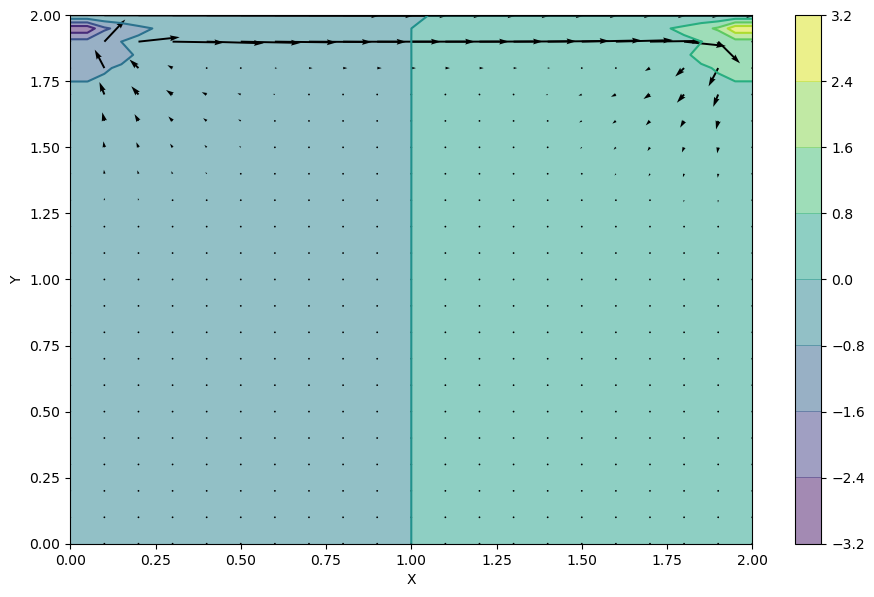

In [45]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

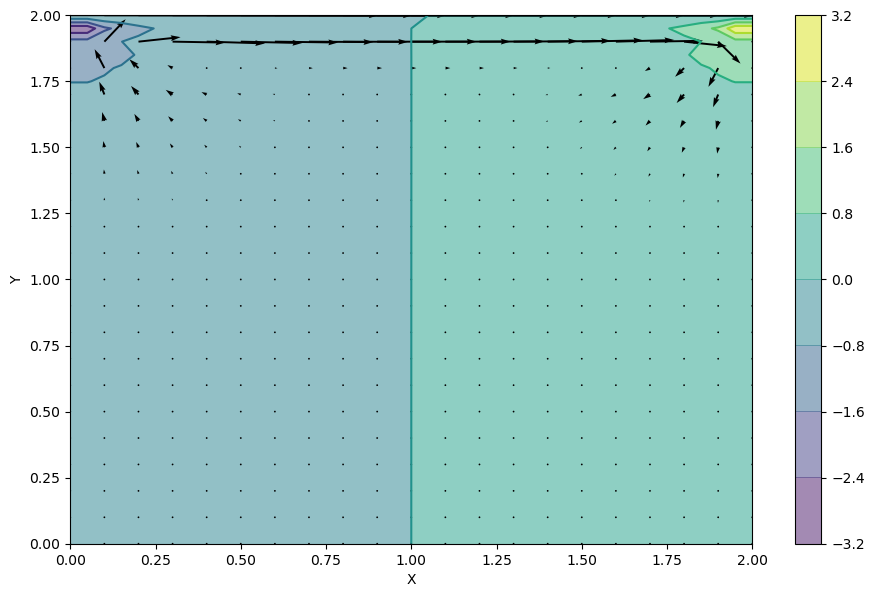

In [46]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

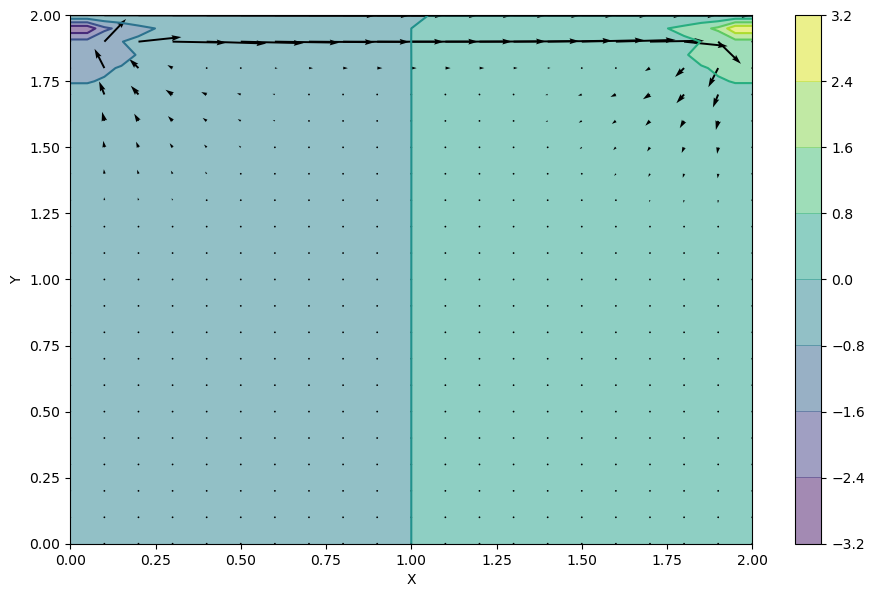

In [47]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

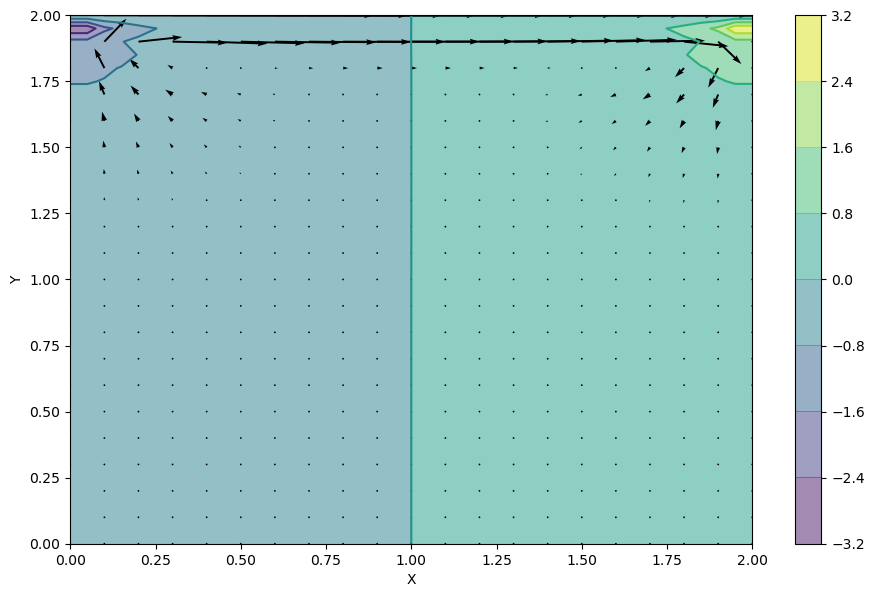

In [48]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

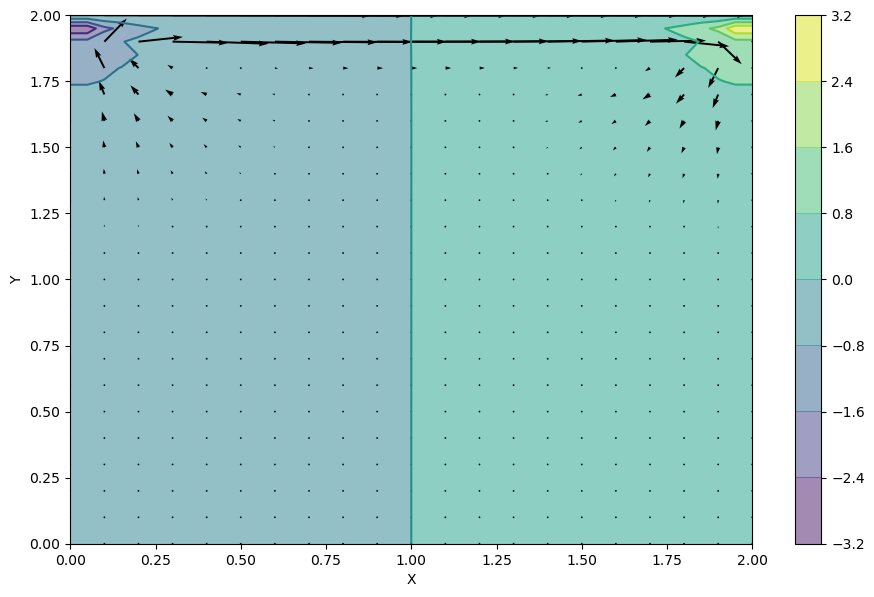

In [49]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

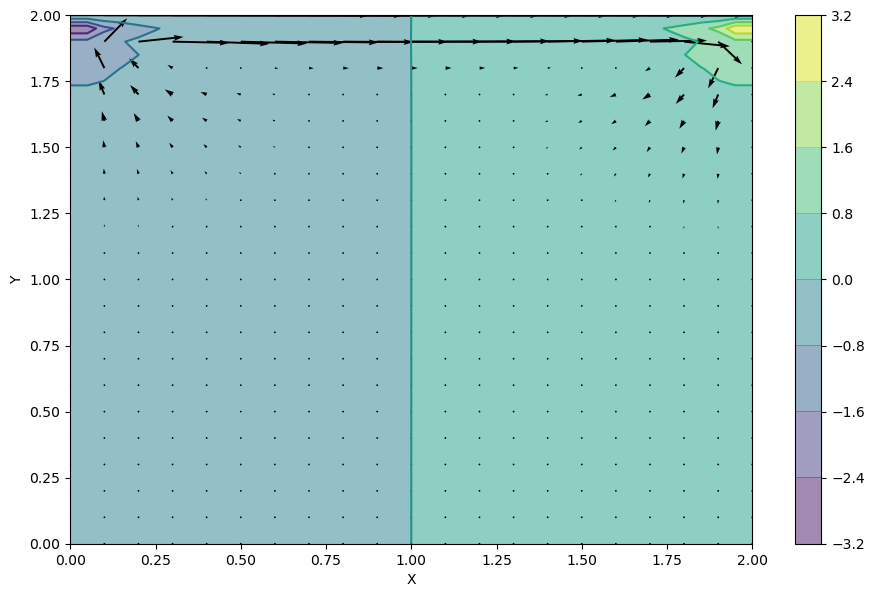

In [50]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

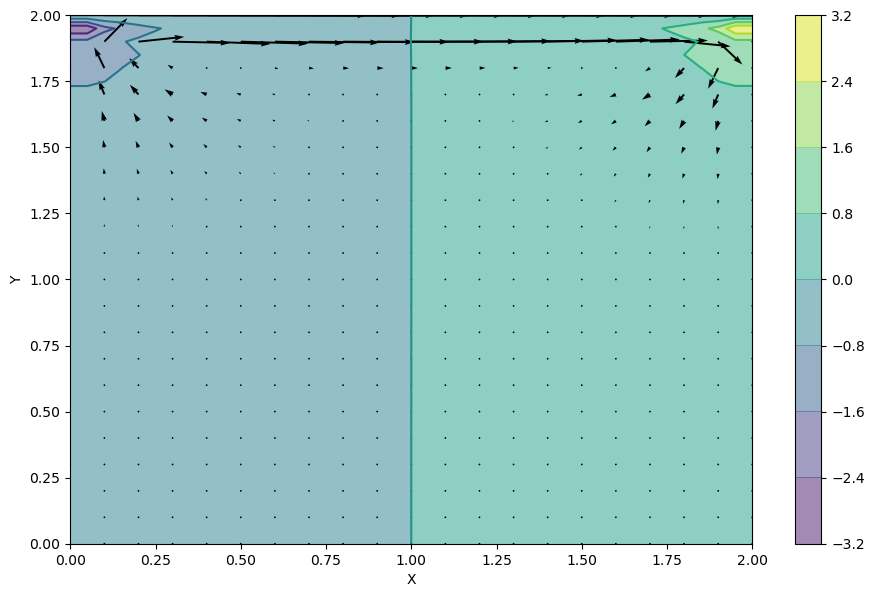

In [51]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

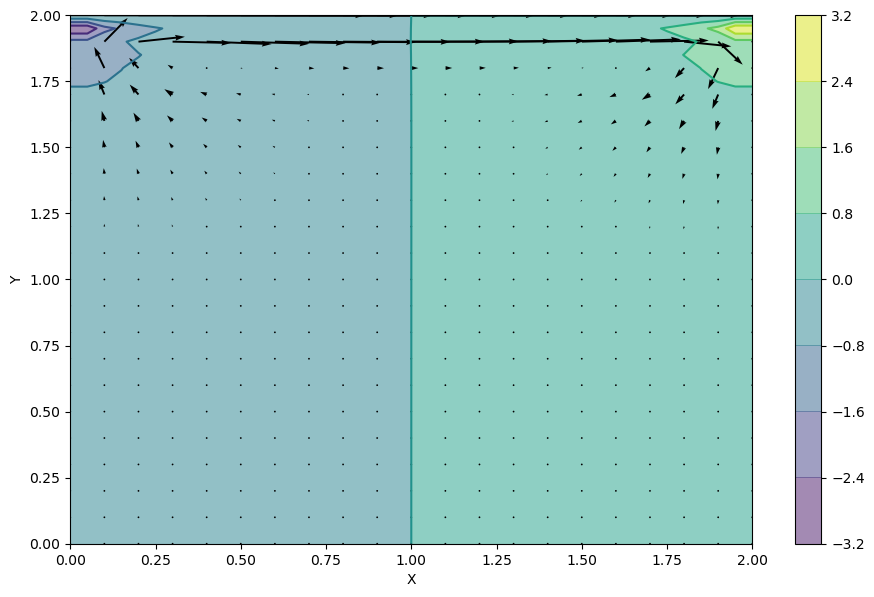

In [52]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

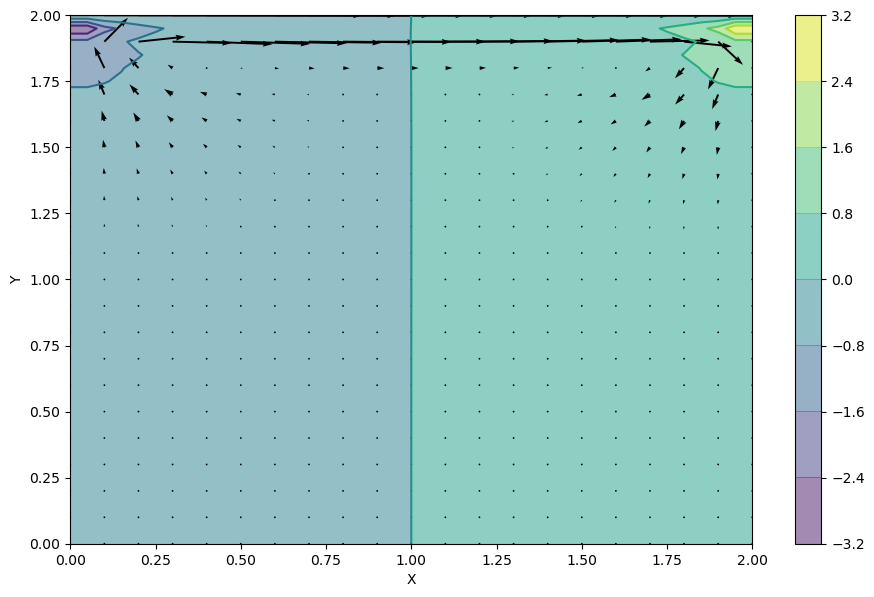

In [53]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

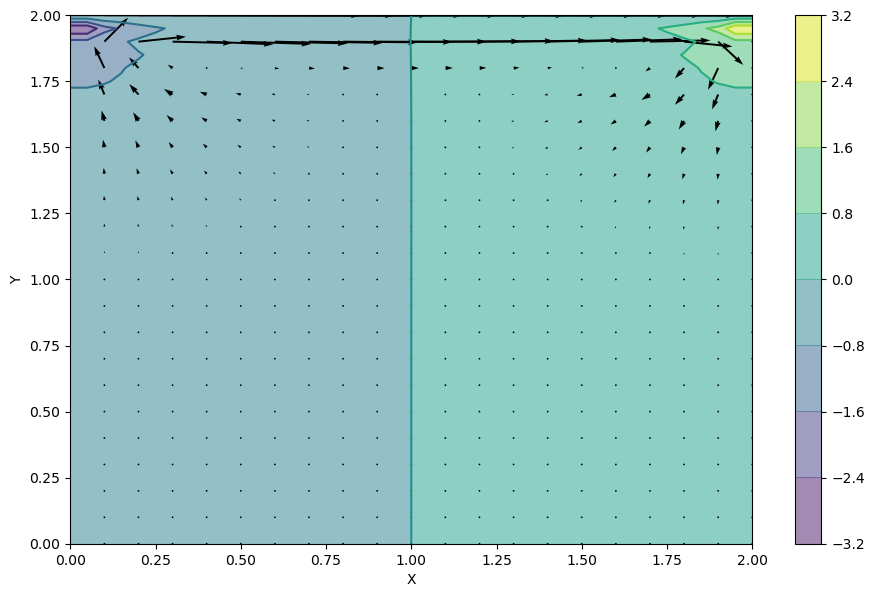

In [54]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

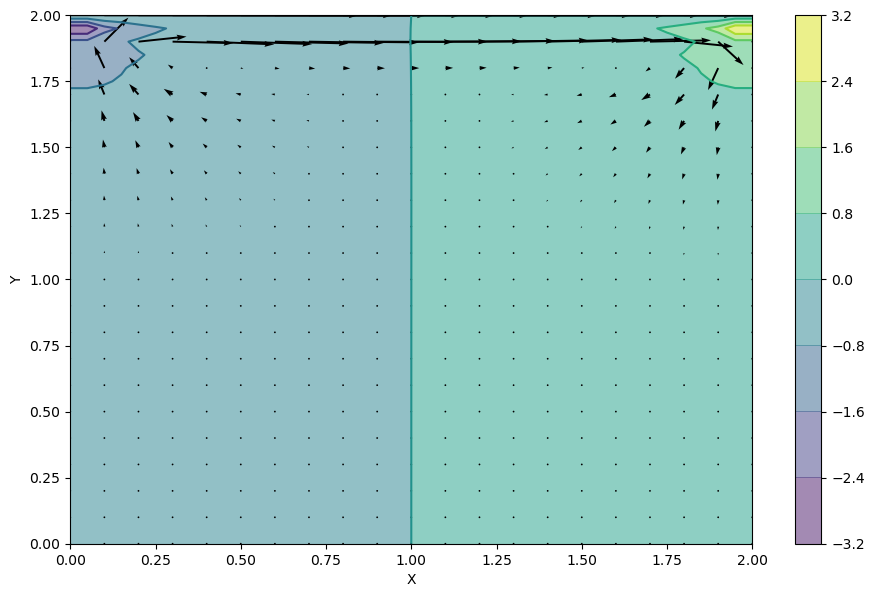

In [55]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

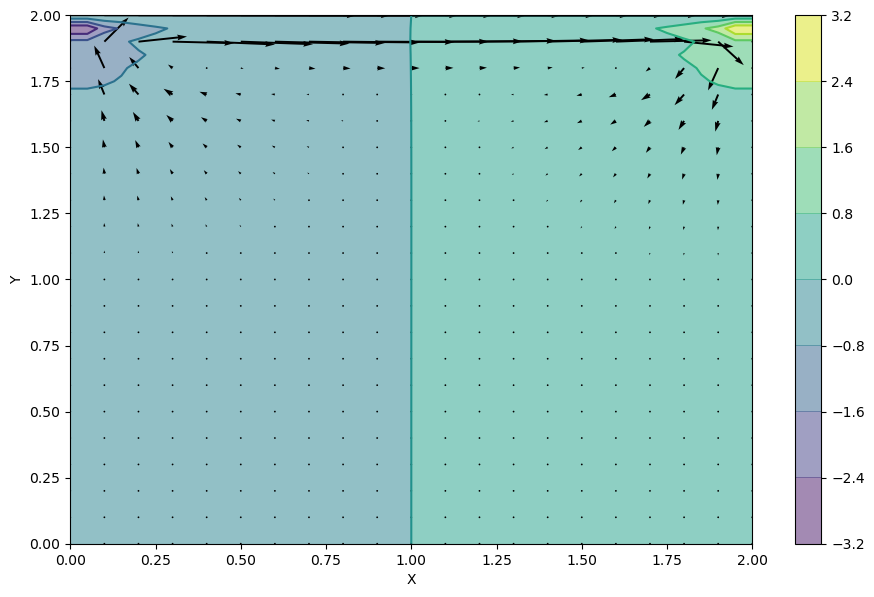

In [56]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

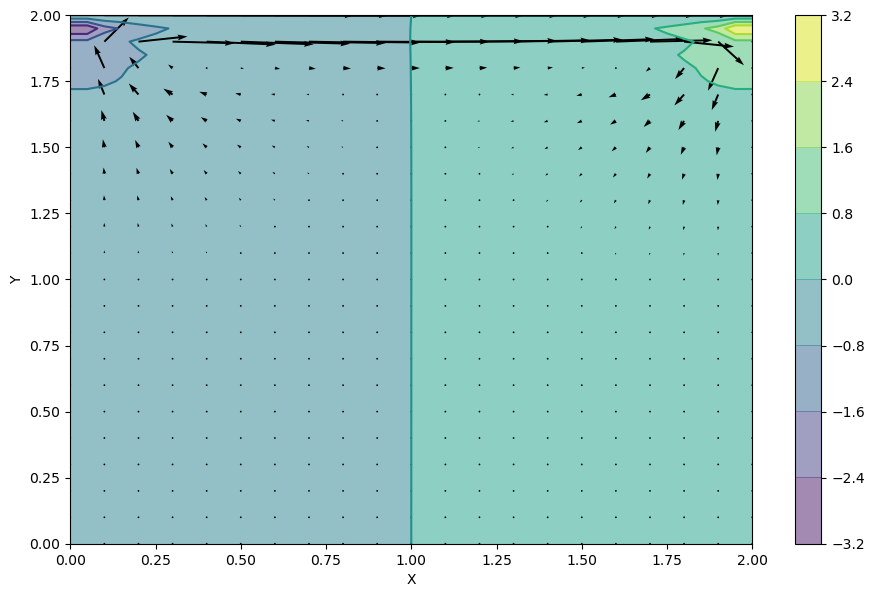

In [57]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

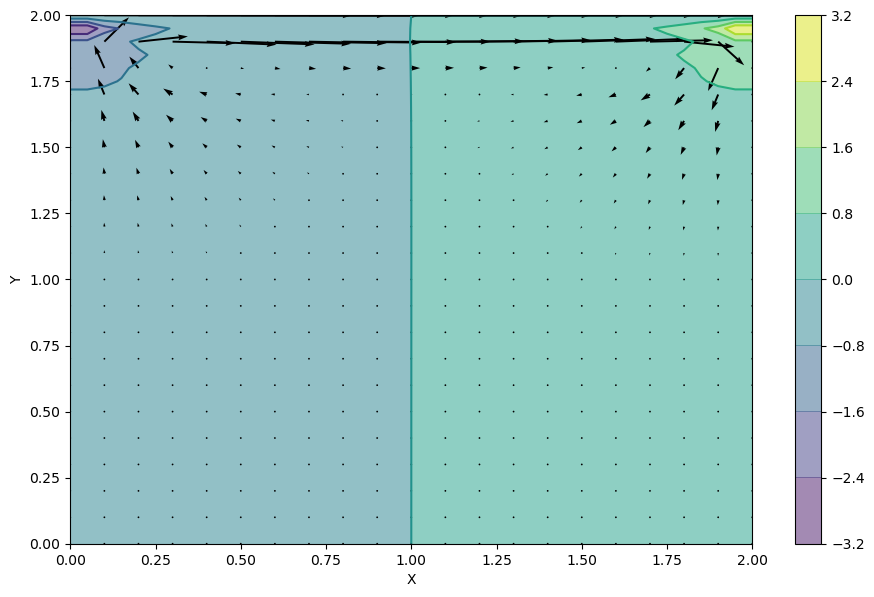

In [58]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

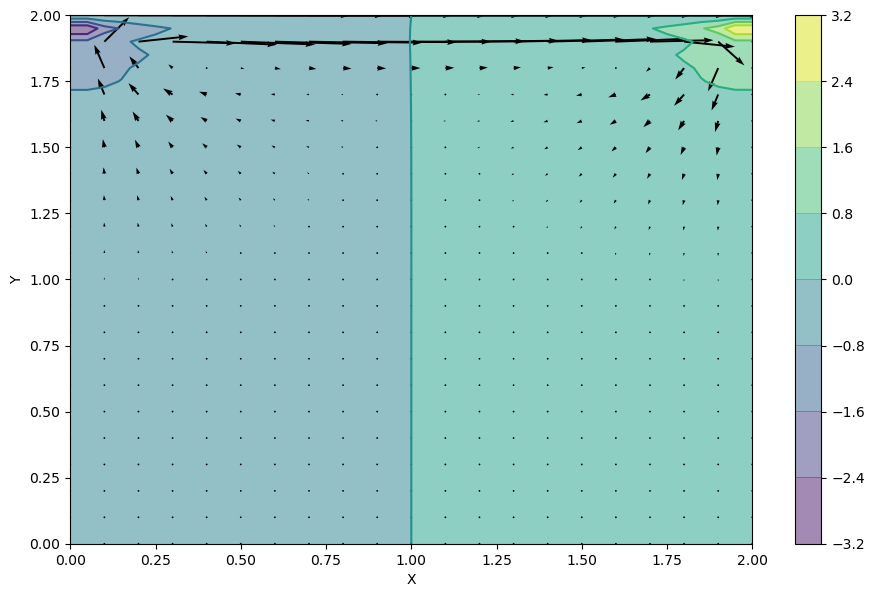

In [59]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

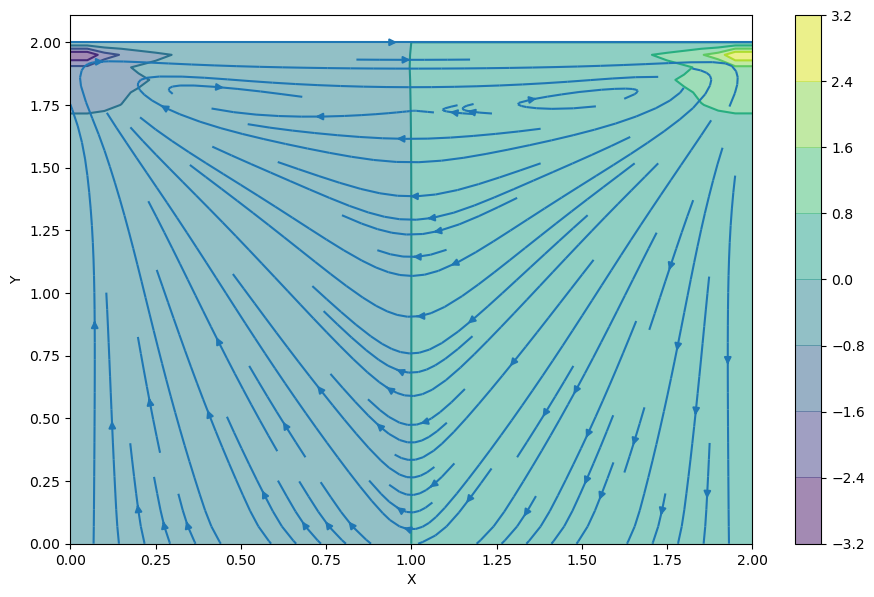

In [60]:
# Halfway Streamplot
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

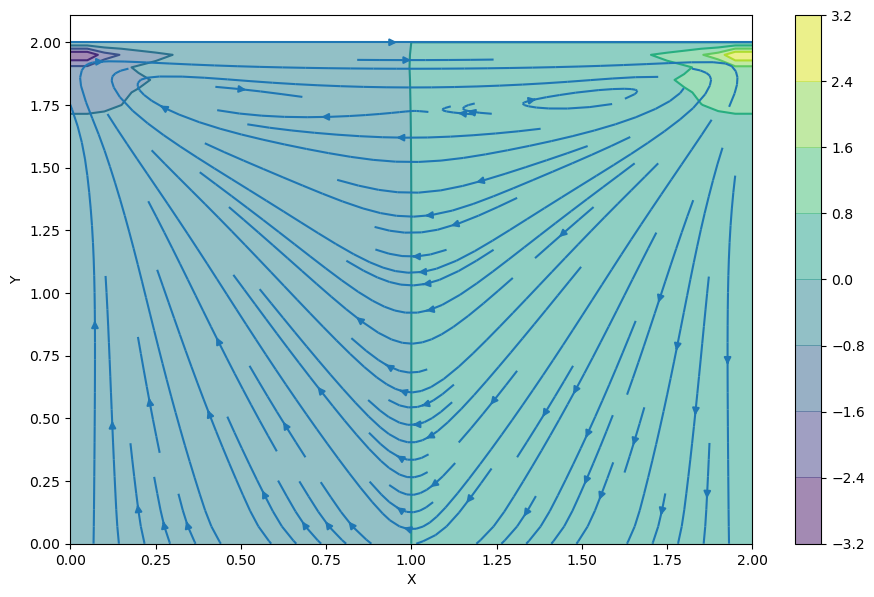

In [61]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

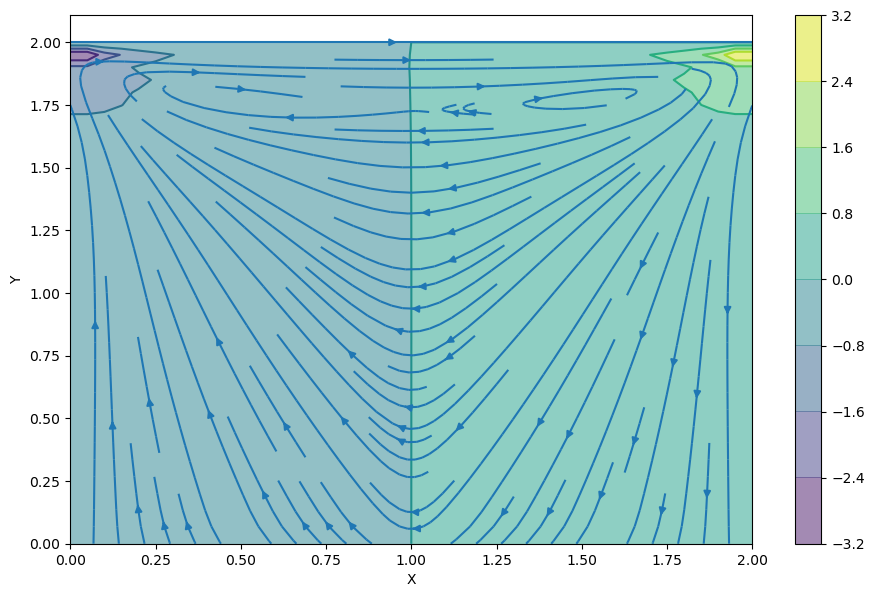

In [62]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

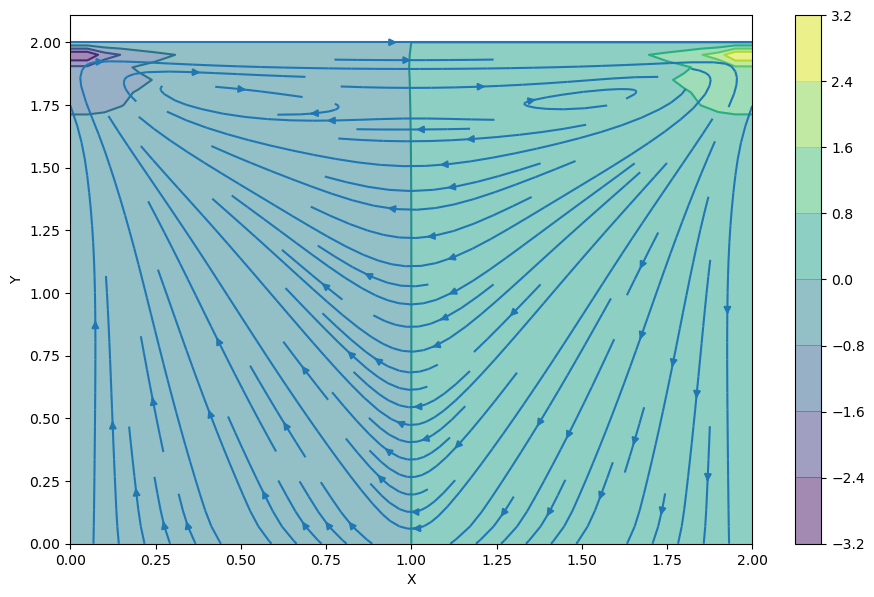

In [63]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

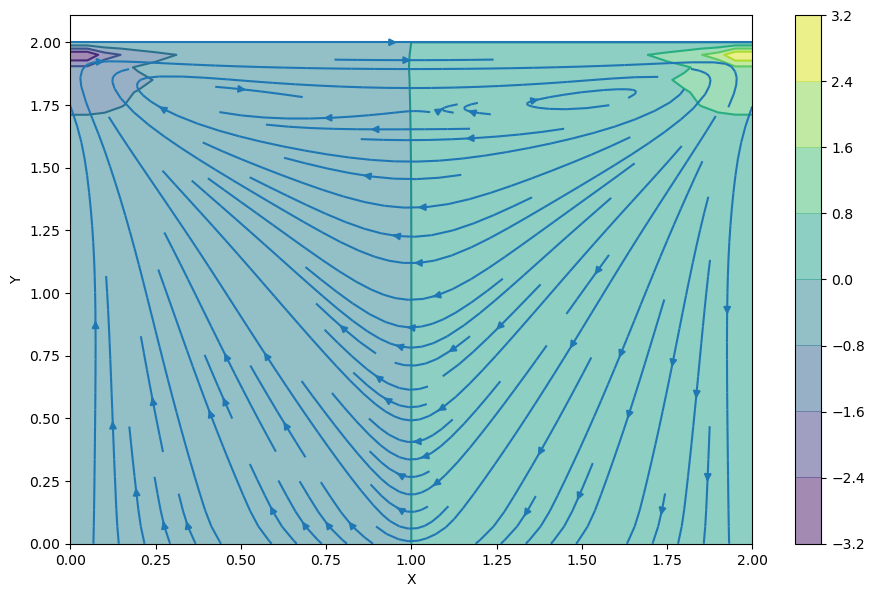

In [64]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

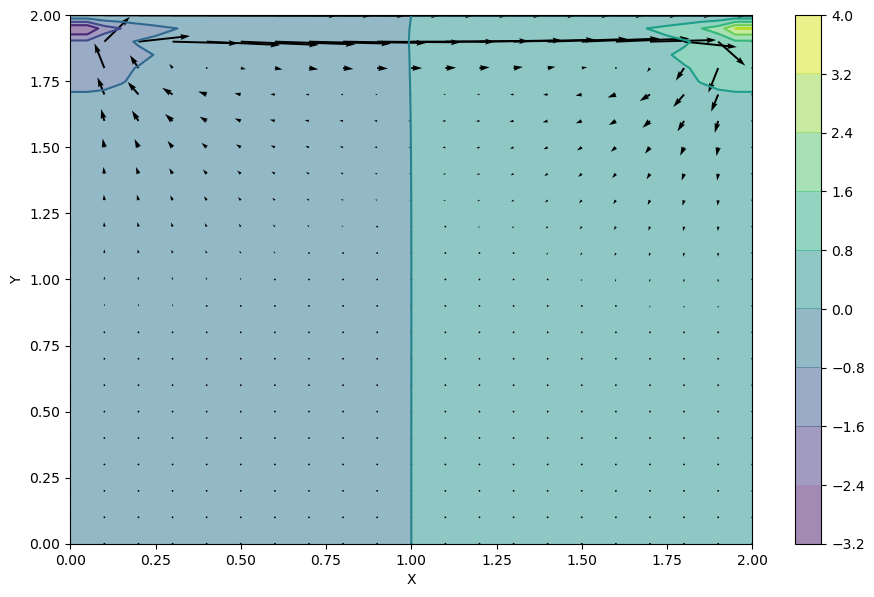

In [65]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

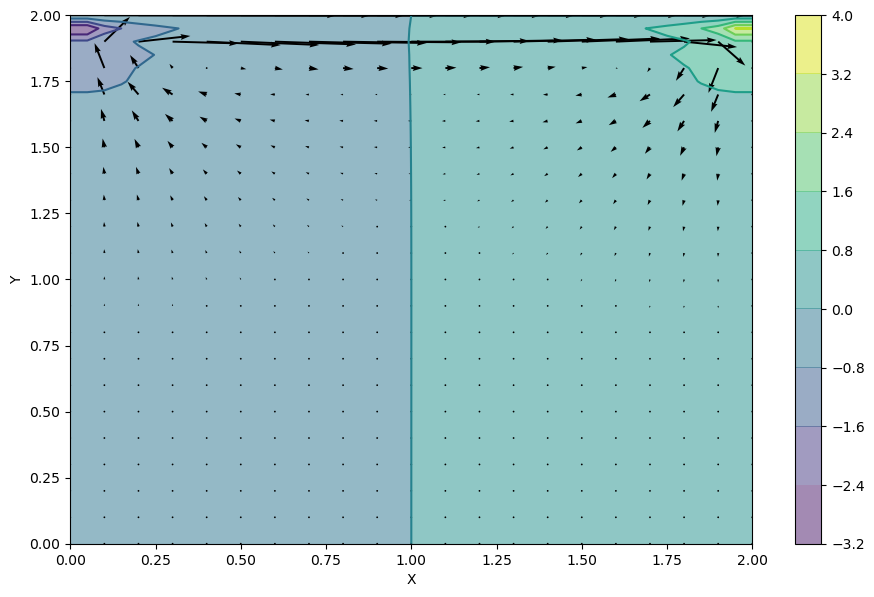

In [66]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

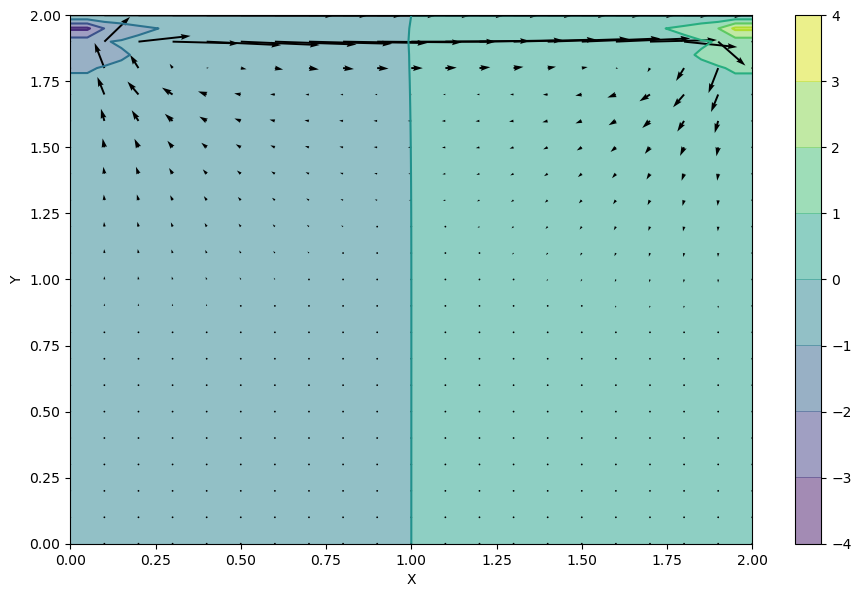

In [67]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

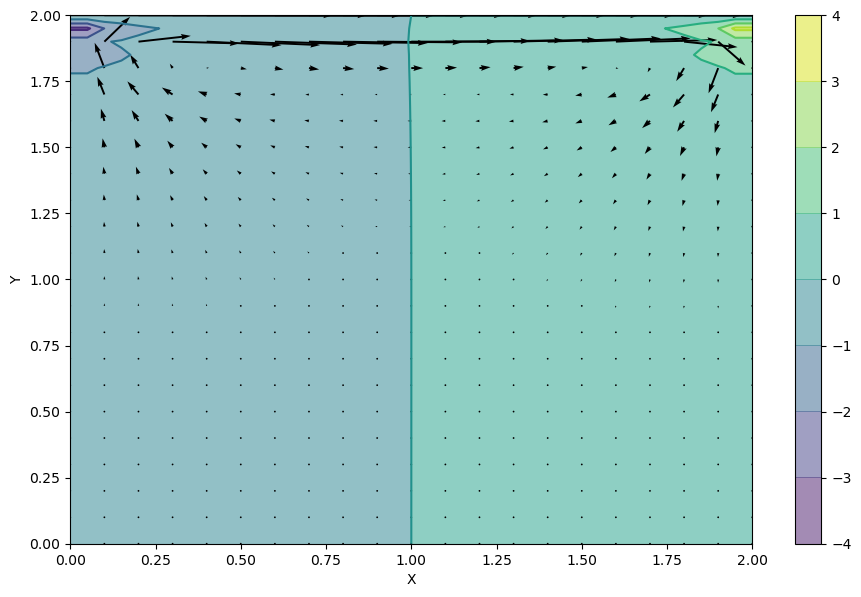

In [68]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

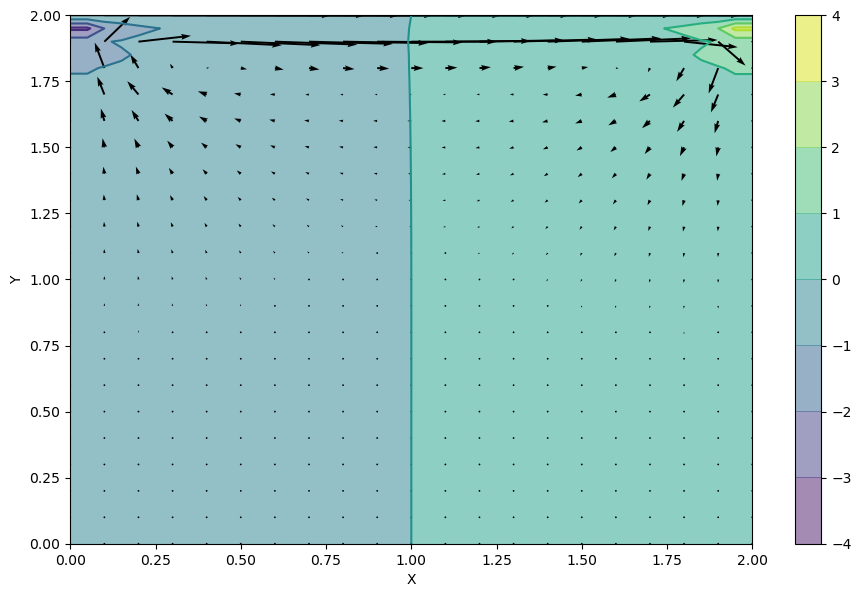

In [69]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

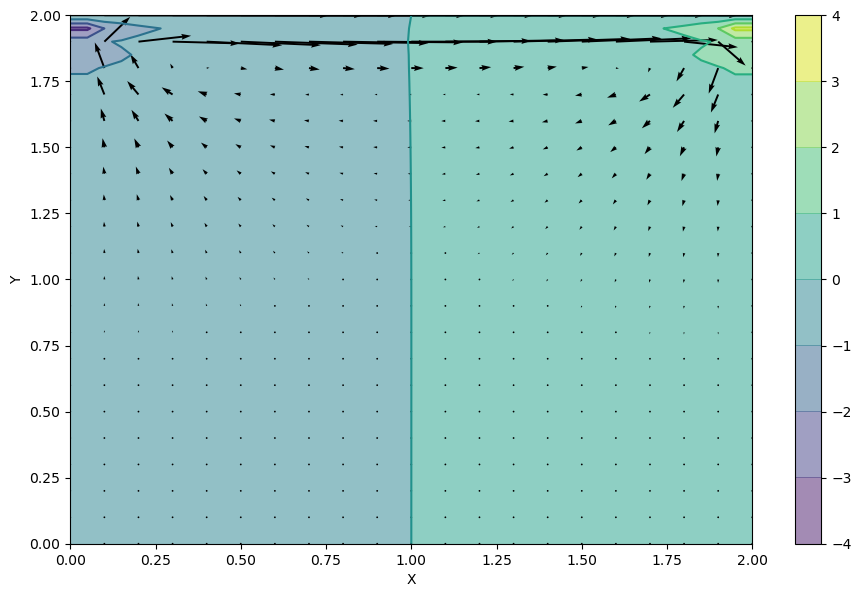

In [70]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

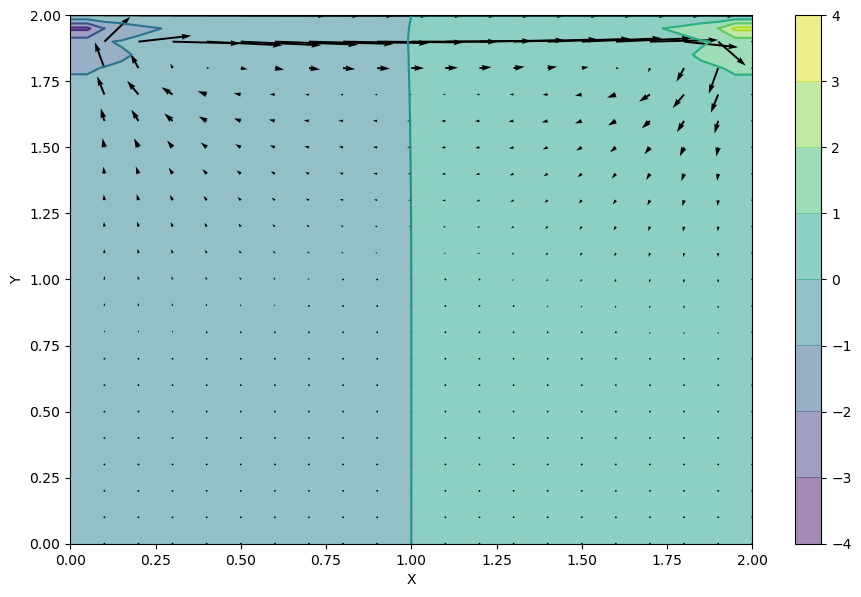

In [71]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

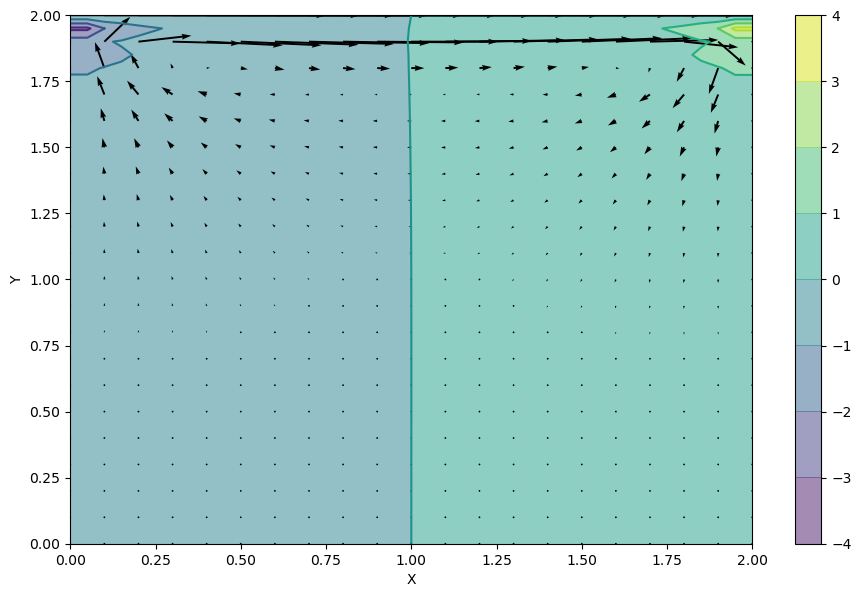

In [72]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

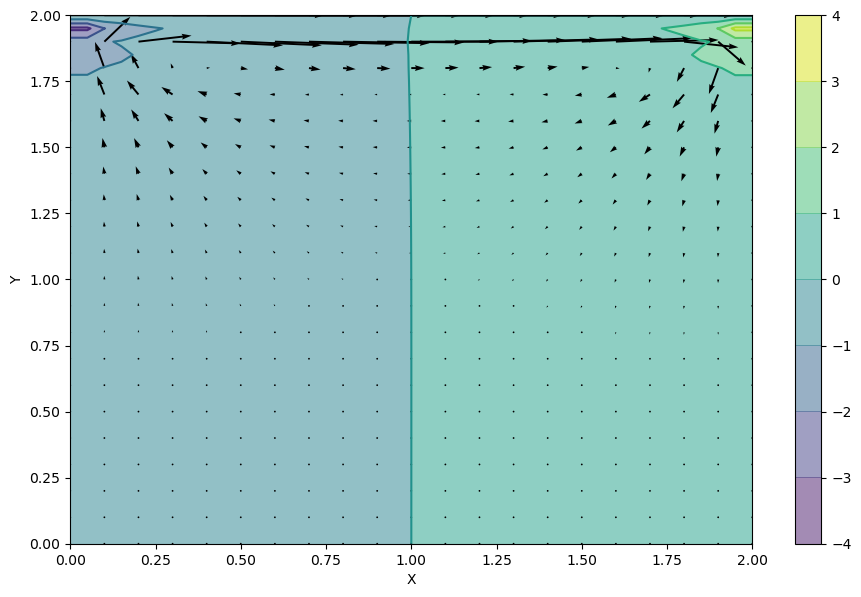

In [73]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

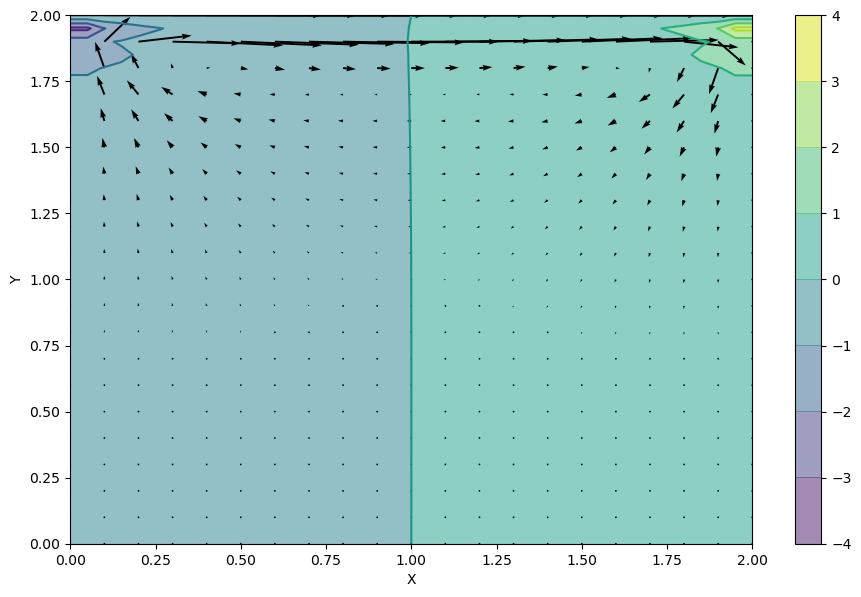

In [74]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

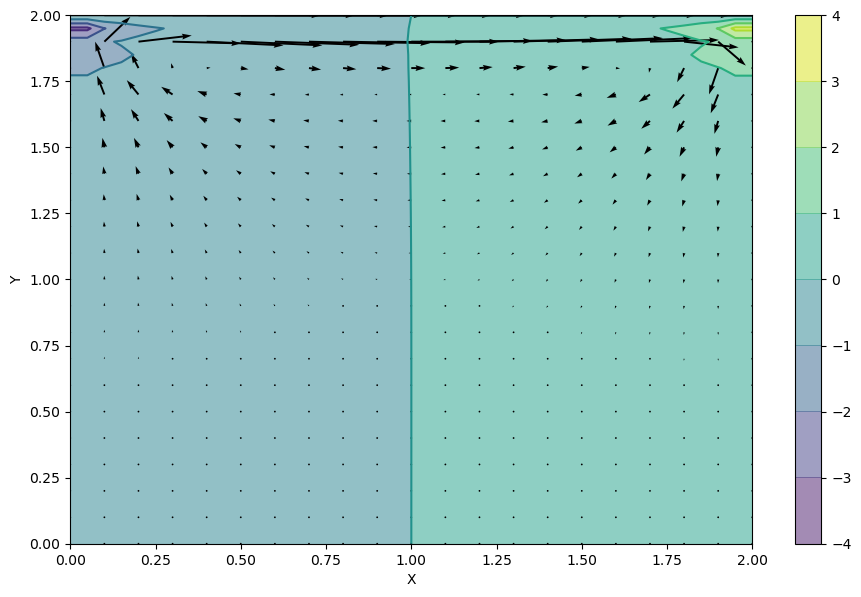

In [75]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

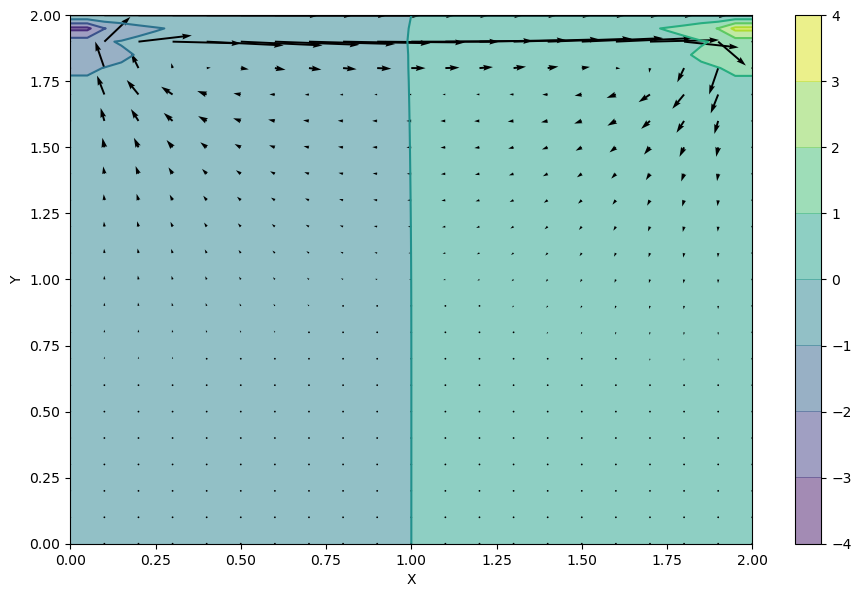

In [76]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

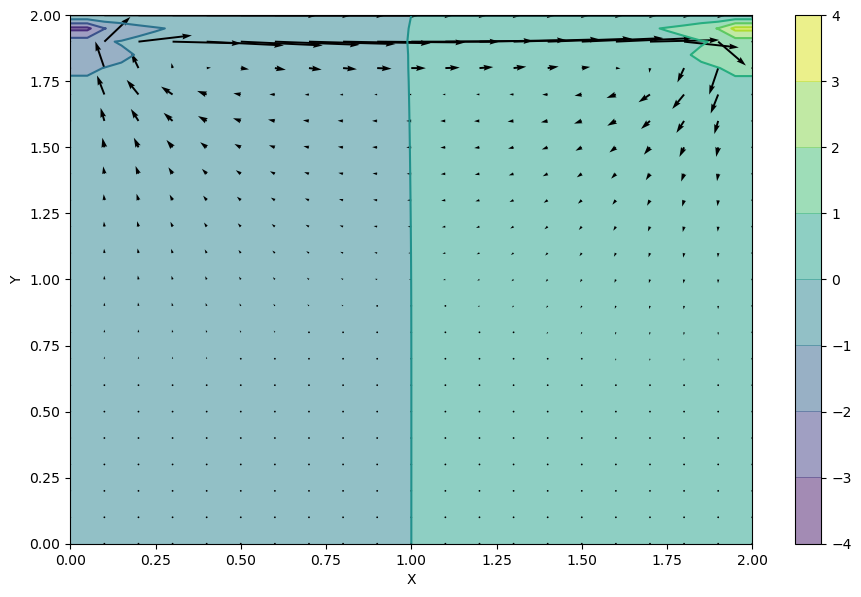

In [77]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

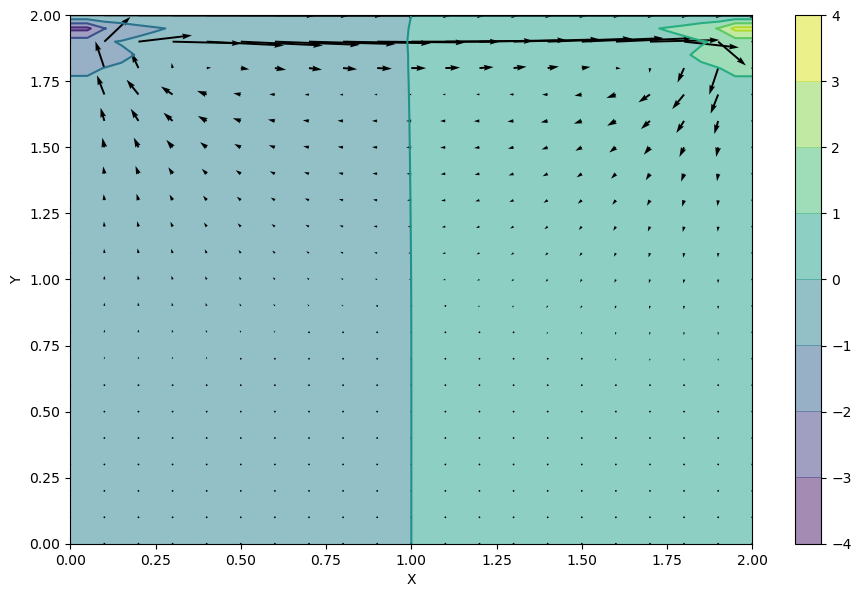

In [78]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

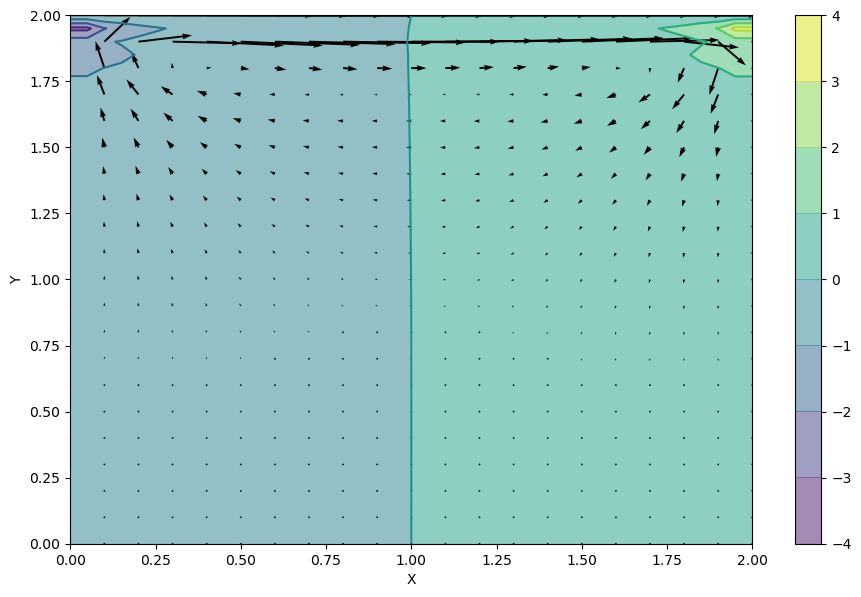

In [79]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

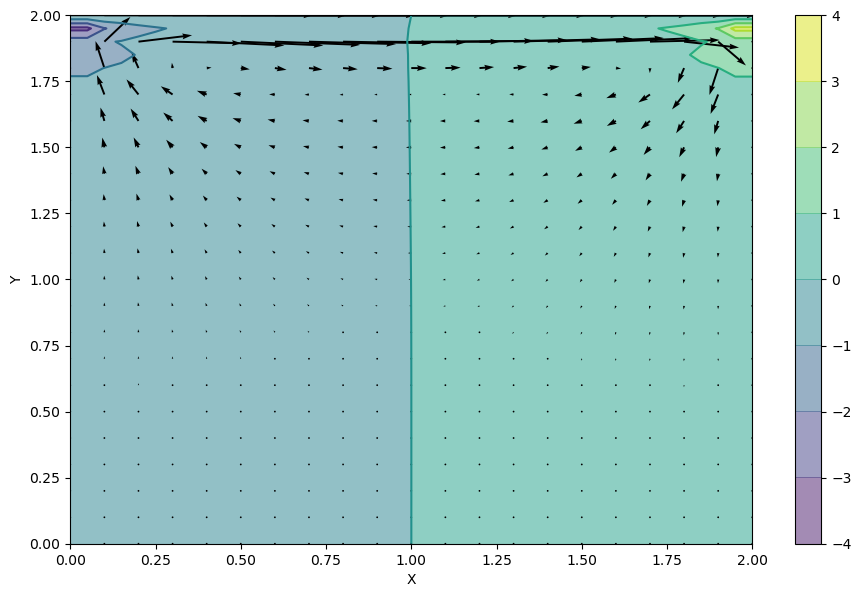

In [80]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

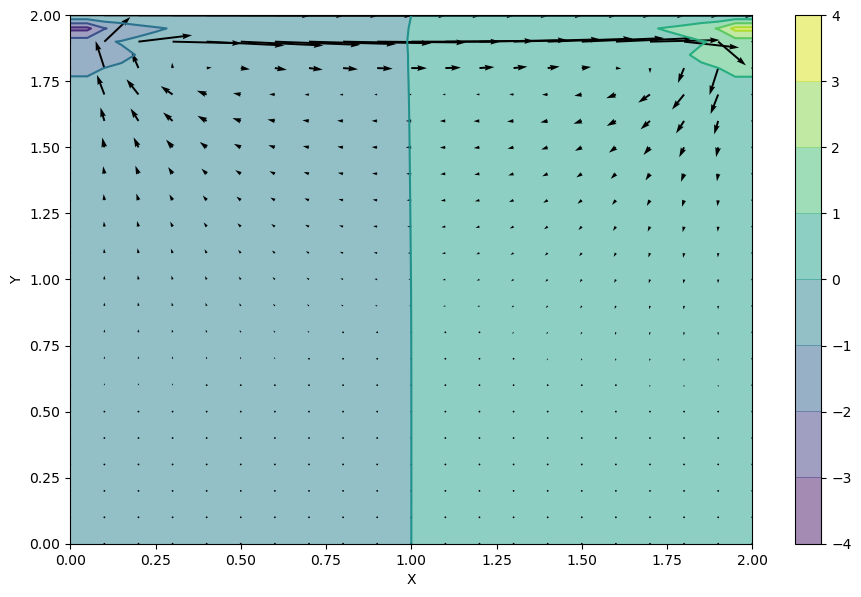

In [81]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

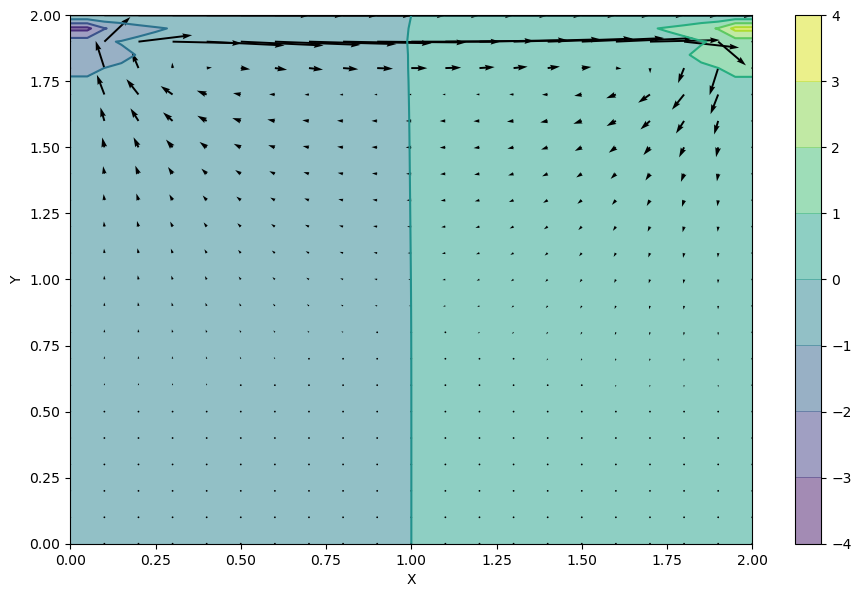

In [82]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

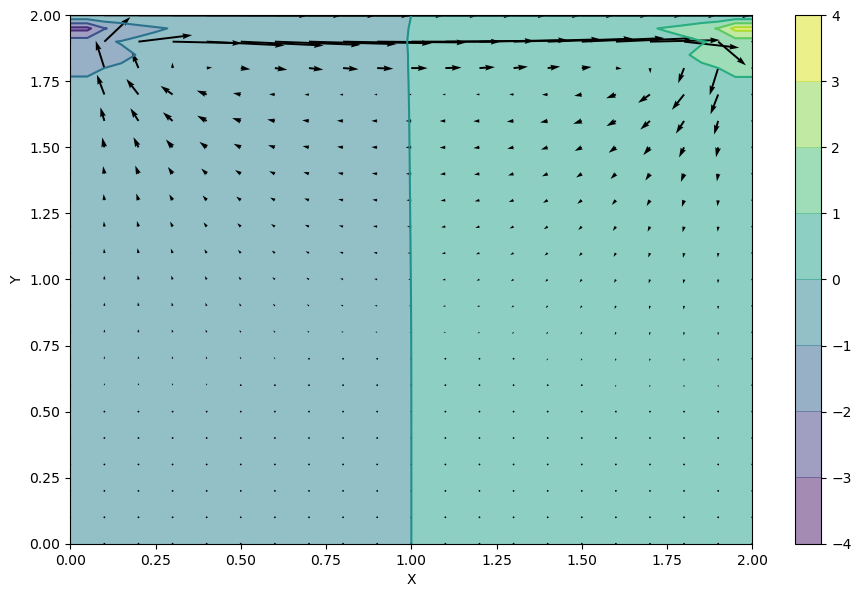

In [83]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

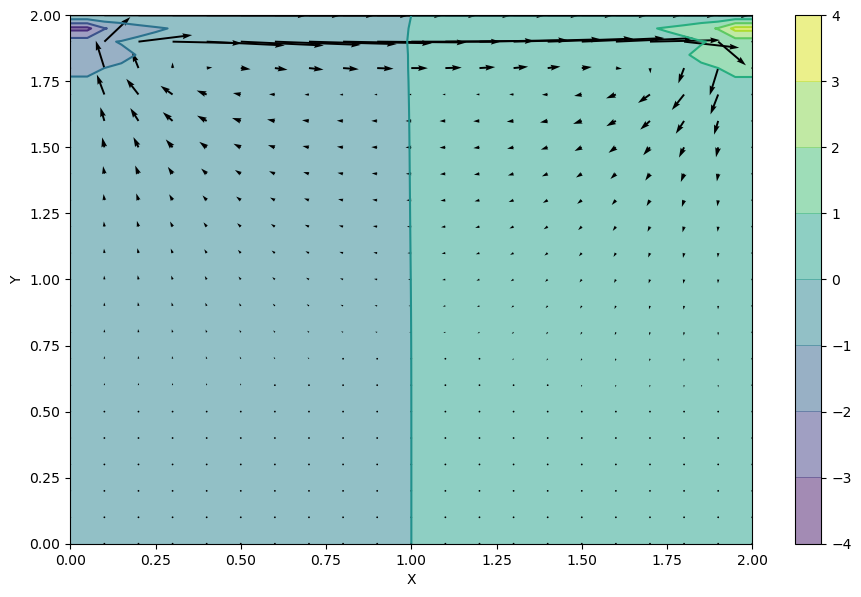

In [84]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

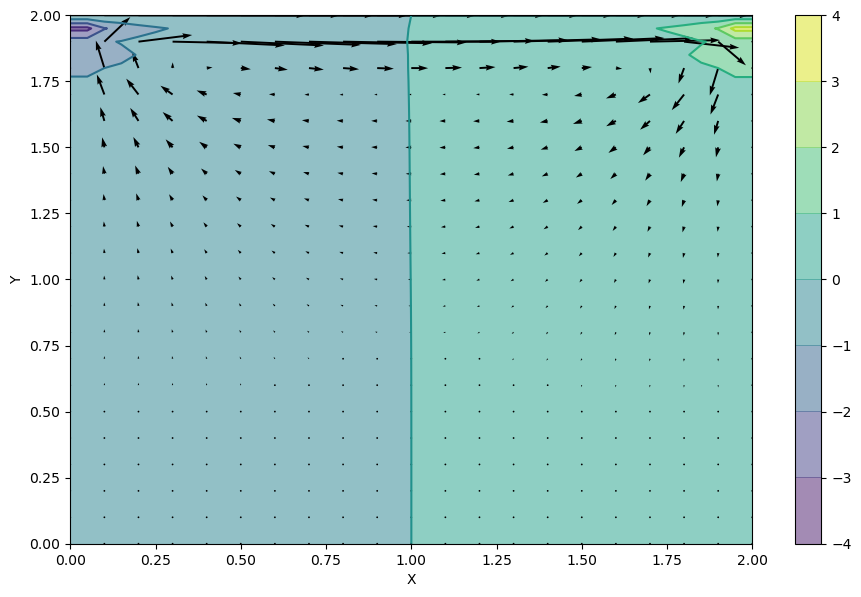

In [85]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

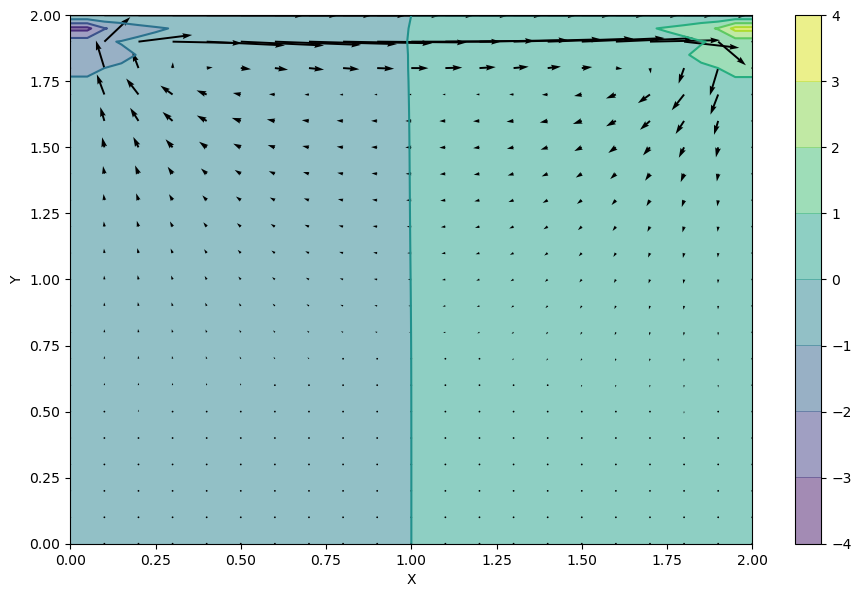

In [86]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

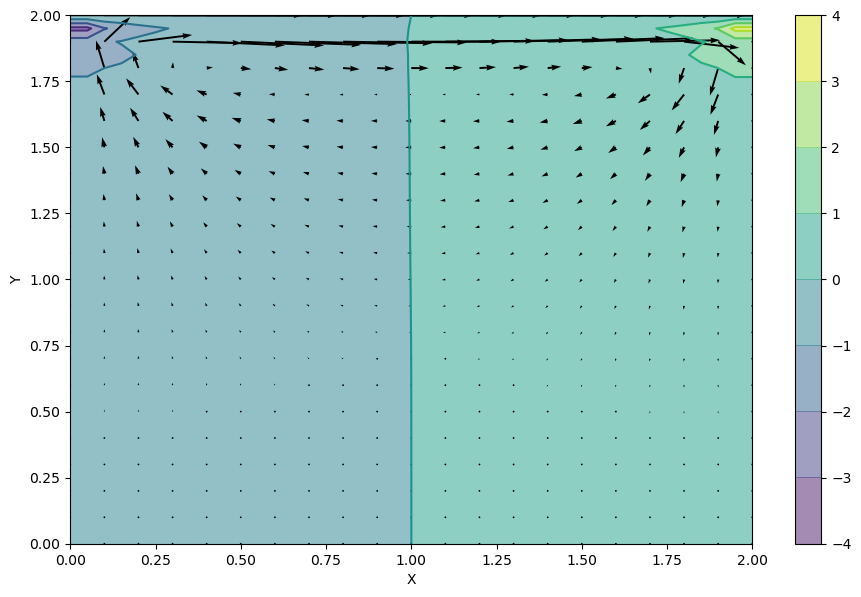

In [87]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

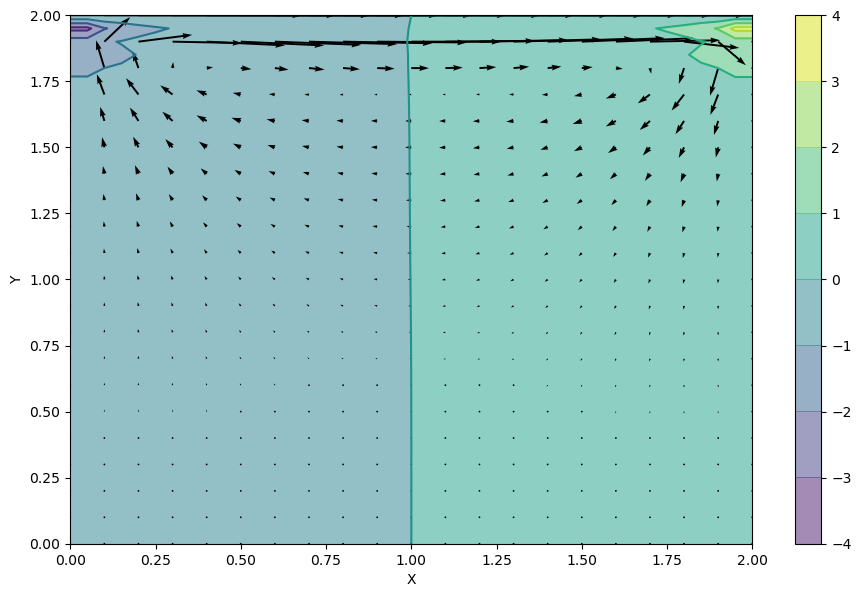

In [88]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

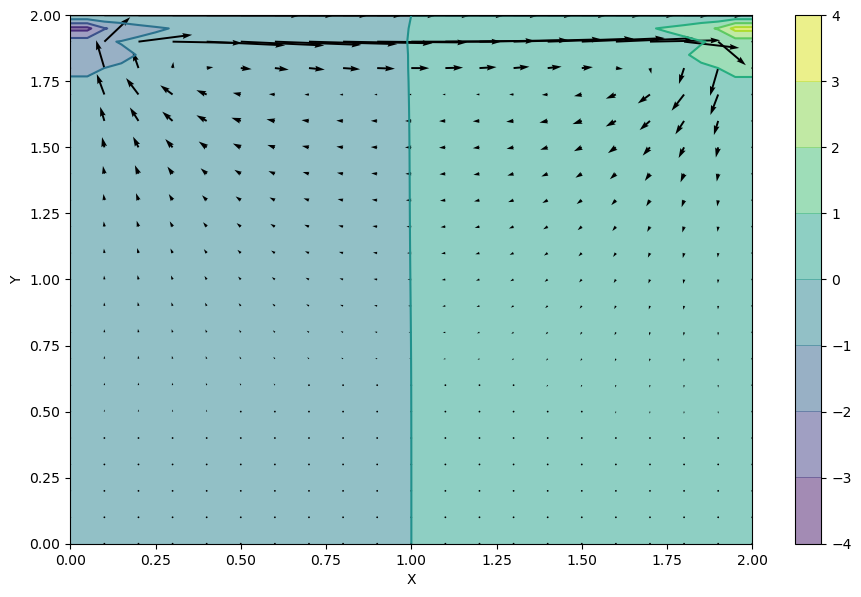

In [89]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

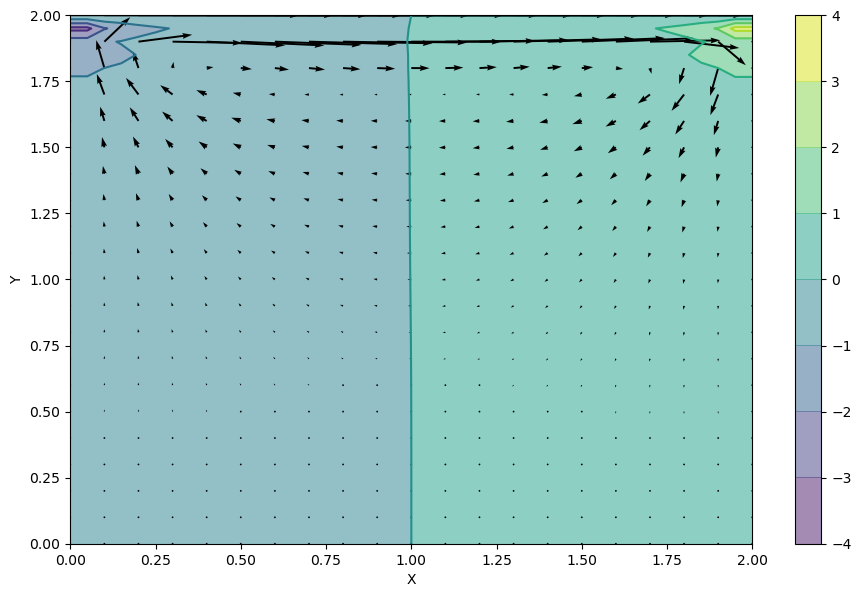

In [90]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

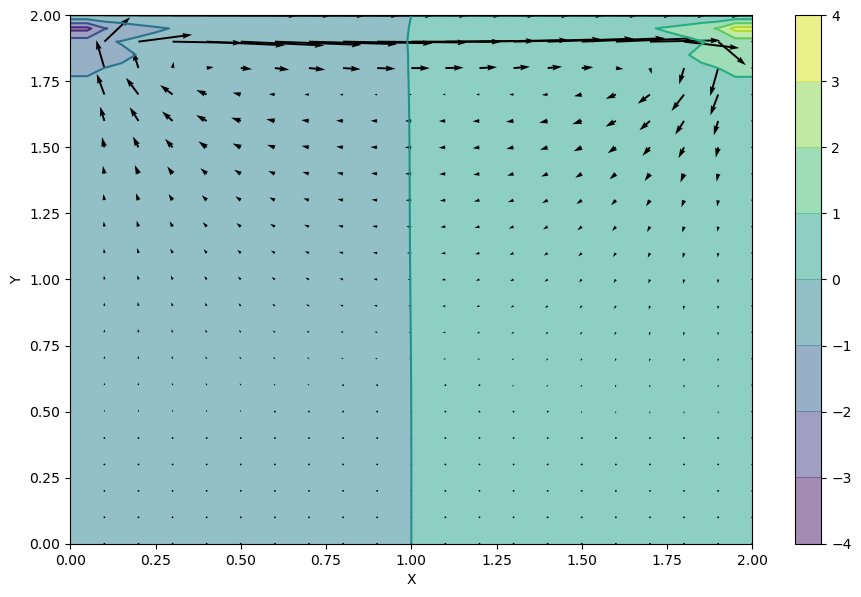

In [91]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

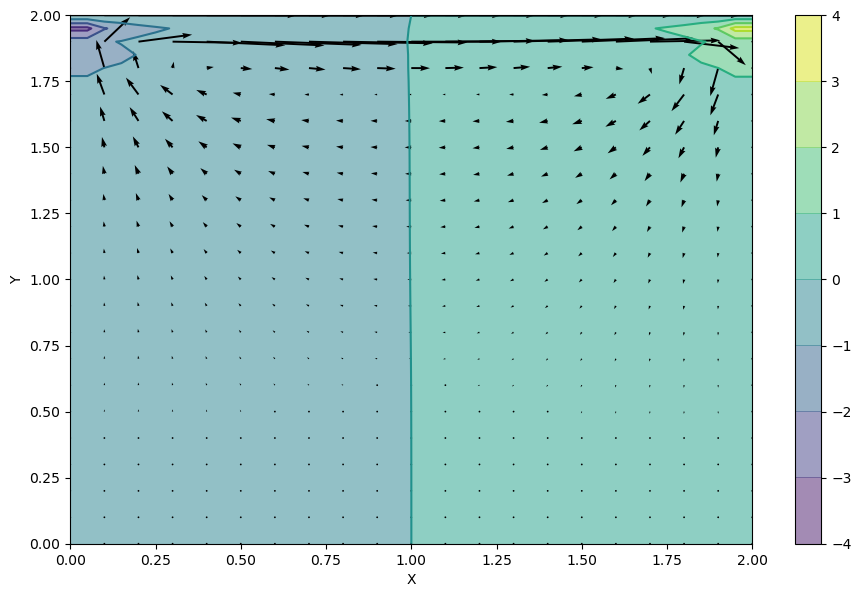

In [92]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

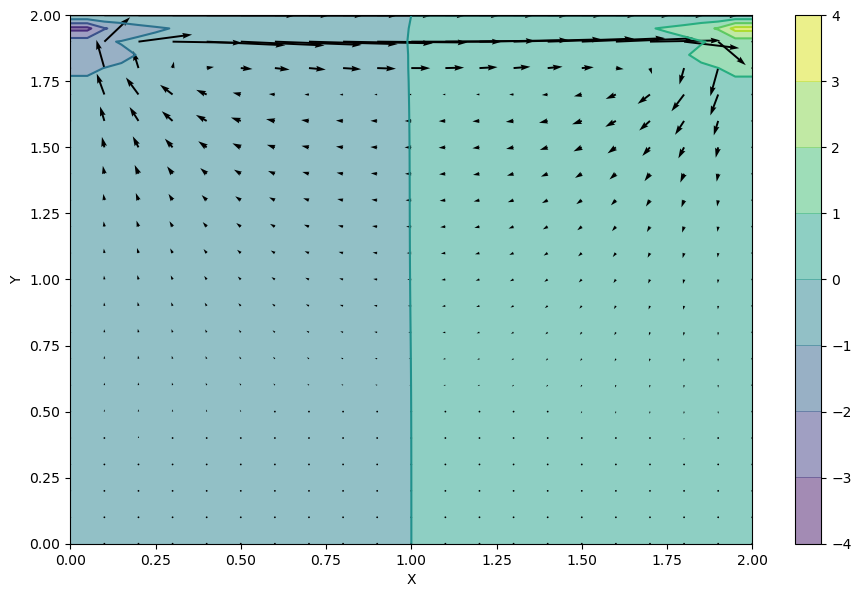

In [93]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

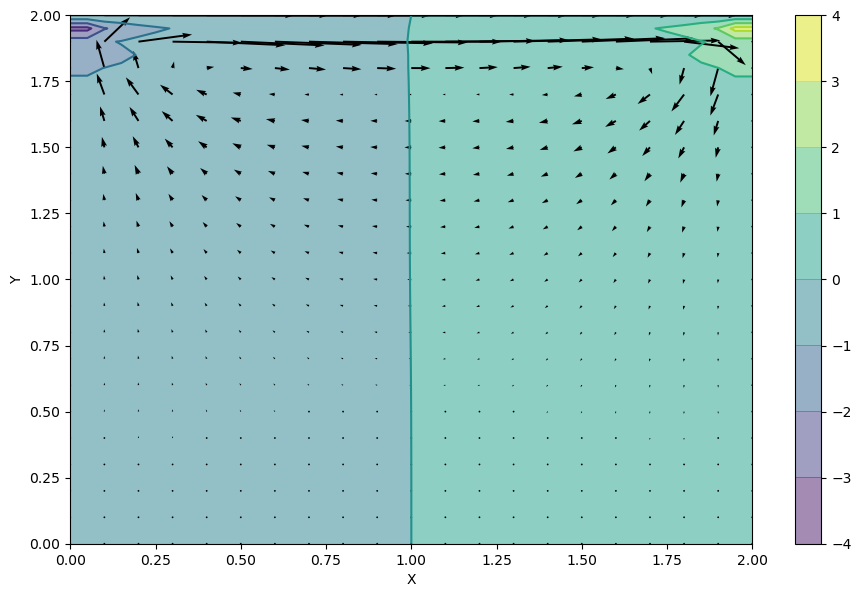

In [94]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

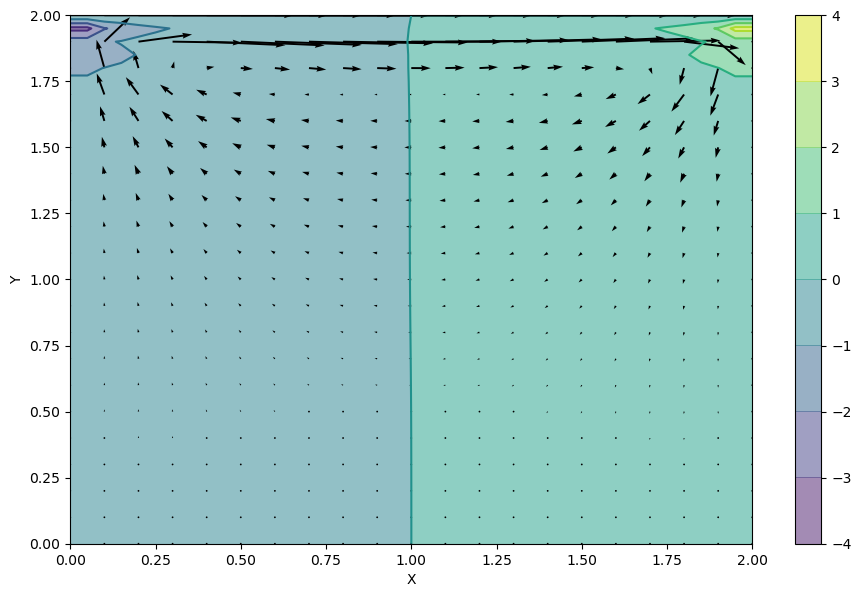

In [95]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

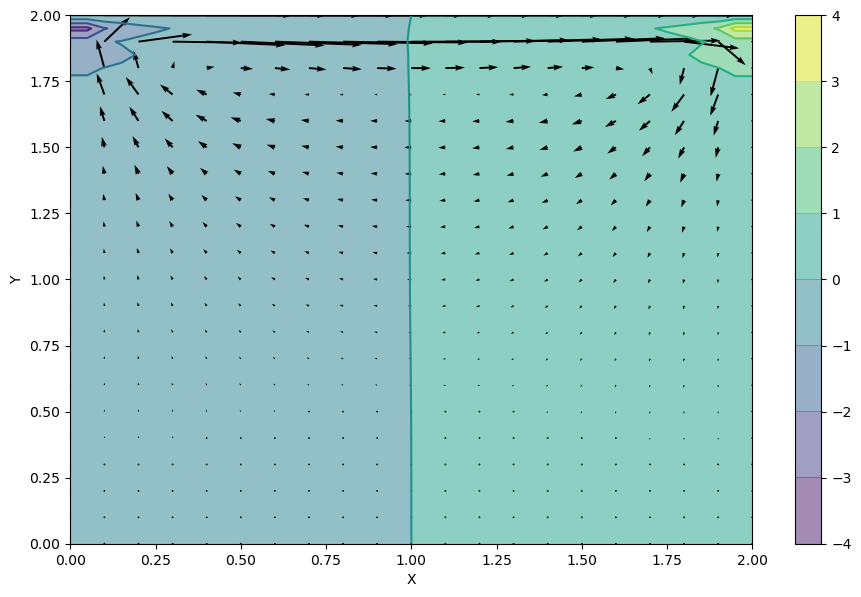

In [96]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

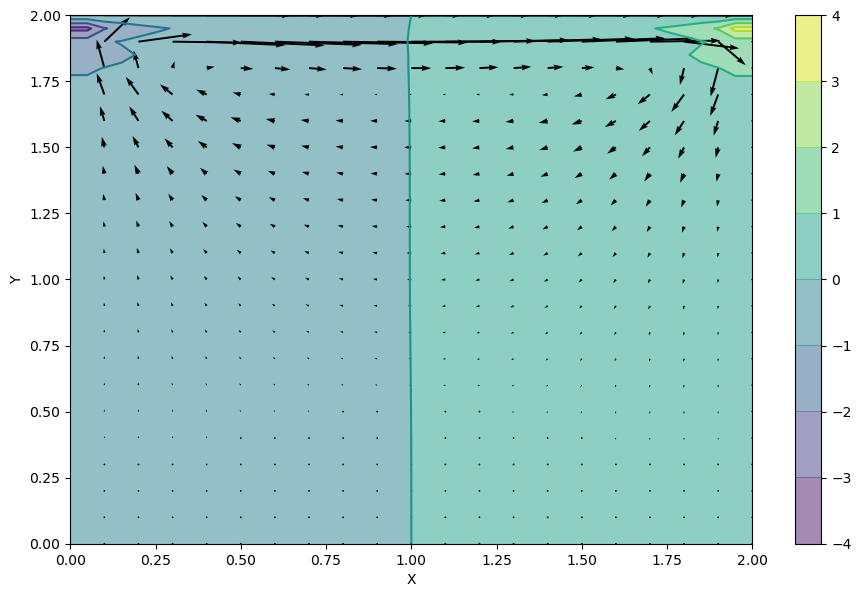

In [97]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

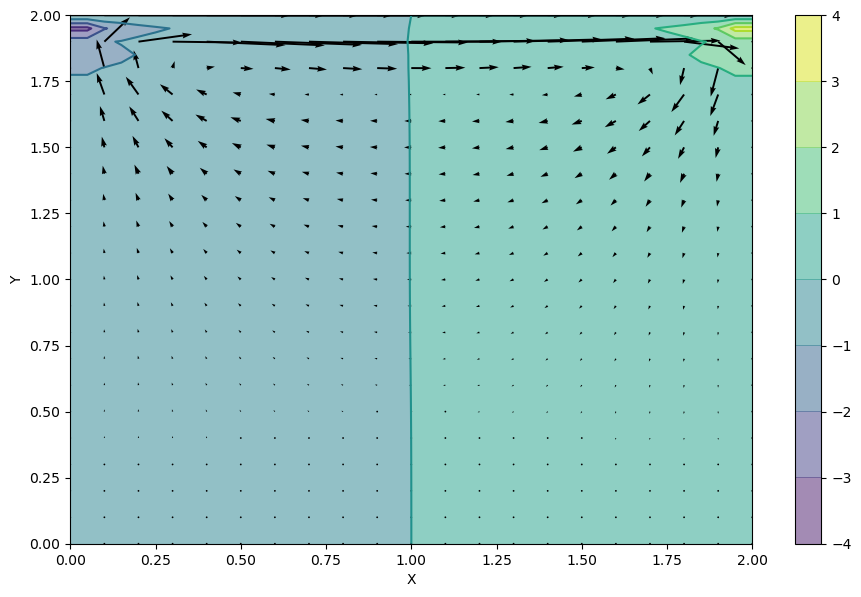

In [98]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

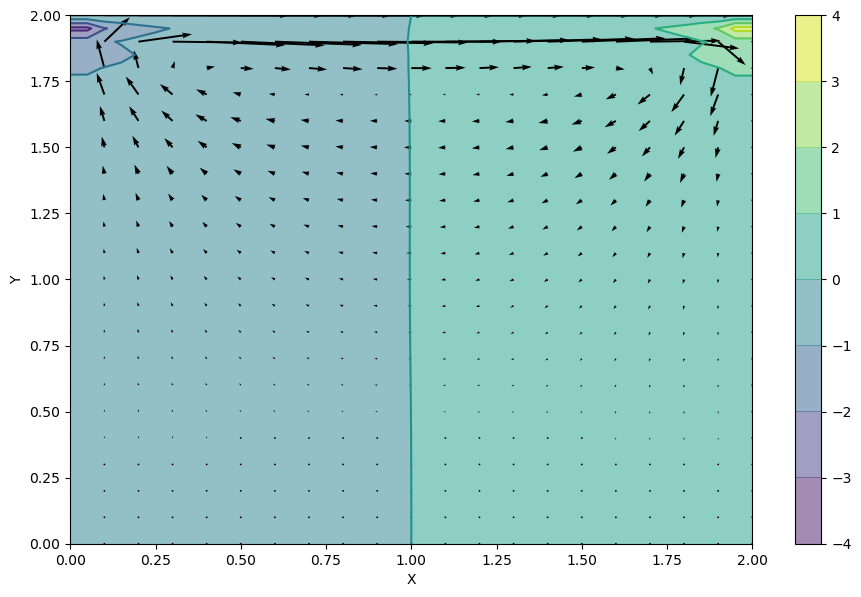

In [99]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

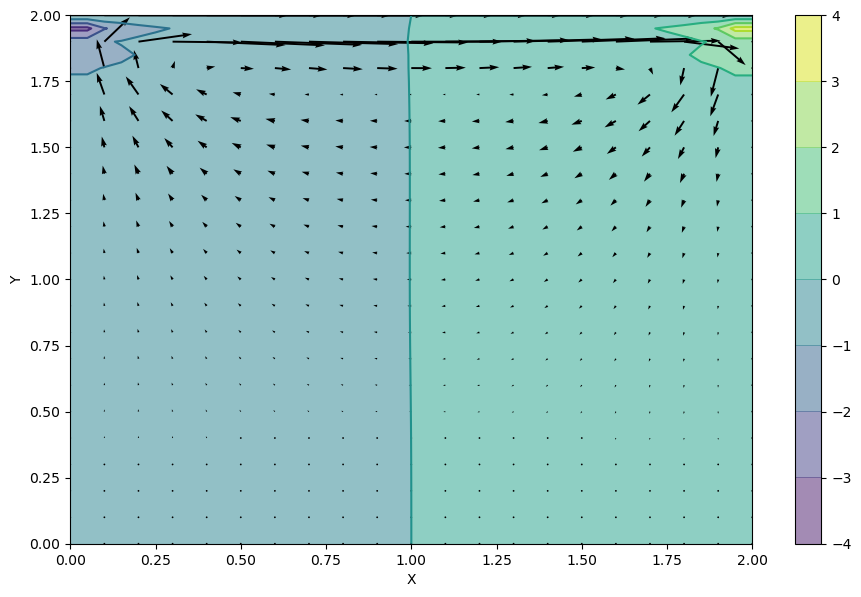

In [100]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

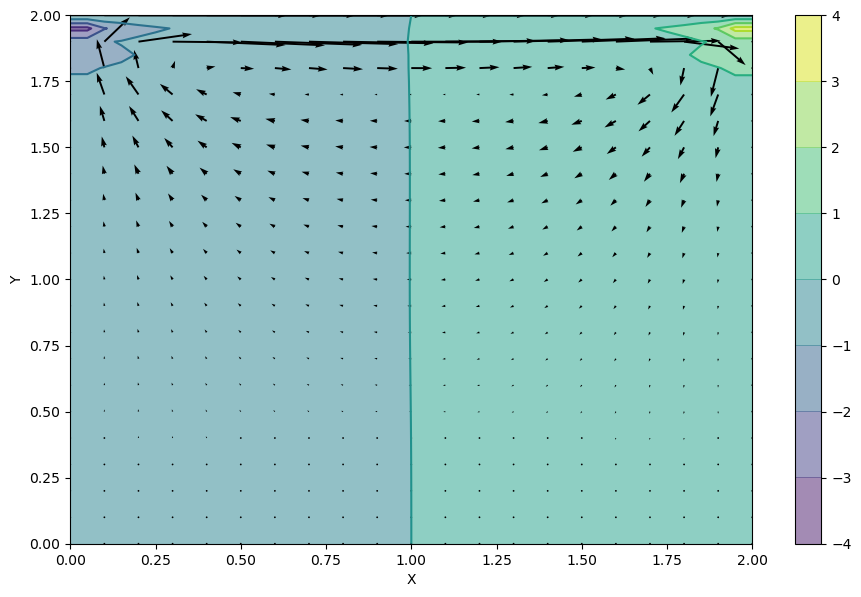

In [101]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

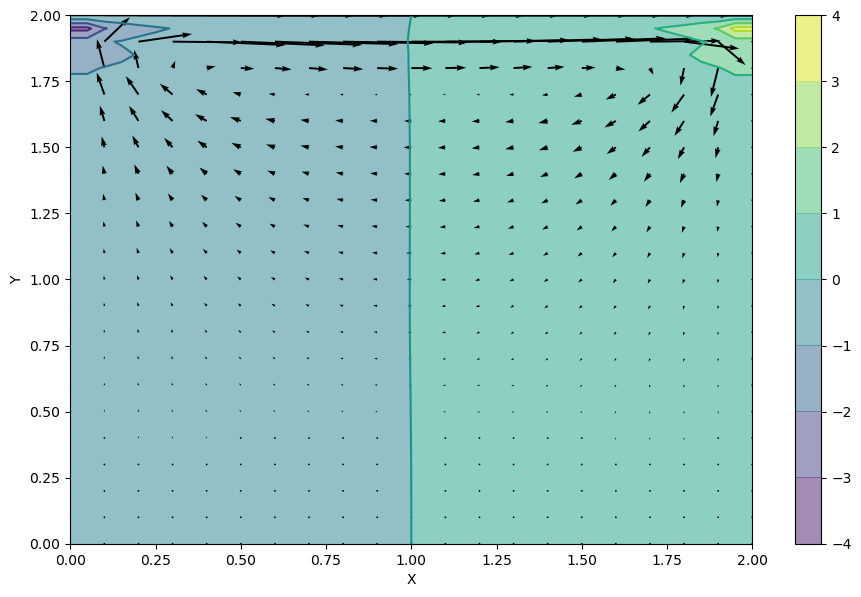

In [102]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

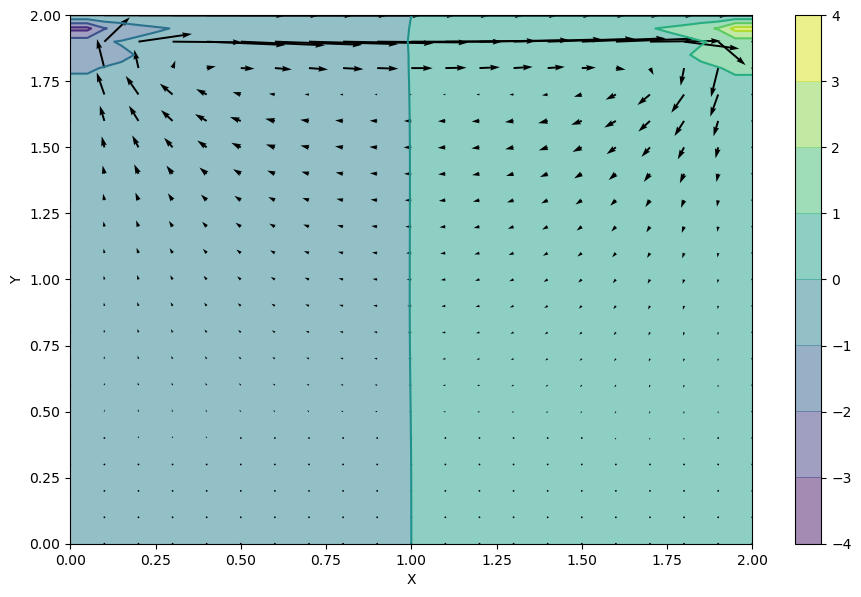

In [103]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

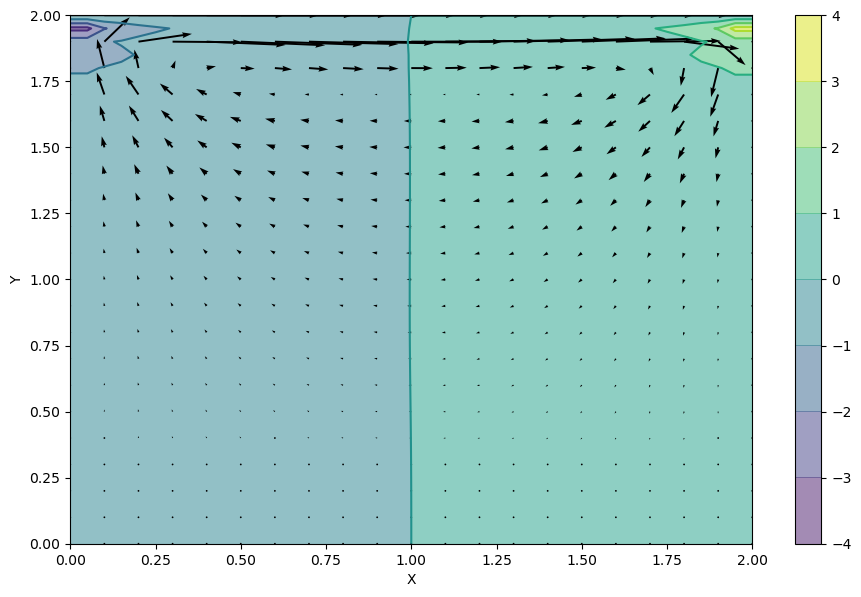

In [104]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

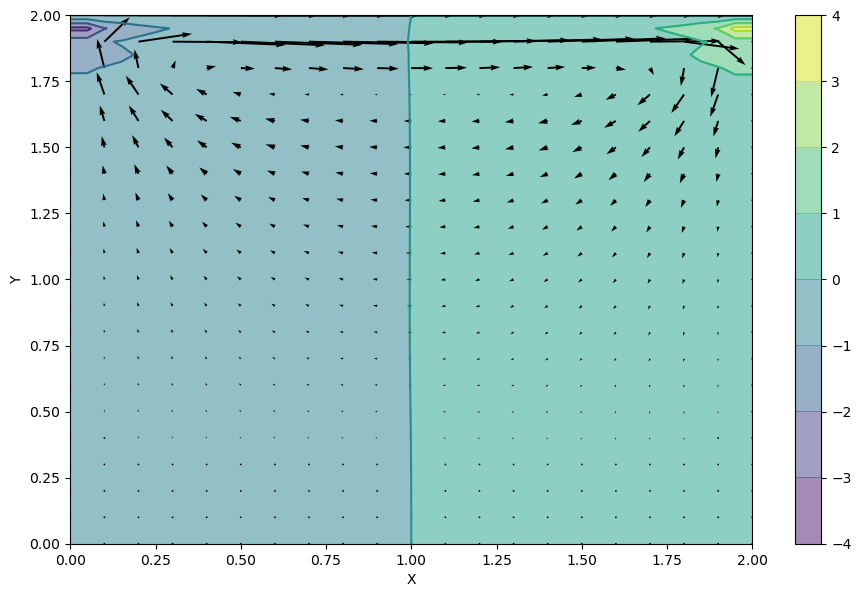

In [105]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

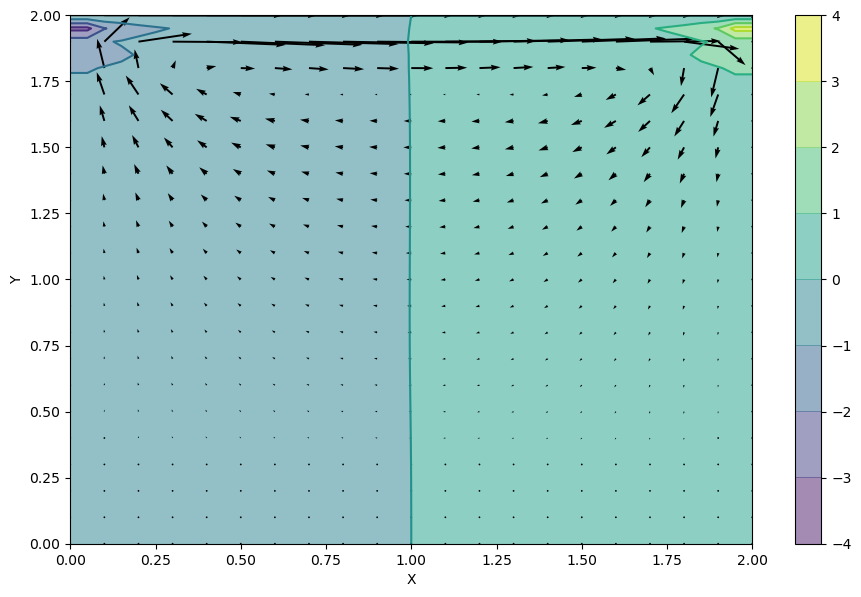

In [106]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

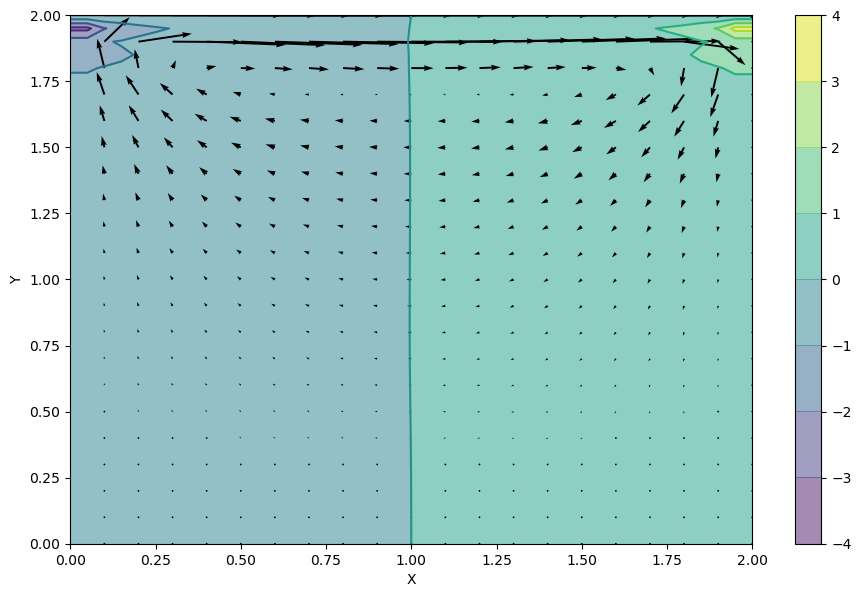

In [107]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

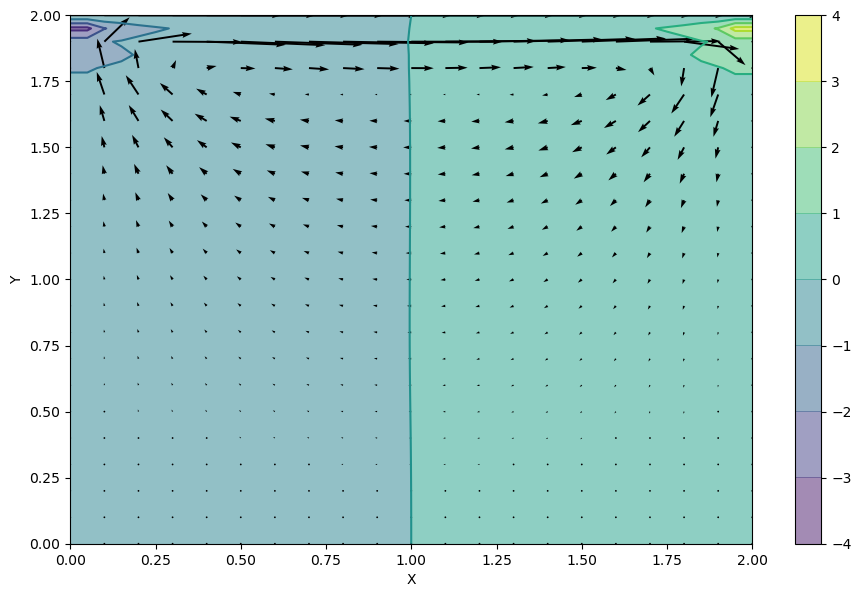

In [108]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

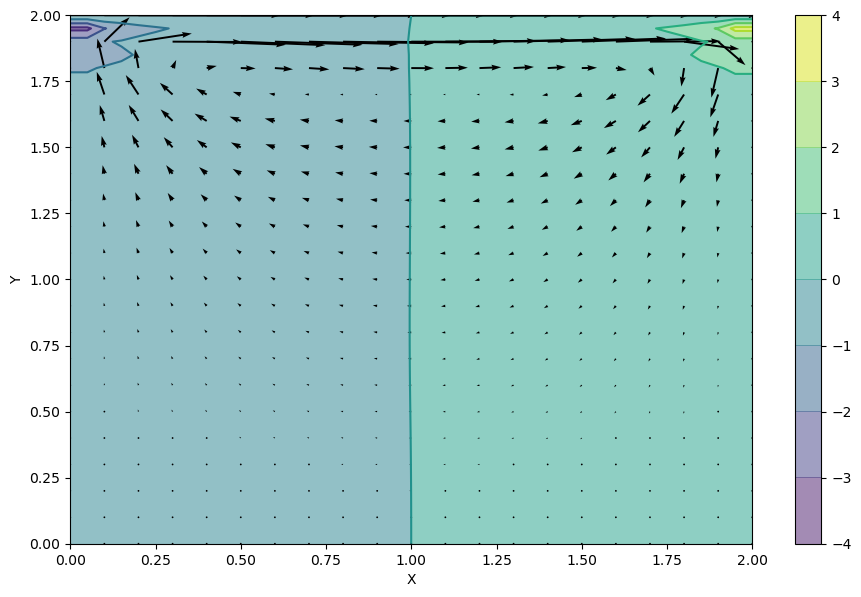

In [109]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

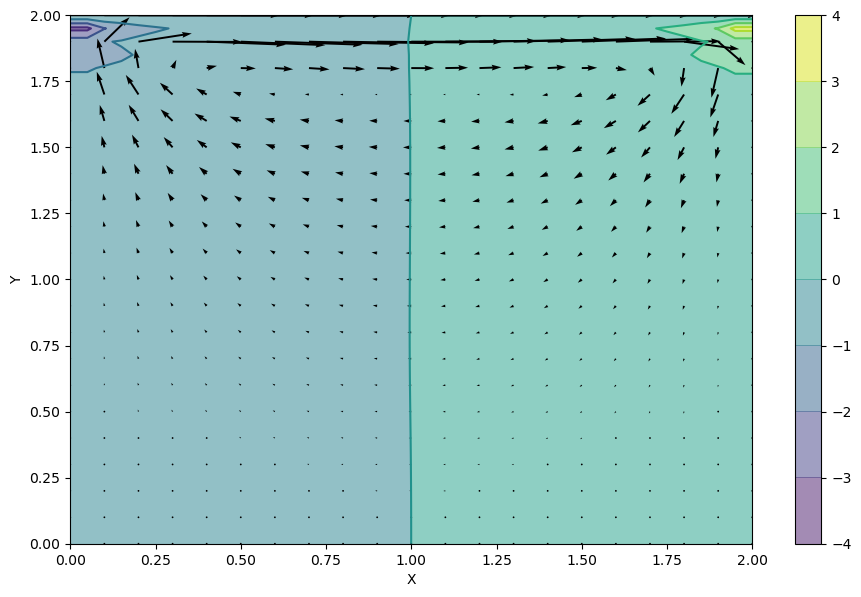

In [110]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

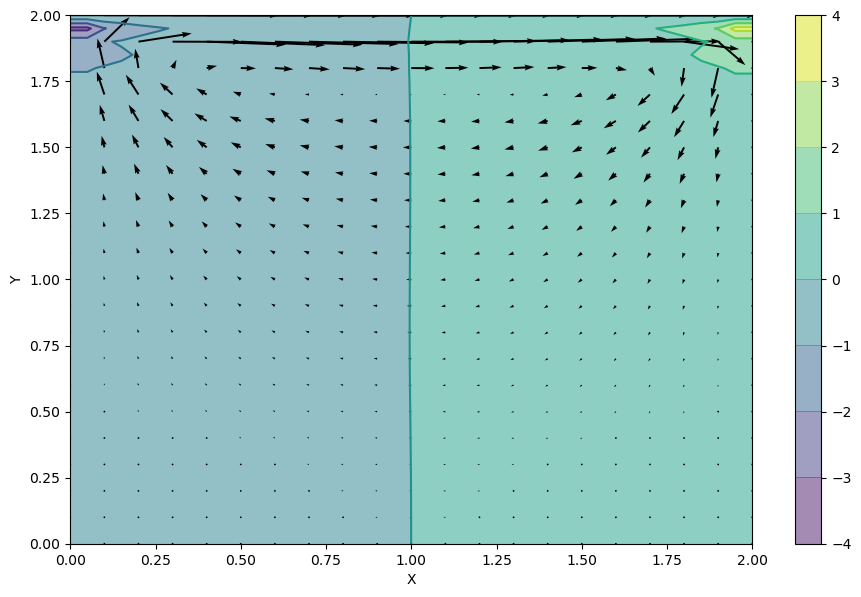

In [111]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

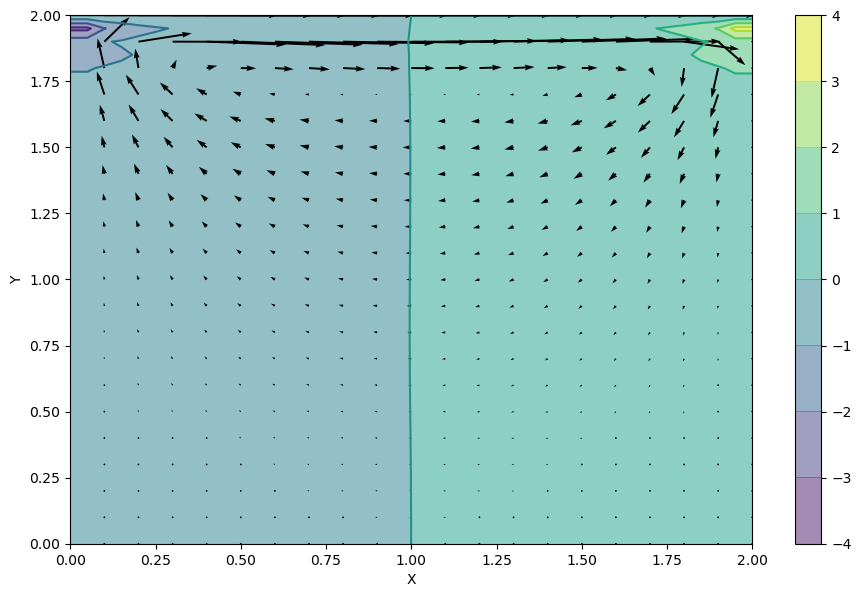

In [112]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

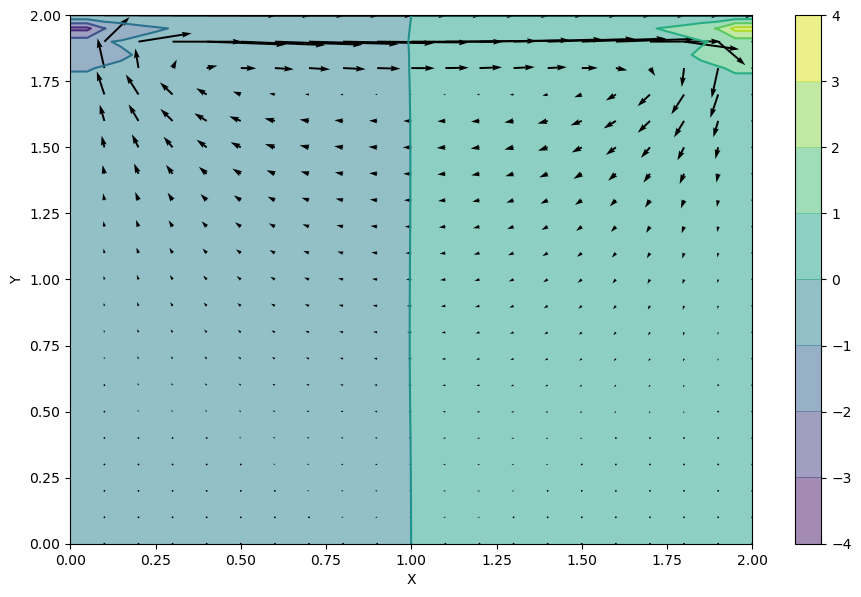

In [113]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

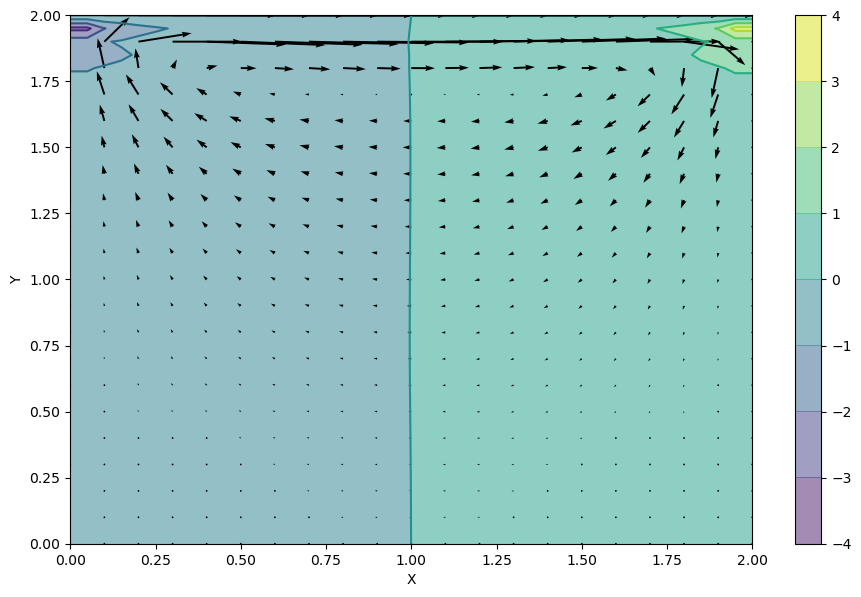

In [114]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

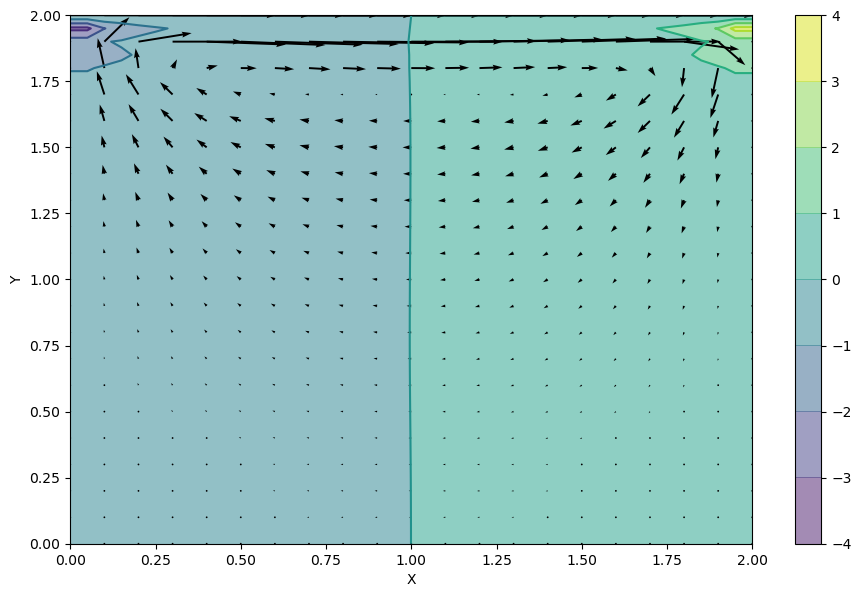

In [115]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

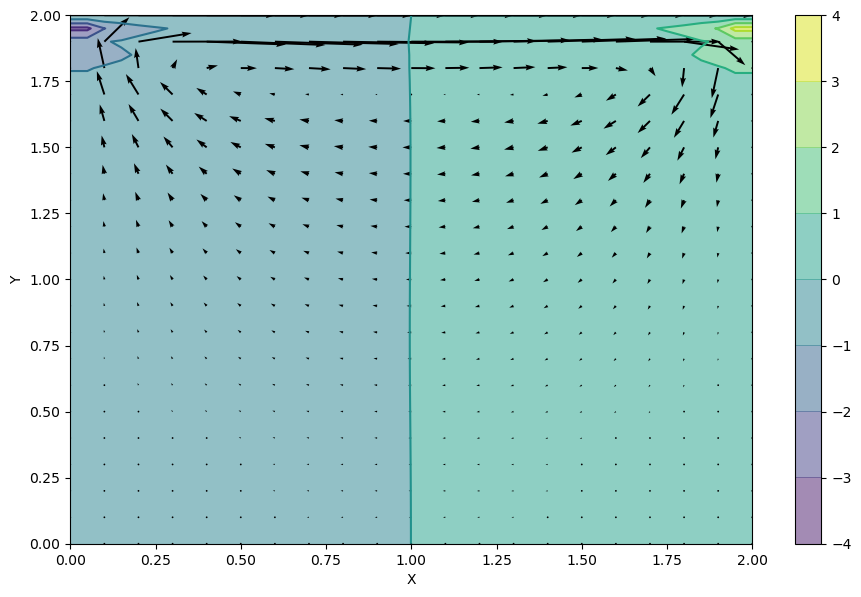

In [116]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

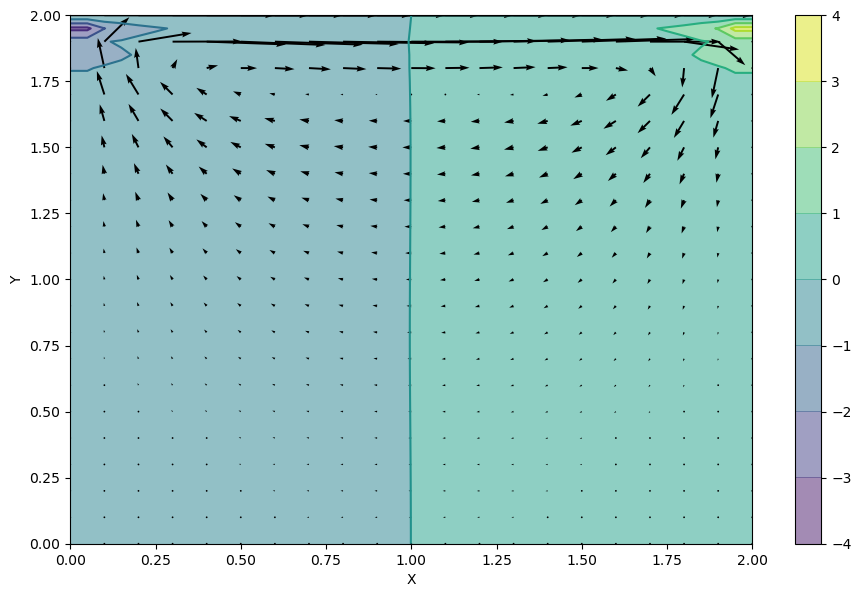

In [117]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

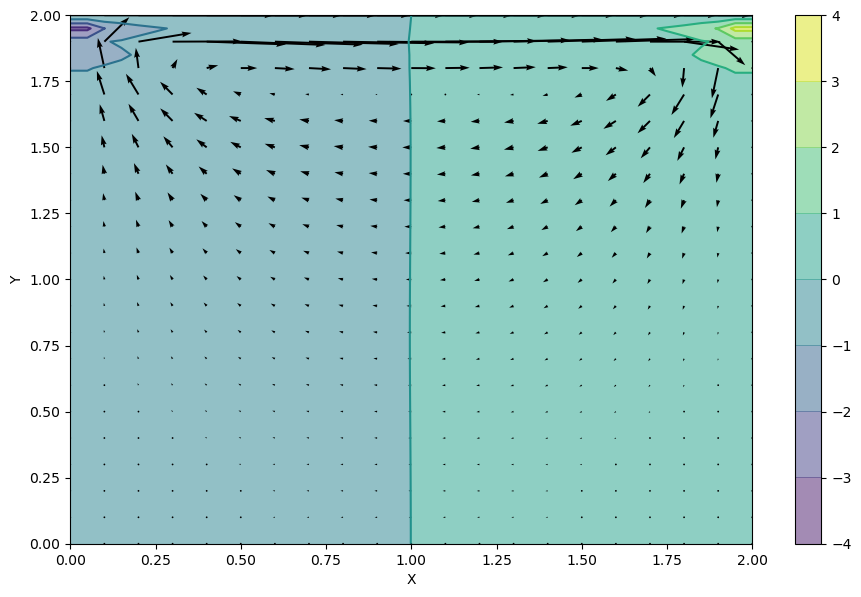

In [118]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

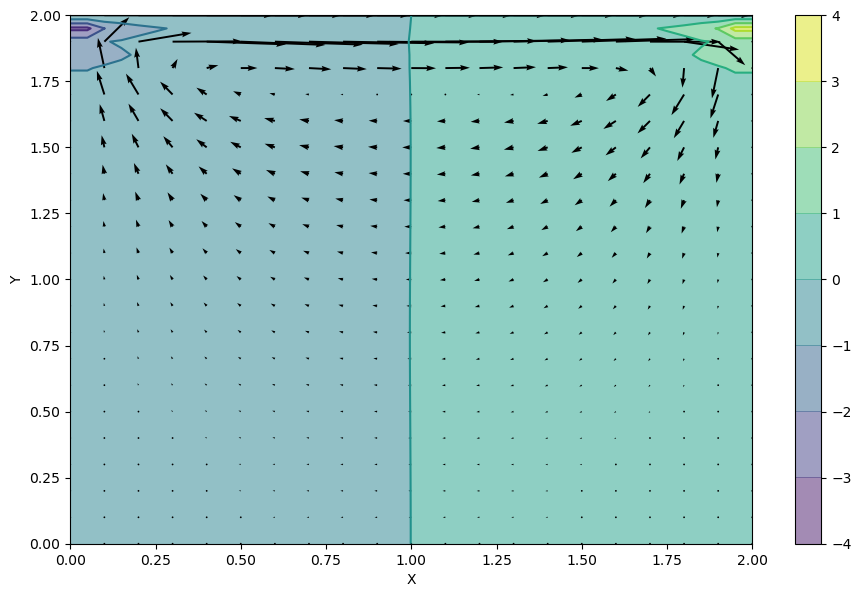

In [119]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

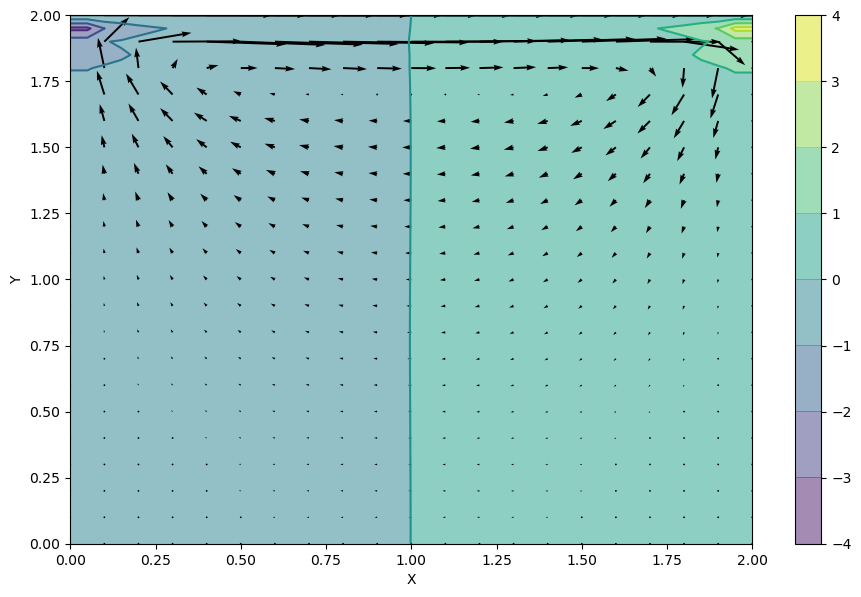

In [120]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

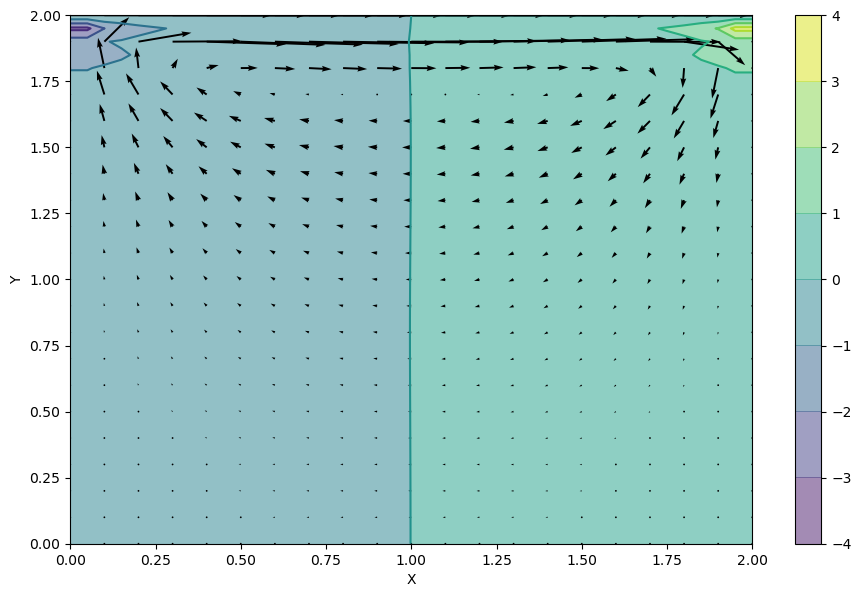

In [121]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

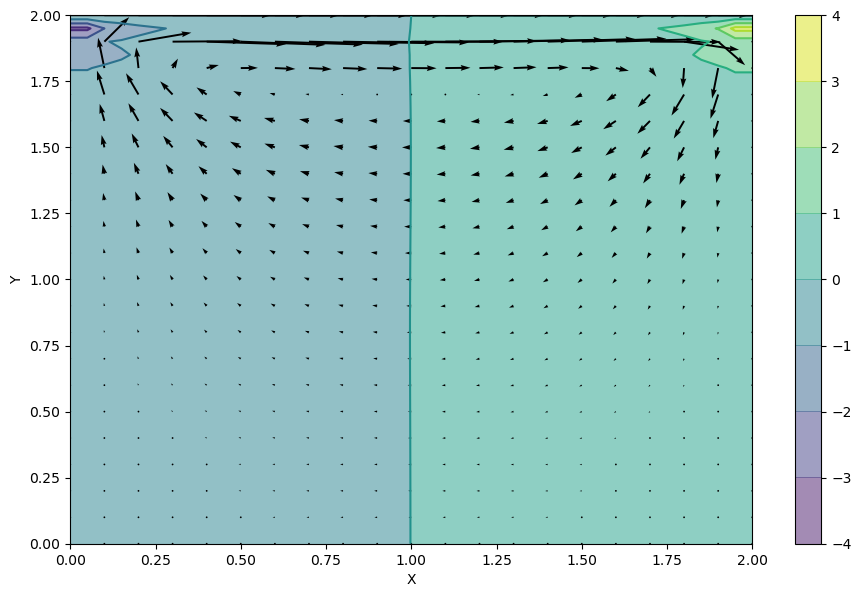

In [122]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

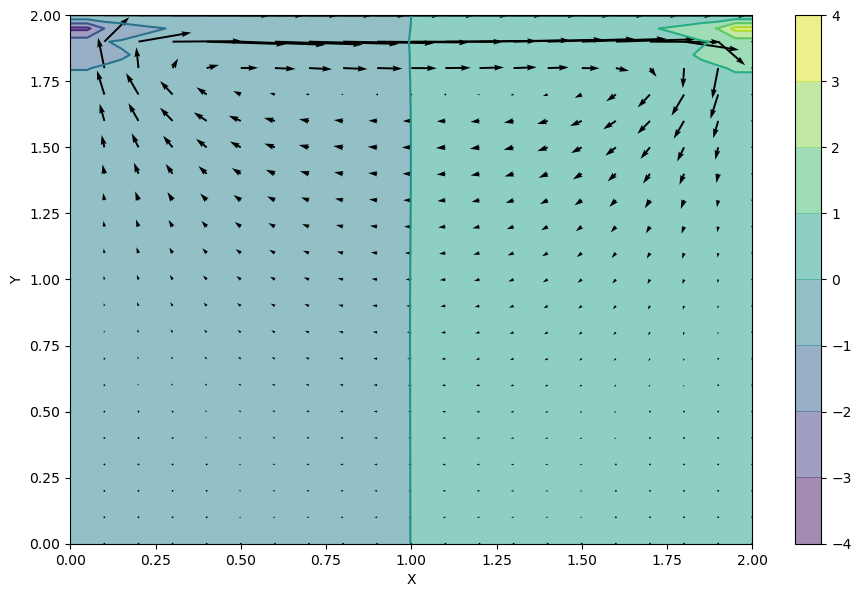

In [123]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

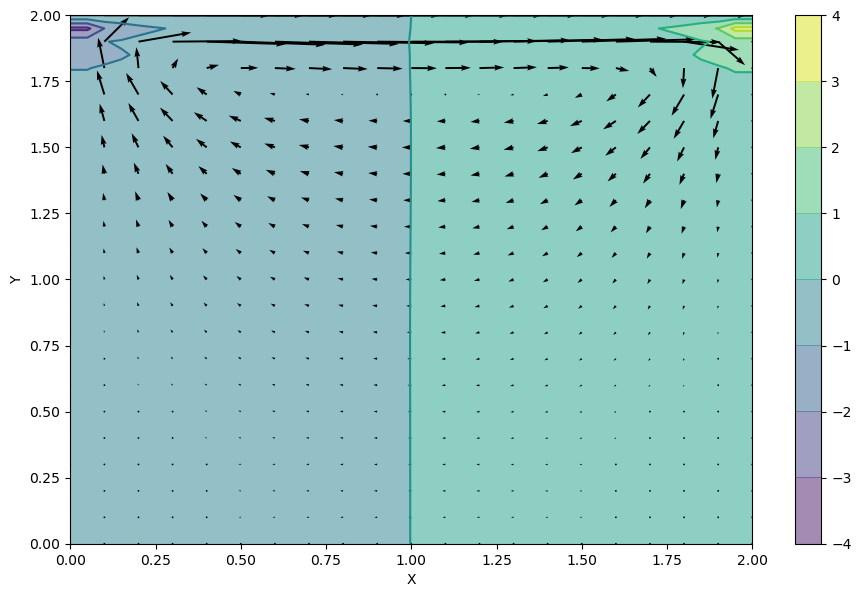

In [124]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

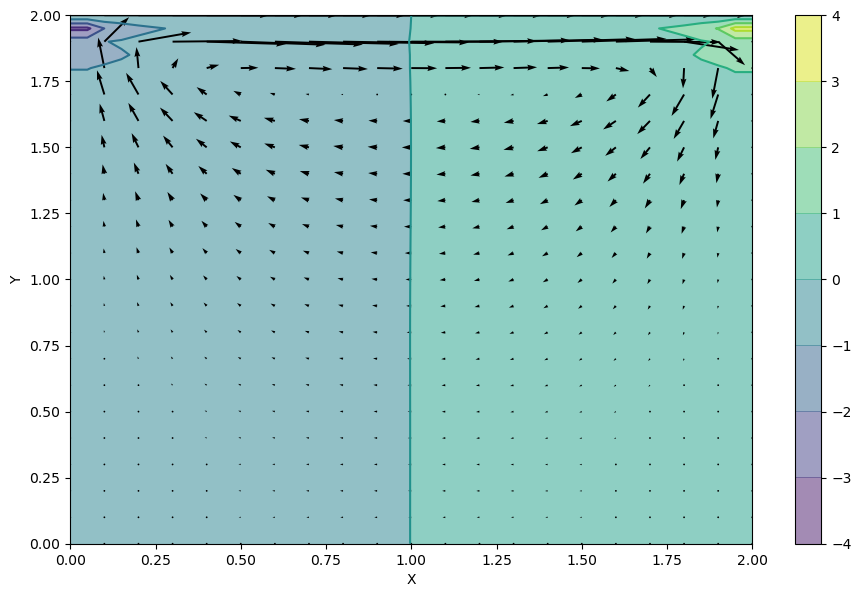

In [125]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

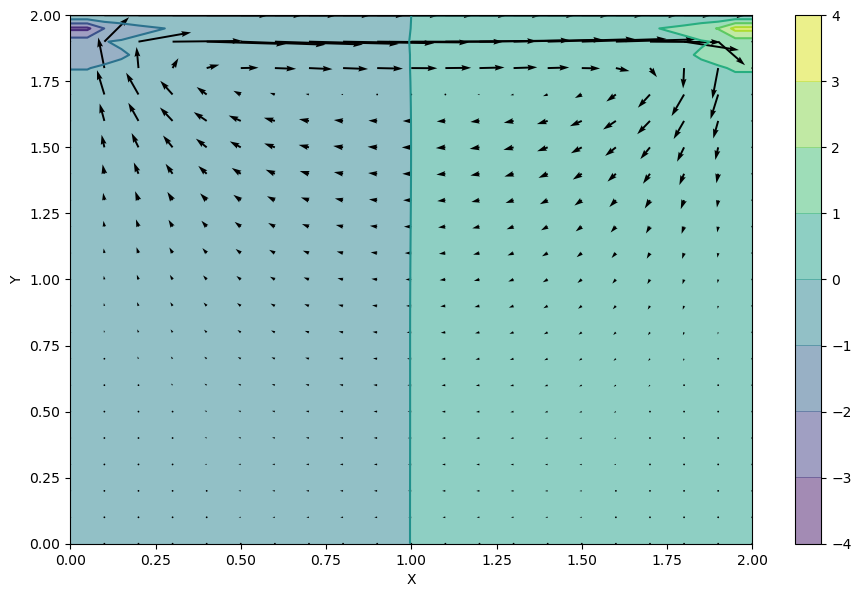

In [126]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

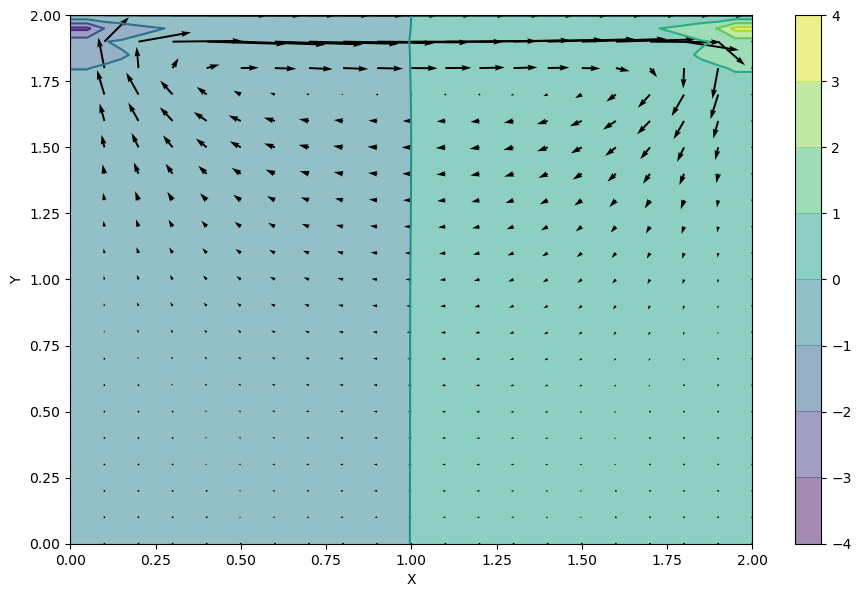

In [127]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

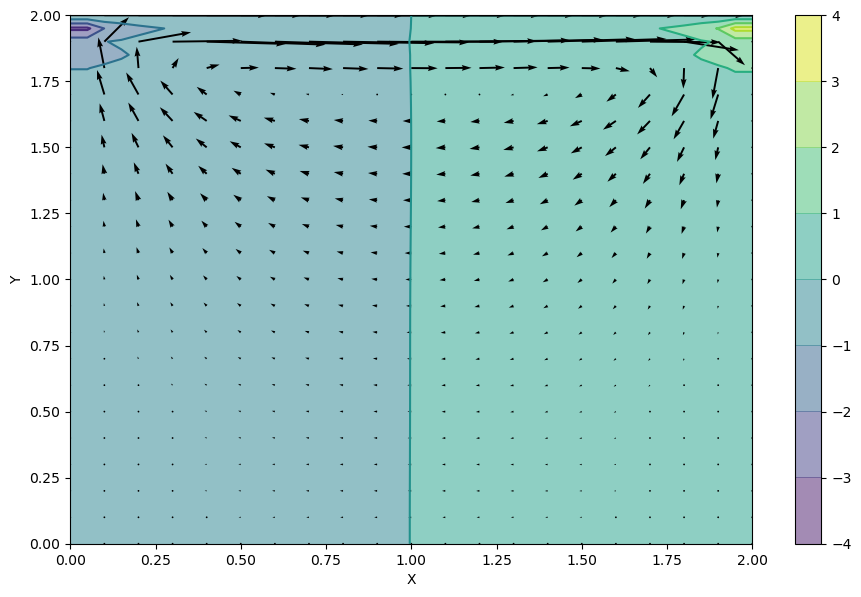

In [128]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

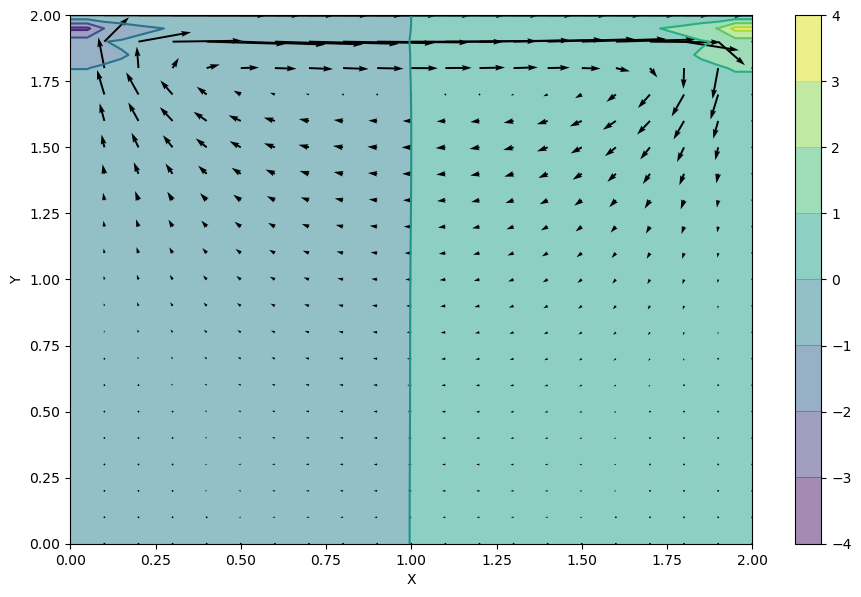

In [129]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

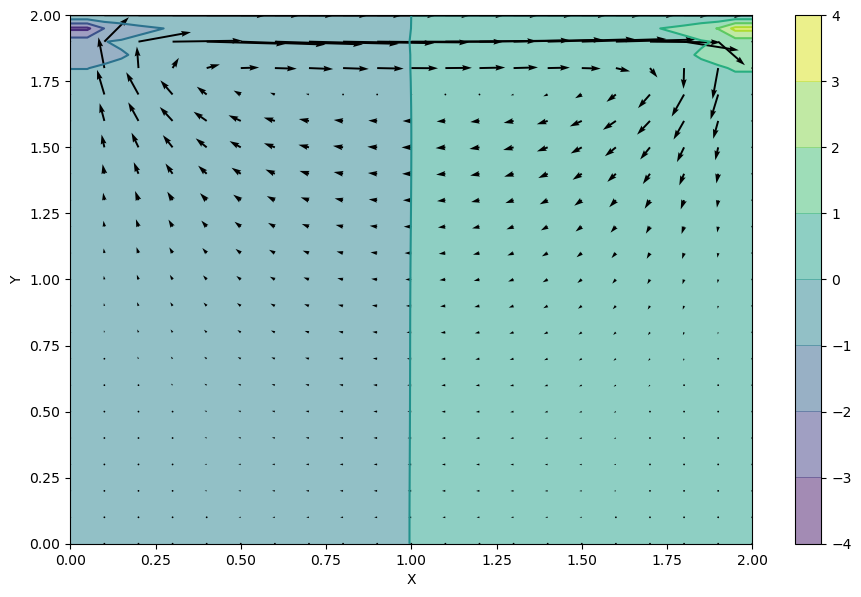

In [130]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

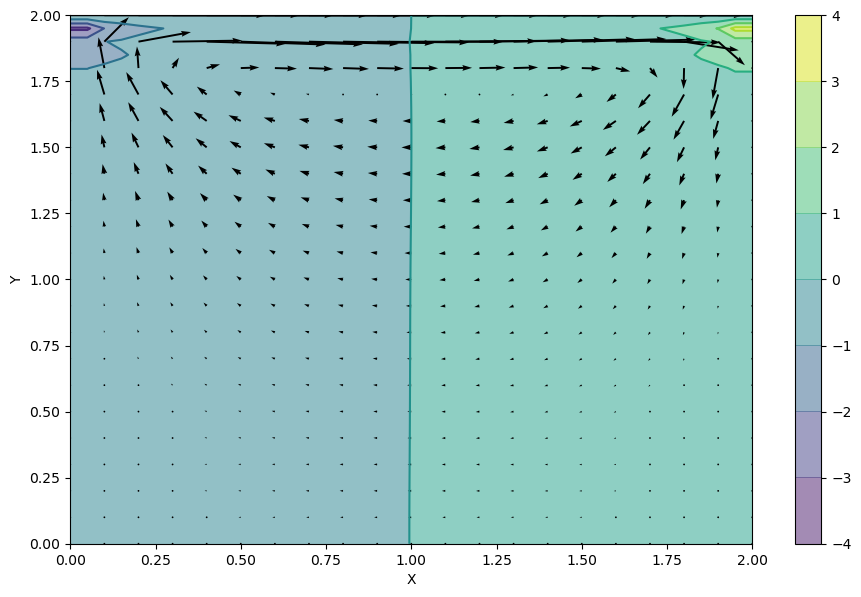

In [131]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

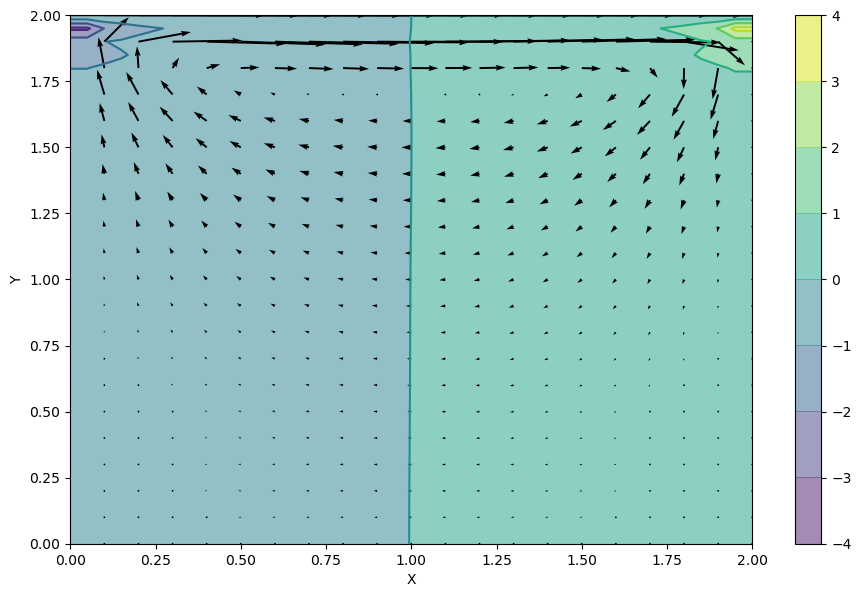

In [132]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

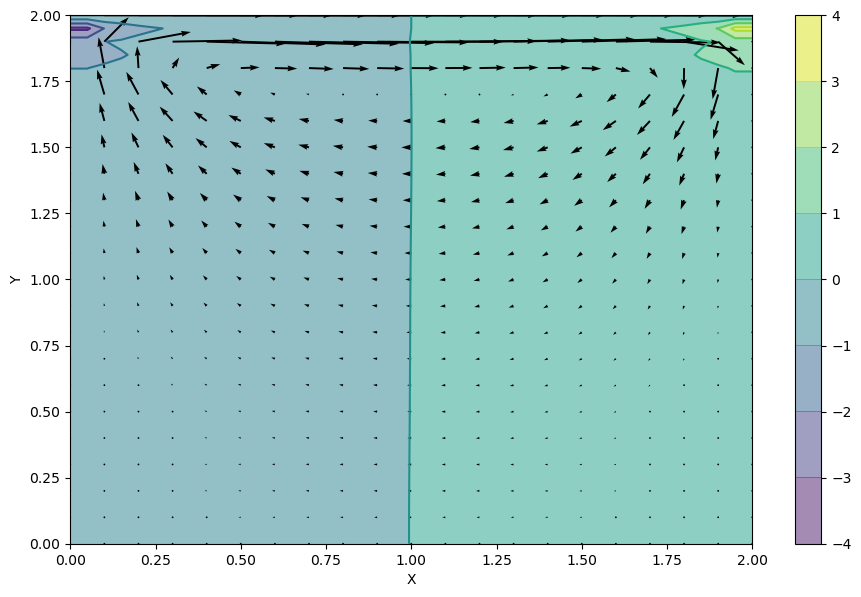

In [133]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

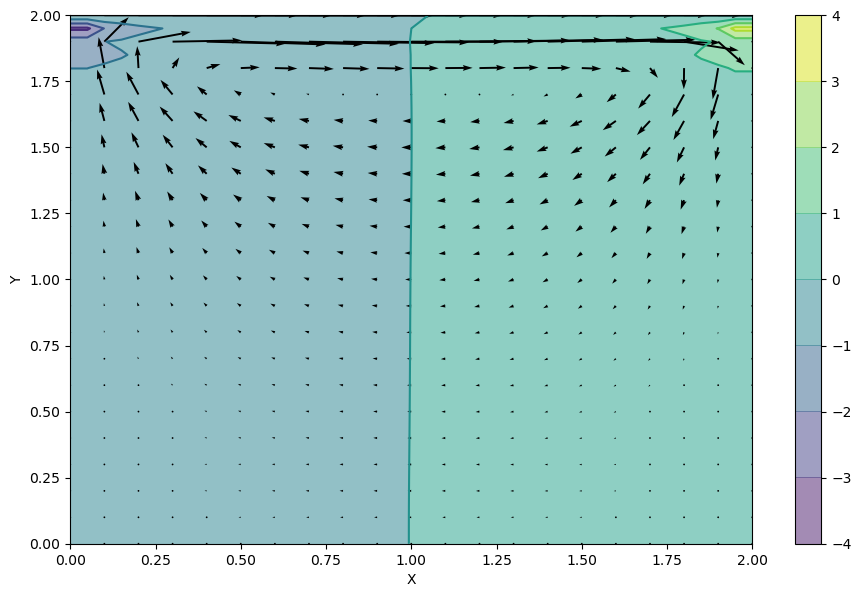

In [134]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

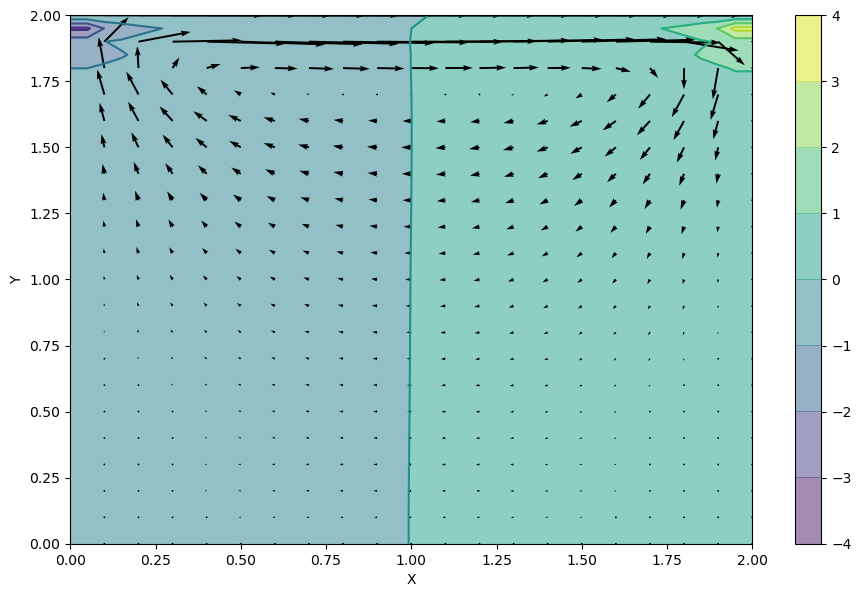

In [135]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

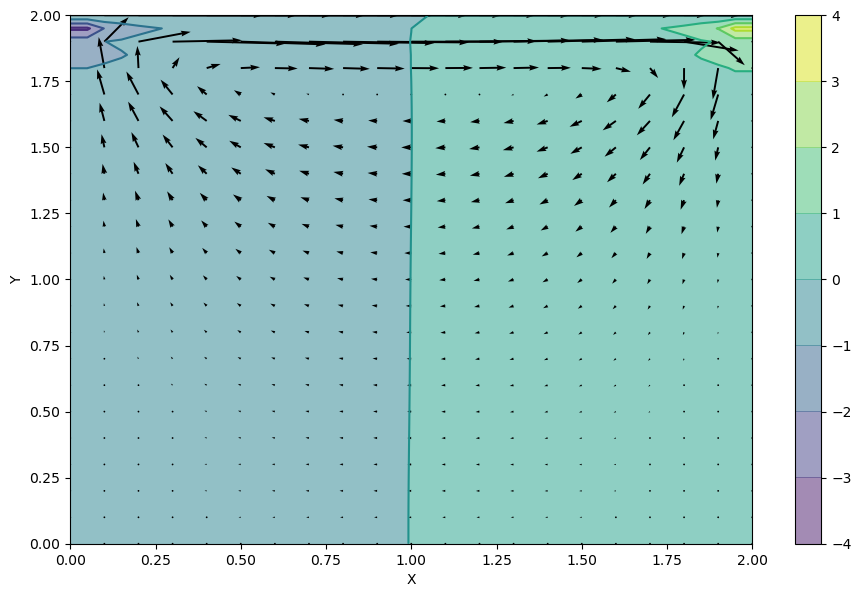

In [136]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

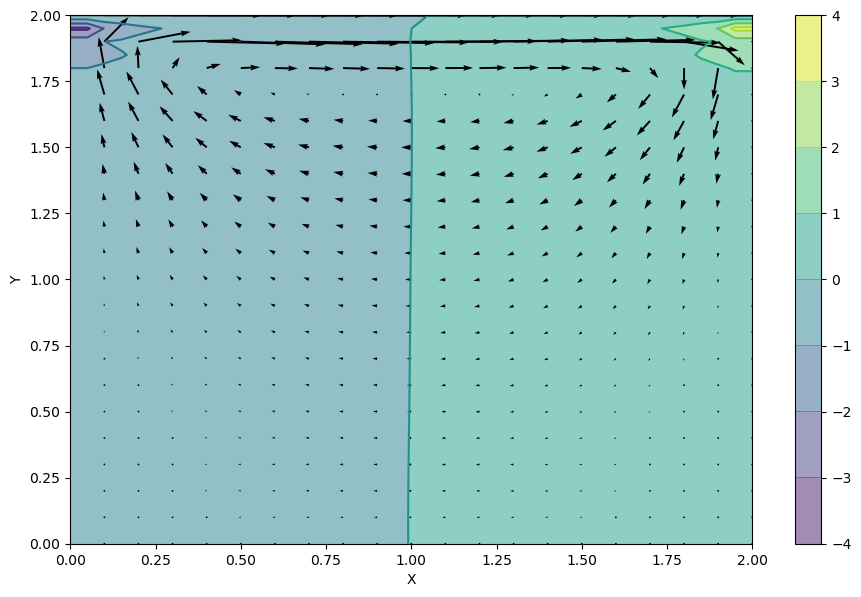

In [137]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

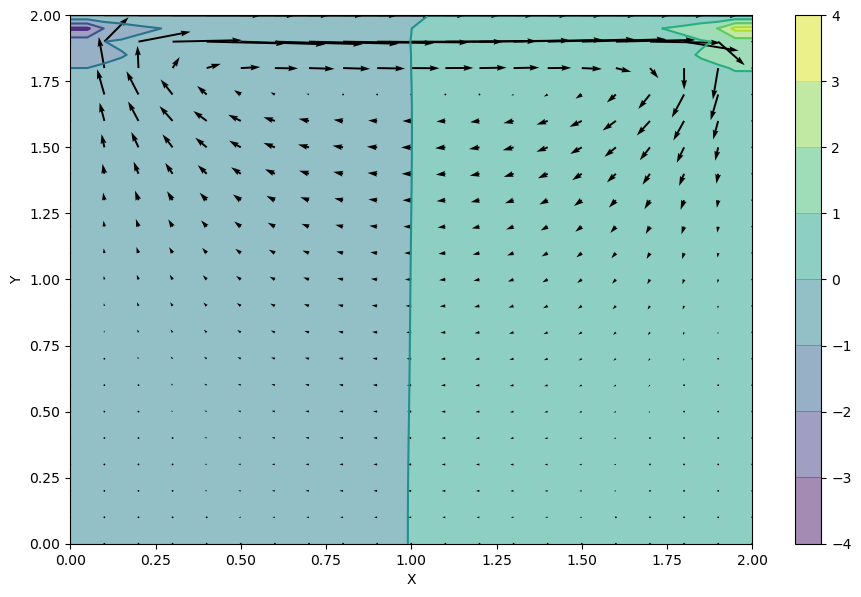

In [138]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

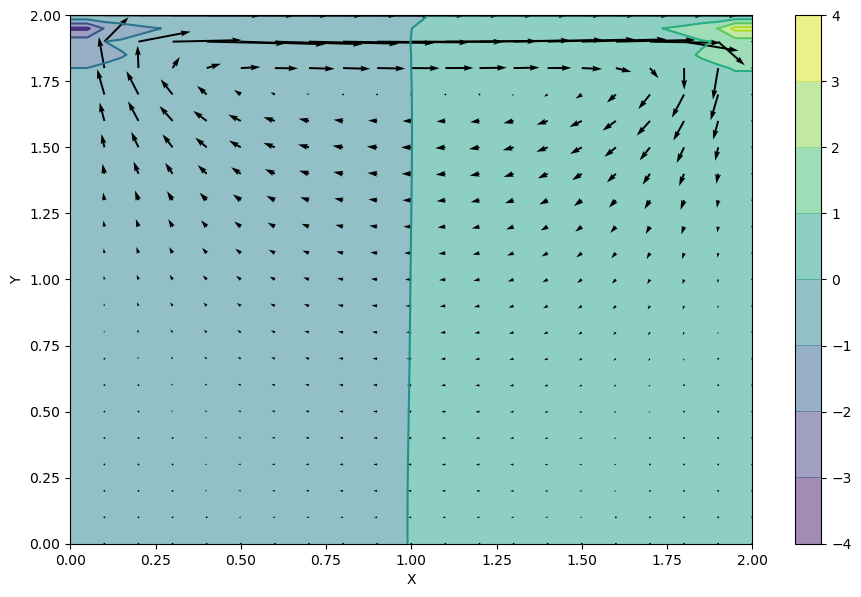

In [139]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

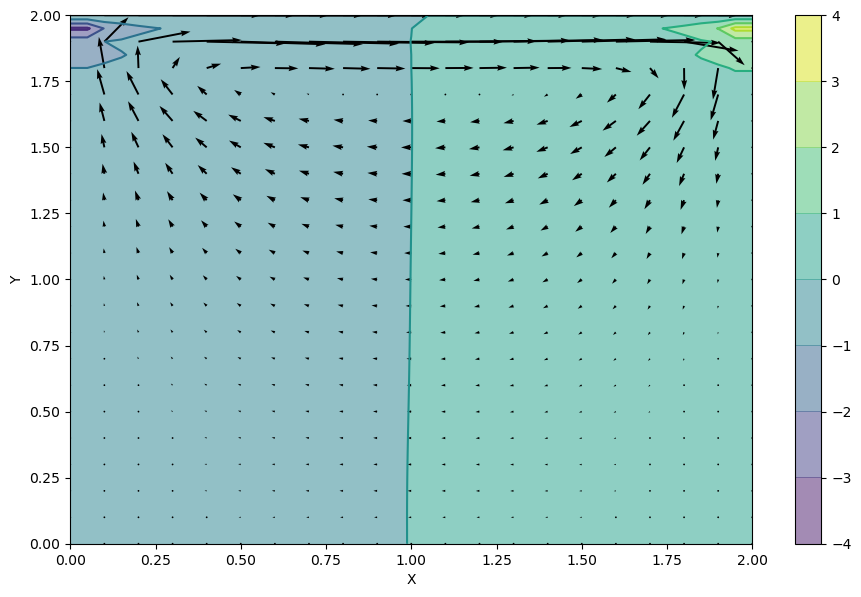

In [140]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

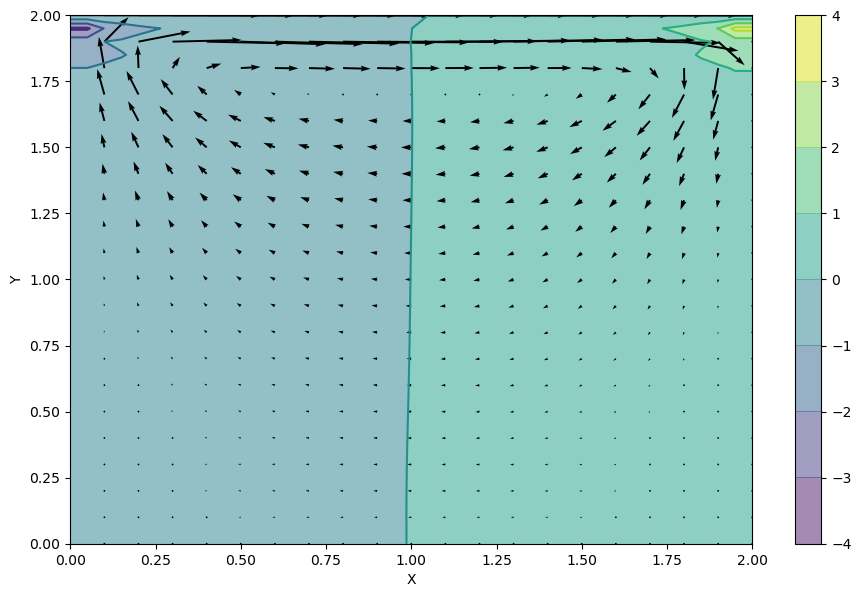

In [141]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

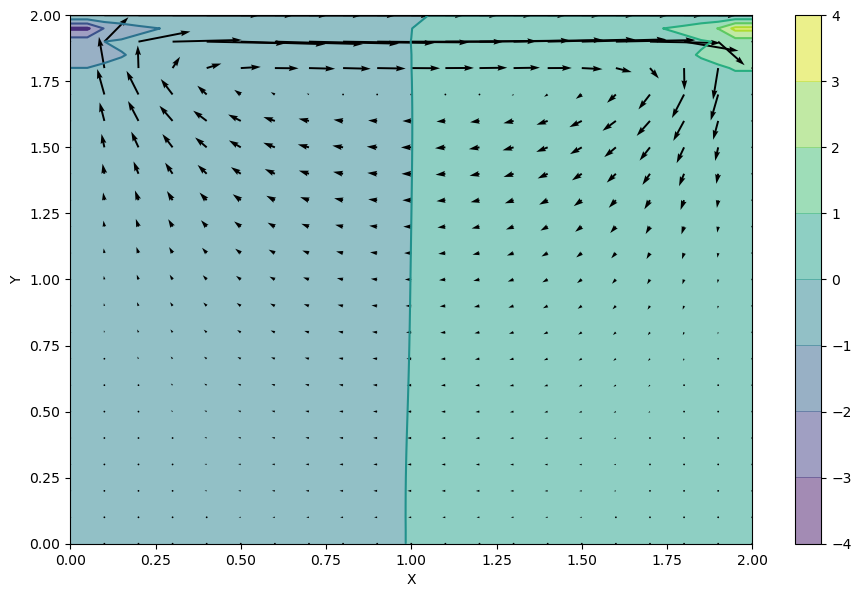

In [142]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

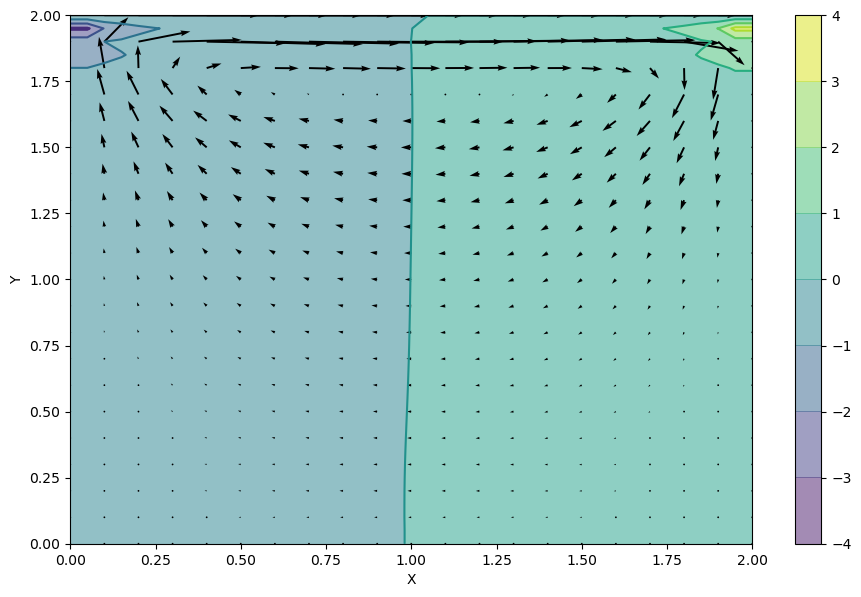

In [143]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

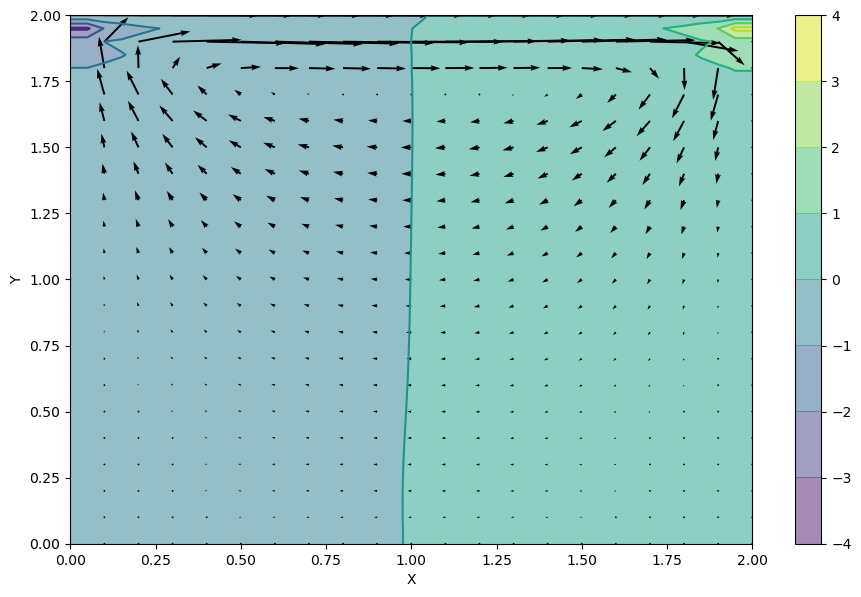

In [144]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

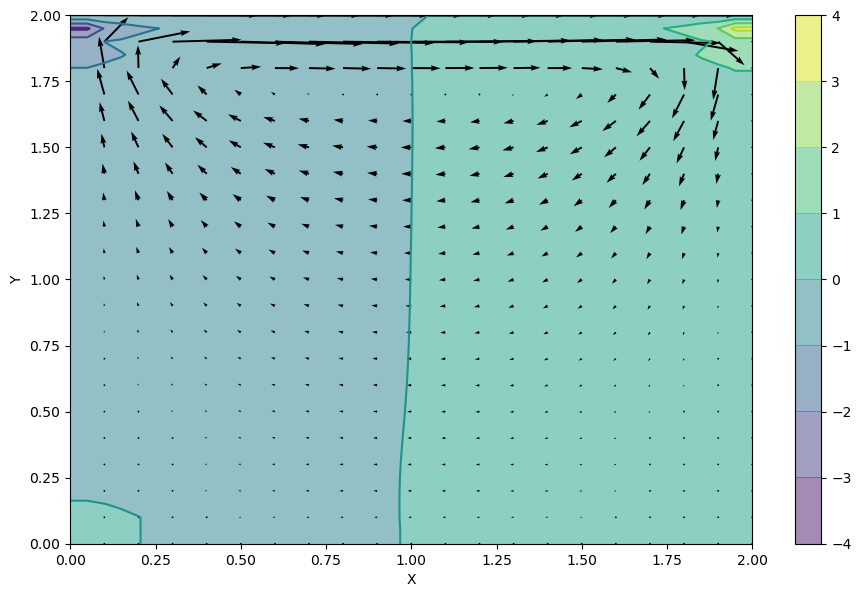

In [145]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

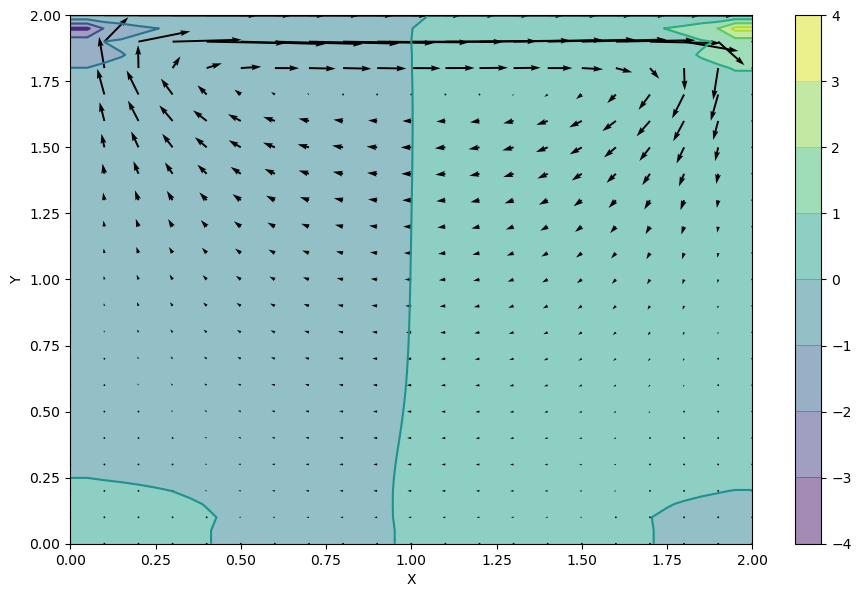

In [146]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

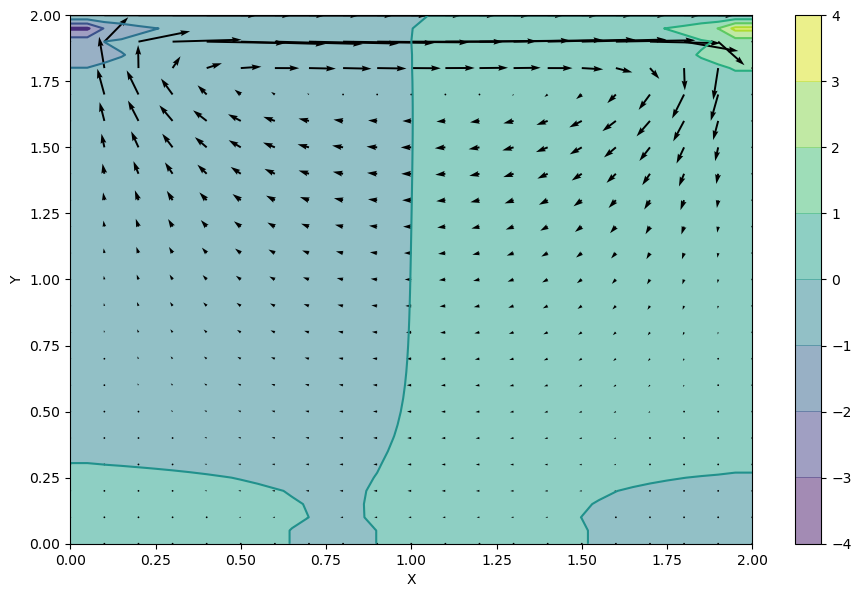

In [147]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

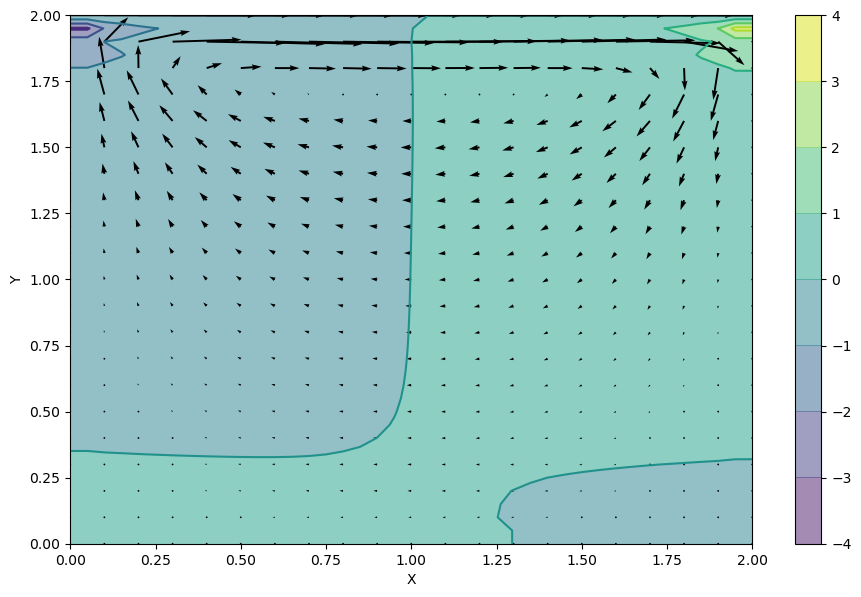

In [148]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

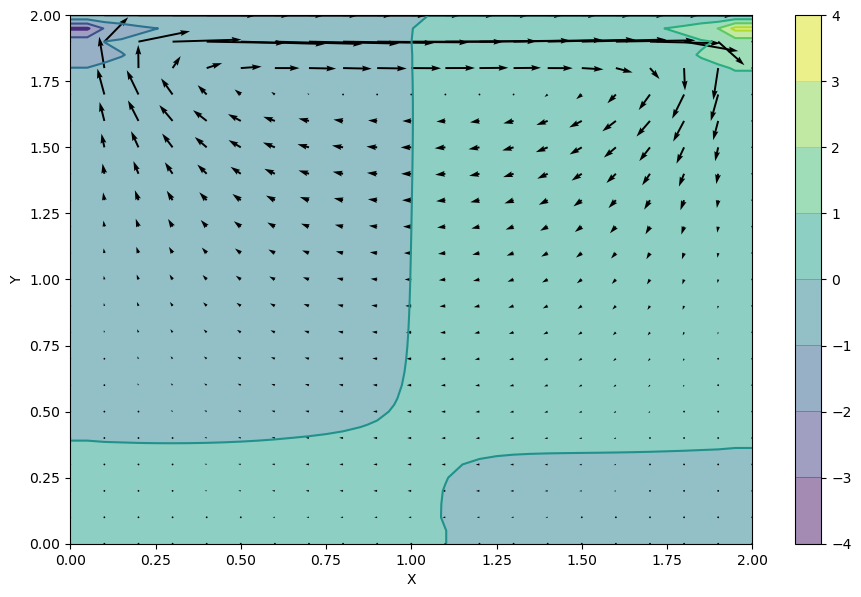

In [149]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

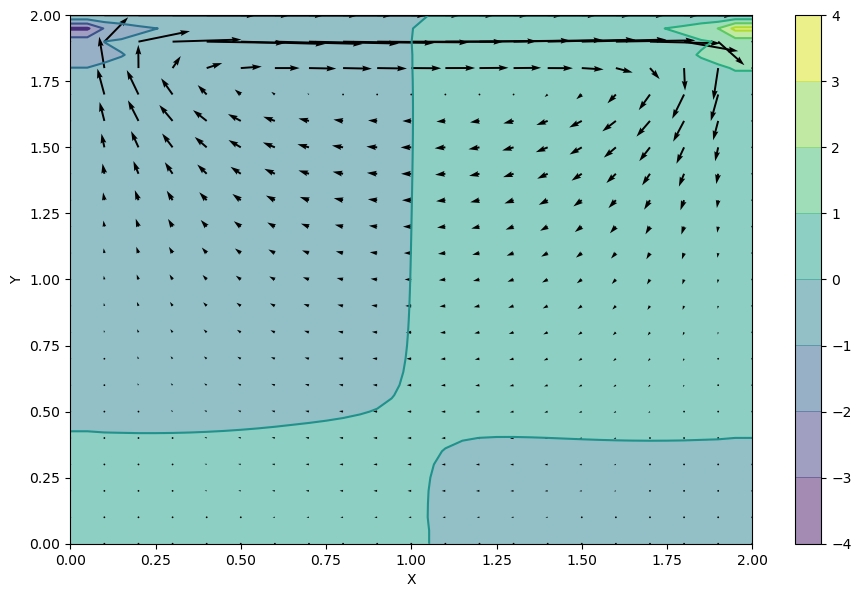

In [150]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

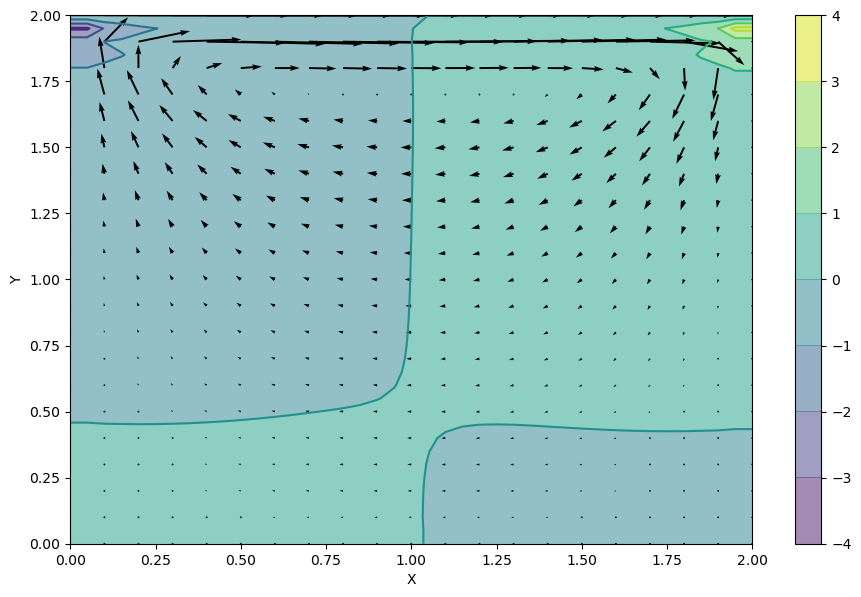

In [151]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

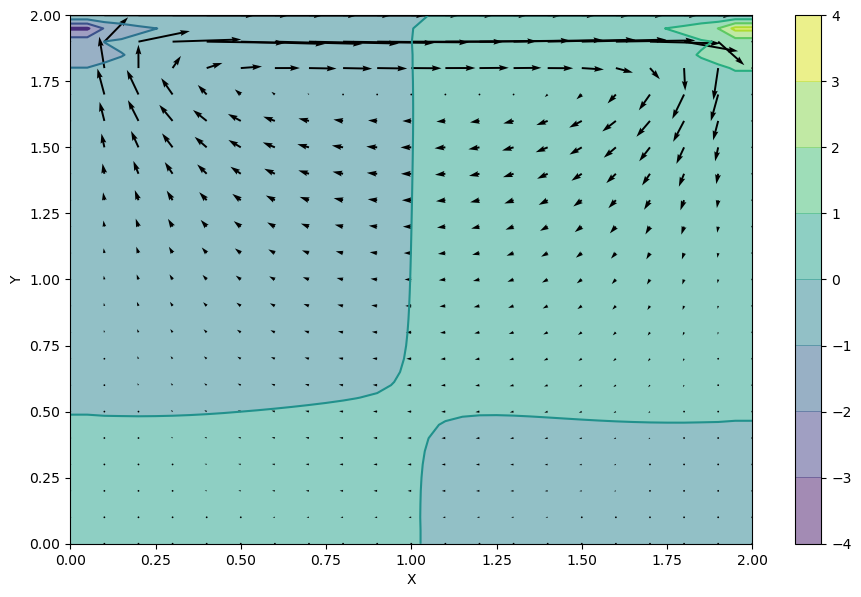

In [152]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

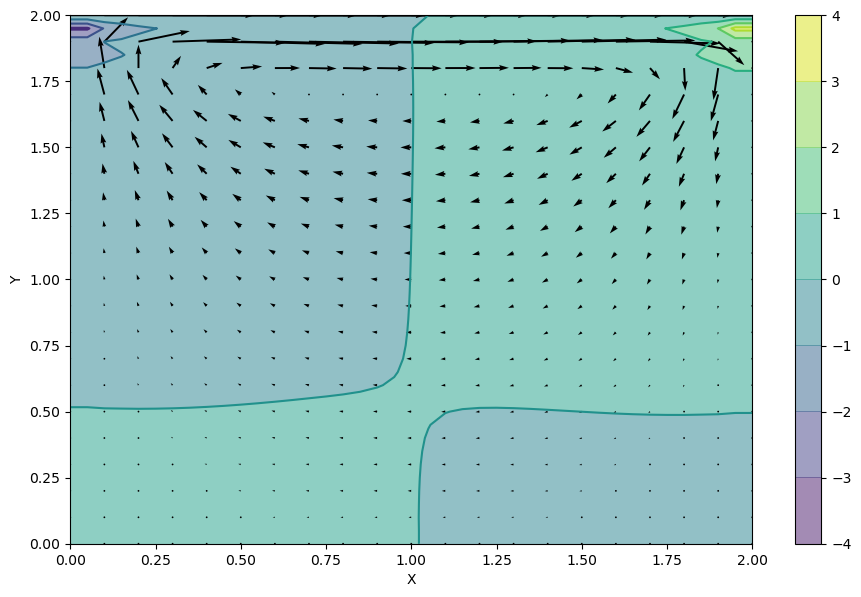

In [153]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

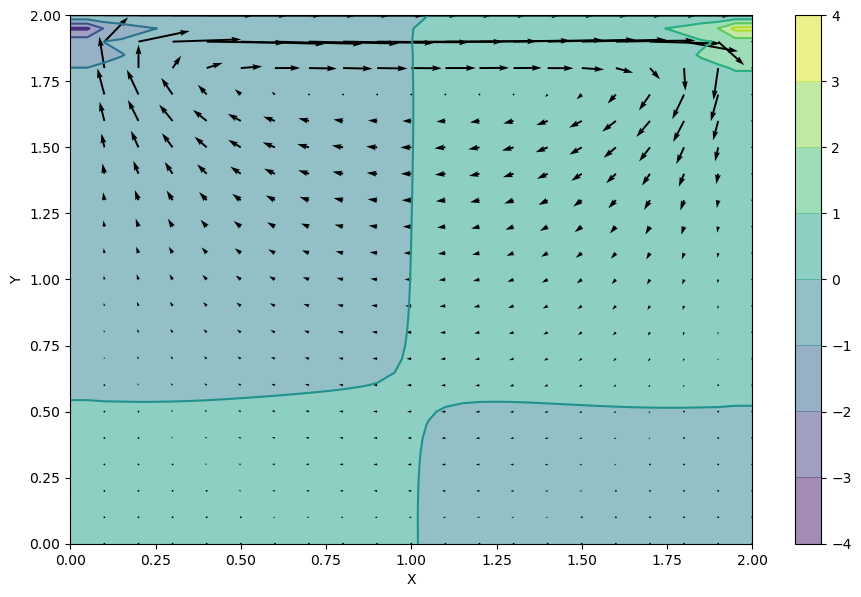

In [154]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

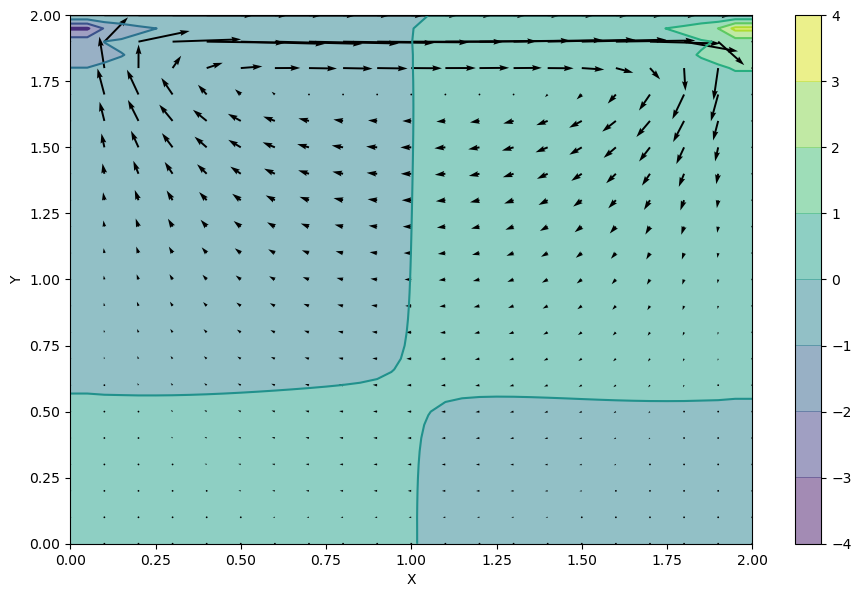

In [155]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

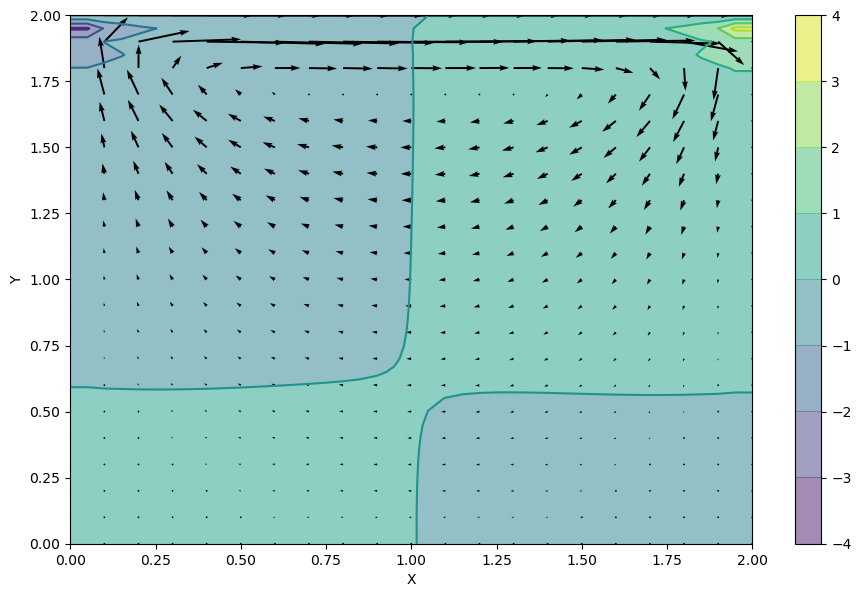

In [156]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

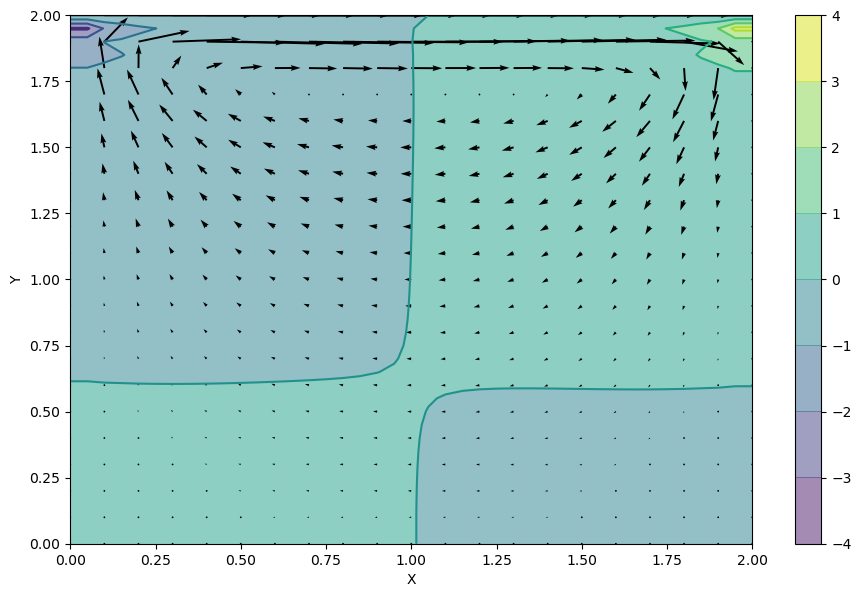

In [157]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

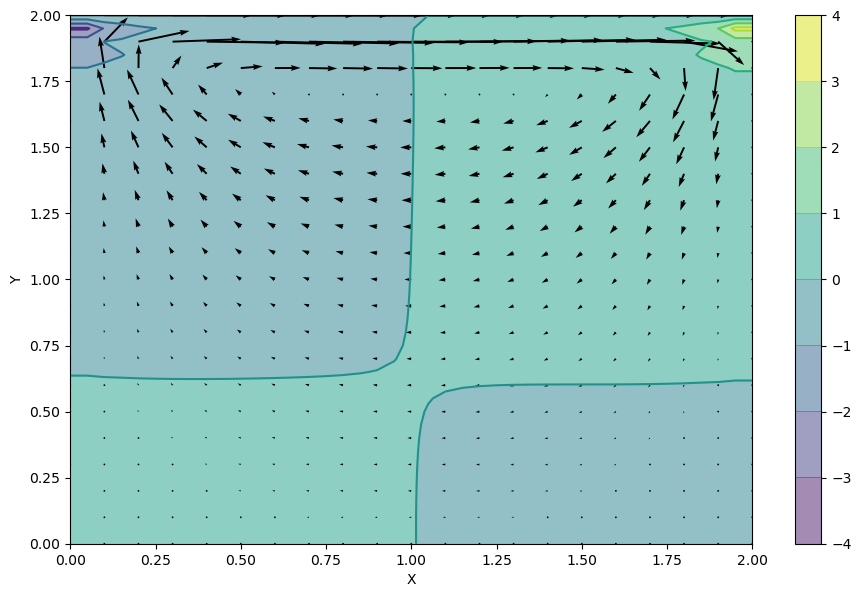

In [158]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

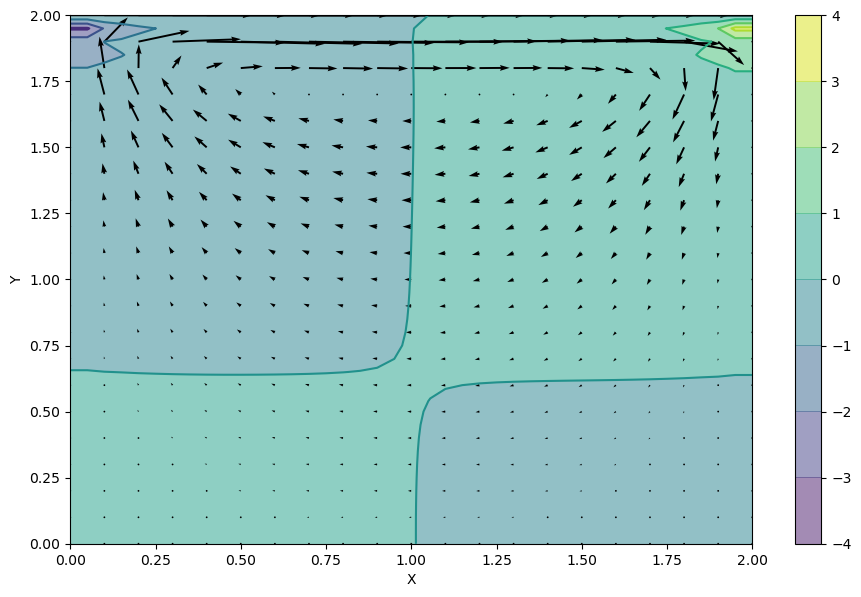

In [159]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

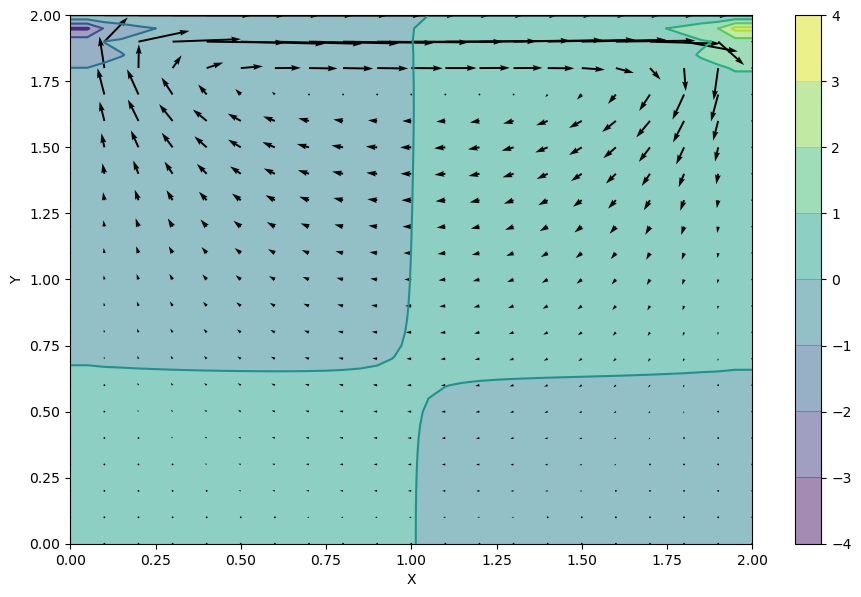

In [160]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

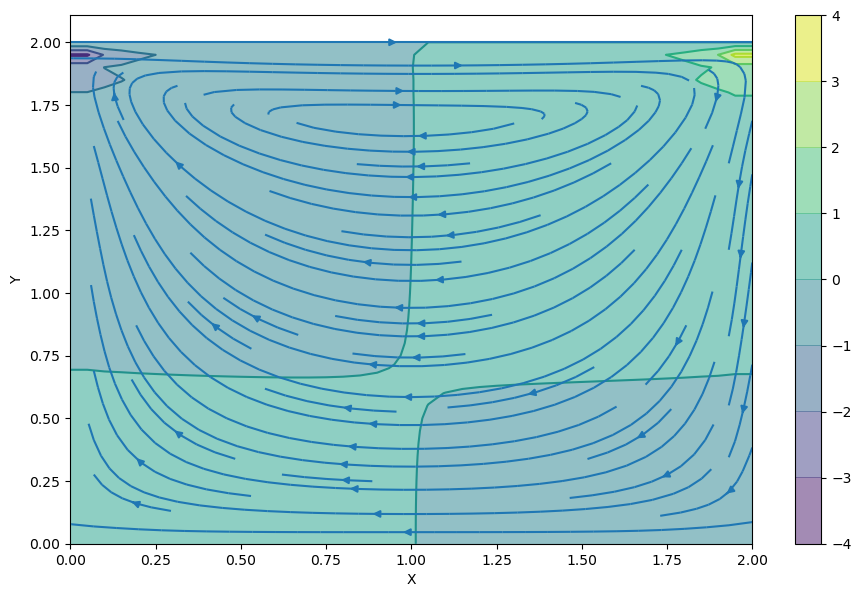

In [161]:
#Streamplot
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()

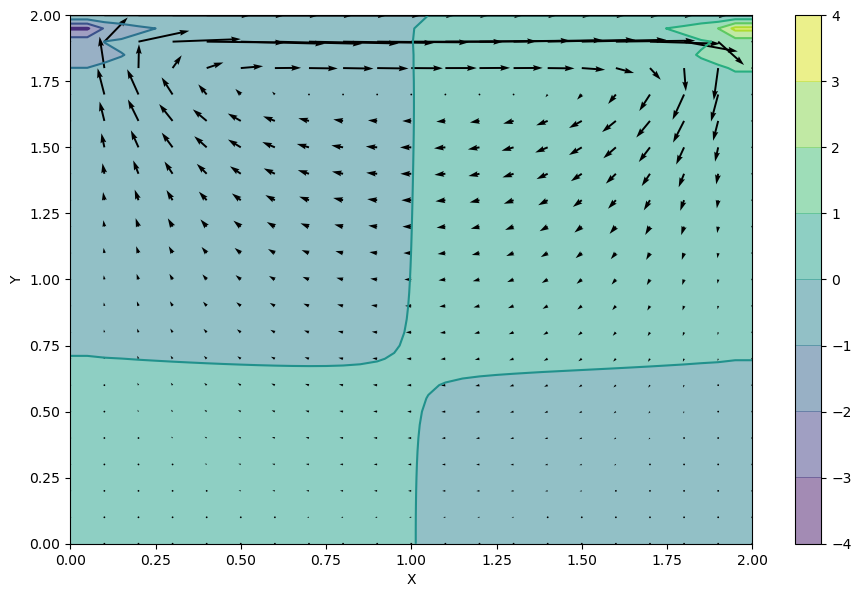

In [162]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

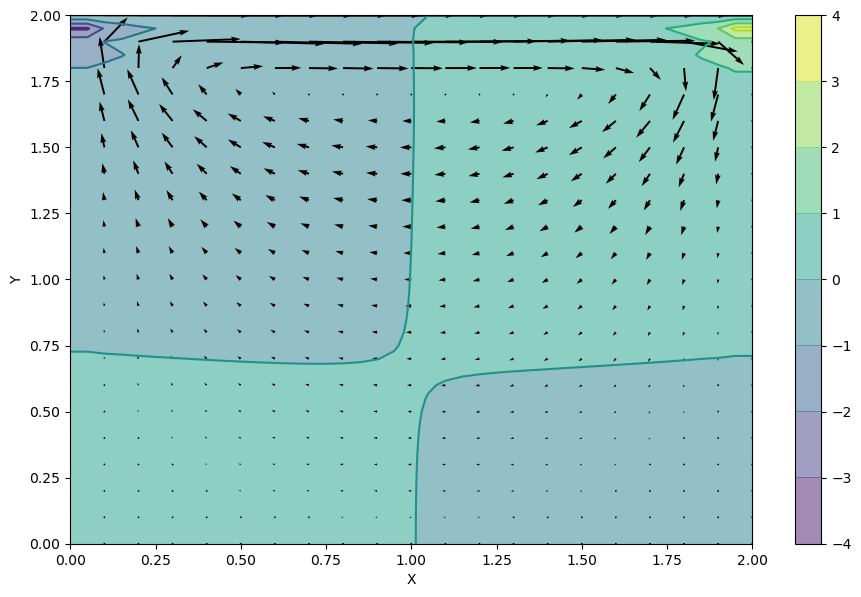

In [163]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
simulation_visuals()

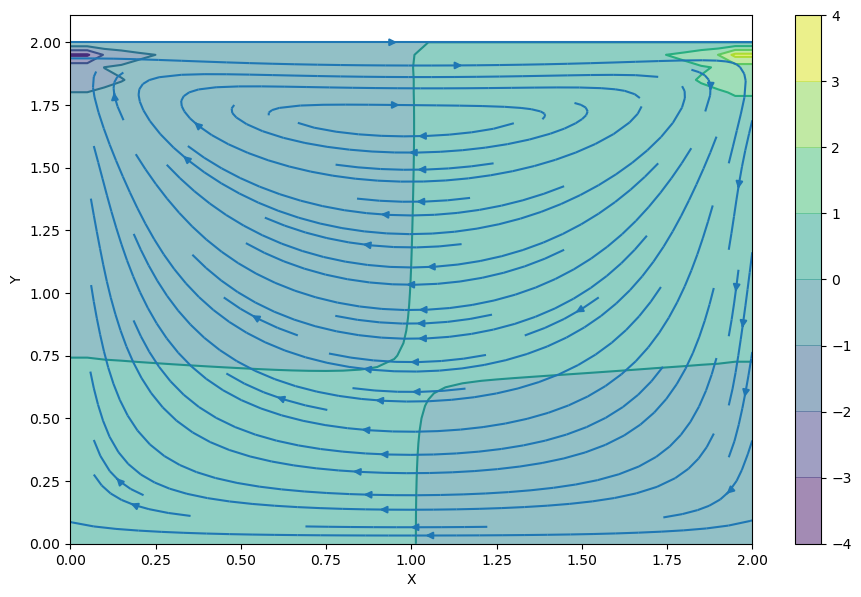

In [164]:
u, v, p = cavity_flow_simulation(1000, u, v, dt, dx, dy, p, rho, nu)
streamplot_visuals()